## Risk Assessment & Root Cause Analysis of HOLX's Finances
#### By: Hayden Allison | 3/22/2024
### Research Questions:
1. Can Trade Volume and other equity impactful attributes, like Net Income, suffice the necessity of having performance predictors?
2. Is the Regression model adequate for evaluating a company's annual performance or does it exaggerate losses and gains?
3. When there is problematic balances outlined in a balance statement, is the present and future risk measurable??

In [162]:
import pandas as pd
import random
import pygwalker as pyg
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from datetime import date, timedelta
import math as m
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.weightstats import ztest
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.compose import make_column_transformer as mct
from sklearn.pipeline import make_pipeline
from statsmodels.stats.proportion import proportions_ztest
from sklearn.model_selection import train_test_split
from sklearn import set_config
from matplotlib.font_manager import FontProperties
from itertools import chain
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tools.tools import maybe_unwrap_results
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsforecast import StatsForecast 
from statsforecast.utils import ConformalIntervals
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.stats.diagnostic import acorr_ljungbox
from datasetsforecast.losses import mae, mase, rmse, mse
from statsforecast.models import GARCH, MSTL, AutoARIMA, AutoCES, AutoTheta, AutoETS
from statsforecast.arima import arima_string
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, KFold, StratifiedKFold 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn import metrics
from IPython.display import display_html
from typing import Type
from pylab import rcParams
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
# warnings.filterwarnings("ignore", category=UserWarning)
# removes copy warning
pd.options.mode.chained_assignment = None
pd.set_option('display.precision', 3)

import pygwalker as pyg
''' walker = pyg.walk(
    roots,
    spec="./chart_meta_0.json",   this json file will save your chart state, you need to click save button in ui mannual when you finish a chart, 'autosave' will be supported in the future.
    use_kernel_calc=True,         set `use_kernel_calc=True`, supports bigger datasets (<=100GB).
)
'''
import sweetviz as sv
# advert_report = sv.analyze(roots)
# advert_report.show_html('Advertising.html')

# beautiful chart settings
style_options = ['seaborn-v0_8-darkgrid', 'fivethirtyeight', 'dark_background', 'ggplot']
palettes = ["https://seaborn.pydata.org/tutorial/color_palettes.html"]
plt.style.use('ggplot')
plt.rcParams['lines.linewidth'] = 1.5
dark_style = { 'figure.facecolor': '#212946', 'axes.facecolor': '#212946', 'savefig.facecolor':'#212946', 'grid.color': '#2A3459',
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False,
    'grid.linewidth': '1',
    'text.color': '.9',
    'axes.labelcolor': '.9',
    'xtick.color': '.9',
    'ytick.color': '.9',
    'lines.color': 'lime',
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.titlepad': 20}
plt.rcParams.update(dark_style)
rcParams['figure.figsize'] = (20,7)

class LinearRegDiagnostic():
    """
        (1) Added two more ways to compute the Cook's Distance (D) threshold:
            * 'baseR': D > 1 and D > 0.5 (default)
            * 'convention': D > 4/n
            * 'dof': D > 4 / (n - k - 1)
    """

    def __init__(self,
                 results: Type[sm.regression.linear_model.RegressionResultsWrapper]) -> None:

        if isinstance(results, sm.regression.linear_model.RegressionResultsWrapper) is False:
            raise TypeError("result must be instance of statsmodels.regression.linear_model.RegressionResultsWrapper object")

        self.results = maybe_unwrap_results(results)

        self.y_true = self.results.model.endog
        self.y_predict = self.results.fittedvalues
        self.xvar = self.results.model.exog
        self.xvar_names = self.results.model.exog_names

        self.residual = np.array(self.results.resid)
        influence = self.results.get_influence()
        self.residual_norm = influence.resid_studentized_internal
        self.leverage = influence.hat_matrix_diag
        self.cooks_distance = influence.cooks_distance[0]
        self.nparams = len(self.results.params)
        self.nresids = len(self.residual_norm)

    def __call__(self, **kwargs):
        fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(16,10))
        self.residual_plot(ax=ax[0,2])
        self.QQ_plot(ax=ax[0,1])
        self.reg_plot(ax=ax[0,0])
        self.scale_location_plot(ax=ax[1,0])
        self.leverage_plot(
            ax=ax[1,1],
            high_leverage_threshold = kwargs.get('high_leverage_threshold'),
            cooks_threshold = kwargs.get('cooks_threshold'))
        self.ACF_plot(ax=ax[1,2])
        plt.tight_layout()
        plt.show()
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,6))
        self.residual_noise(ax=ax)
        plt.show()

        return self.vif_table(), fig, ax,

    def residual_noise(self, ax=None):
        return ax.plot(self.residual)

    def residual_plot(self, ax=None, color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        sns.residplot(
            x=self.y_predict,
            y=self.residual,
            lowess=True,
            scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        residual_abs = np.abs(self.residual)
        abs_resid = np.flip(np.argsort(residual_abs), 0)
        abs_resid_top_3 = abs_resid[:3]
        for i in abs_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], self.residual[i]),
                color='#8d05e8')

        ax.set_title('Linearity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel('Residuals')
        return ax

    def reg_plot(self, ax=None):
        if ax is None:
            fig, ax = plt.subplots()

        plot_df = pd.DataFrame({'actual': self.y_true, 'predicted': self.y_predict})

        sns.regplot(data=plot_df, x='actual', y='predicted', color='#87ae73', marker="x",
                    line_kws={'color': '#8d05e8', 'lw': 2, 'ls': ':'}, ax=ax)

        ax.set_title('Actual vs Predicted', fontweight="bold")
        ax.set_xlabel('Actual Values')
        ax.set_ylabel('Predicted Values')
        return ax

    def scale_location_plot(self, ax=None, color='C4'):
        if ax is None:
            fig, ax = plt.subplots()

        residual_norm_abs_sqrt = np.sqrt(np.abs(self.residual_norm))

        ax.scatter(self.y_predict, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73');
        sns.regplot(
            x=self.y_predict,
            y=residual_norm_abs_sqrt,
            scatter=False, ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        abs_sq_norm_resid = np.flip(np.argsort(residual_norm_abs_sqrt), 0)
        abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
        for i in abs_sq_norm_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], residual_norm_abs_sqrt[i]),
                color='#8d05e8')

        ax.set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$');
        return ax

    def leverage_plot(self, ax=None, high_leverage_threshold=False, cooks_threshold='convention', color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        ax.scatter(
            self.leverage,
            self.residual_norm,
            alpha=0.5,
            color='#87ae73');

        sns.regplot(
            x=self.leverage,
            y=self.residual_norm,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        leverage_top_3 = np.flip(np.argsort(self.cooks_distance), 0)[:3]
        for i in leverage_top_3:
            ax.annotate(
                i,
                xy=(self.leverage[i], self.residual_norm[i]),
                color = '#8d05e8')

        factors = []
        if cooks_threshold == 'baseR' or cooks_threshold is None:
            factors = [1, 0.5]
        elif cooks_threshold == 'convention':
            factors = [4/self.nresids]
        elif cooks_threshold == 'dof':
            factors = [4/ (self.nresids - self.nparams)]
        else:
            raise ValueError("threshold_method must be one of the following: 'convention', 'dof', or 'baseR' (default)")
        for i, factor in enumerate(factors):
            label = "Cook's distance" if i == 0 else None
            xtemp, ytemp = self.__cooks_dist_line(factor)
            ax.plot(xtemp, ytemp, label=label, lw=1.25, ls='--', color='#910951')
            ax.plot(xtemp, np.negative(ytemp), lw=1.25, ls='--', color='#910951')

        if high_leverage_threshold:
            high_leverage = 2 * self.nparams / self.nresids
            if max(self.leverage) > high_leverage:
                ax.axvline(high_leverage, label='High leverage', ls='-.', color='#8d05e8', lw=1)

        ax.axhline(0, ls='dotted', color='black', lw=1.25)
        ax.set_xlim(0, max(self.leverage)+0.01)
        ax.set_ylim(min(self.residual_norm)-0.1, max(self.residual_norm)+0.1)
        ax.set_title('Leverage (none outside cook\'s)', fontweight="bold")
        ax.set_xlabel('Leverage')
        ax.set_ylabel('Standardized Residuals')
        plt.legend(loc='best')
        return ax
        
    def QQ_plot(self, ax=None):
        stats.probplot(self.residual, dist='norm', plot=ax)
        ax.set_title('Normality (~on line)', fontweight="bold")
        return ax

    def ACF_plot(self, ax=None):
        plot_acf(self.residual, lags=60, ax=ax, color='orange', zero=False)
        ax.set_title('Noise (none significant)', fontweight="bold")
        return ax

    def vif_table(self):
        vif_df = pd.DataFrame()
        vif_df["Features"] = self.xvar_names
        vif_df["VIF Factor"] = [variance_inflation_factor(self.xvar, i) for i in range(self.xvar.shape[1])]

        return (vif_df
                .sort_values("VIF Factor")
                .round(2))


    def __cooks_dist_line(self, factor):
        """
        Helper function for plotting Cook's distance curves
        """
        p = self.nparams
        formula = lambda x: np.sqrt((factor * p * (1 - x)) / x)
        x = np.linspace(0.001, max(self.leverage), 50)
        y = formula(x)
        return x, y


    def __qq_top_resid(self, quantiles, top_residual_indices):
        """
        Helper generator function yielding the index and coordinates
        """
        offset = 0
        quant_index = 0
        previous_is_negative = None
        for resid_index in top_residual_indices:
            y = self.residual_norm[resid_index]
            is_negative = y < 0
            if previous_is_negative == None or previous_is_negative == is_negative:
                offset += 1
            else:
                quant_index -= offset
            x = quantiles[quant_index] if is_negative else np.flip(quantiles, 0)[quant_index]
            quant_index += 1
            previous_is_negative = is_negative
            yield resid_index, x, y

# level= is for KPSS. 'ct' or 'c' or none
# KPSS * ADF are p-values
def diagnostic_plots(x, predictions, residuals, level=None, lags=60):    
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 16))
    residuals.plot(ax=axes[0][0], title='Residuals')
    residuals.rolling(21).mean().plot(ax=axes[0][0], c='k', lw=1)
    probplot(residuals, plot=axes[0][1])
    mean, var, skew, kurtosis = moment(residuals, moment=[1, 2, 3, 4])
    s = f'Mean: {mean:>12.2f}\nSD: {np.sqrt(var):>16.2f}\nSkew: {skew:12.2f}\nKurtosis:{kurtosis:9.2f}'
    axes[0][1].text(x=.02, y=.75, s=s, transform=axes[0][1].transAxes)
    plot_acf(x=residuals, lags=lags, zero=False, ax=axes[1][0])
    plot_pacf(residuals, lags=lags, zero=False, ax=axes[1][1])
    # Plot for Linearity
    sns.residplot(x=predictions,
                  y=residuals,
                  lowess=True,
                  scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
                  line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                  ax=axes[2][0])
    # Plot for Homoscedasticity
    residual_norm_abs_sqrt = np.sqrt(np.abs(residuals))
    axes[2][1].scatter(predictions, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73')
    sns.regplot(x=predictions,
                y=residual_norm_abs_sqrt,
                scatter=False, ci=False,
                lowess=True,
                line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                ax=axes[2][1])
    axes[2][1].set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
    axes[2][1].set_xlabel('Fitted values')
    axes[2][1].set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$')
    axes[2][0].set_title('Linearity (~horizontal line)')
    axes[2][0].set_xlabel('Fitted values')
    axes[2][0].set_ylabel('Residuals')
    axes[1][0].set_xlabel('Lag')
    axes[1][1].set_xlabel('Lag')
    KP = kpss(x, level)
    q_p = np.max(q_stat(acf(x, nlags=lags), len(x))[1])
    ljung = acorr_ljungbox(x, lags, boxpierce=True)
    ADF = adfuller(x)
    fig.suptitle(f'ADF: {np.max(q_p):.2f}  |  P: {ADF[1]:.2f}    &    '+f'KPSS: {KP[0]:.2f}  |  P: {KP[1]:.2f}\n'+f'Ljung: {ljung.iloc[:, 0].max():.2f}  |  P: {ljung.iloc[:, 1].max():.2f}    &    Box: {ljung.iloc[:, 2].max():.2f}  |  P: {ljung.iloc[:, 3].max():.2f}', fontsize=14)
    sns.despine()
    fig.tight_layout()
    plt.show()

In [2]:
def SSstandardize(df):
    SS = StandardScaler()
    if df.shape[1] > 1:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, SS
    else:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df).reshape(-1)
        return Sarray, SS

def SSstandardizeII(df, HT):
    SS = StandardScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = SS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), SS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, SS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, SS

def RSstandardize(df):
    RS = RobustScaler()
    if df.shape[1] > 1:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, RS
    else:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df).reshape(-1)
        return Sarray, RS

def RSstandardizeII(df, HT):
    RS = RobustScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = RS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), RS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, RS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, RS

def check_stationarity(**kwargs):
    result = adfuller(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m", "\n")
    else:
        print("\x1b[31mNon-stationary\x1b[0m", "\n")

def check_stationarityII(**kwargs):
    result = kpss(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('KPSS Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[3]['5%'] > result[0]):
        print("\x1b[31mNon-stationary\x1b[0m", "\n")
    else:
        print("\u001b[32mStationary\u001b[0m", "\n")

# y_pred is the true y values along with results from the a model and it's confidence intervals
# accepts a list of each input to create a dataframe of metrics per model
# DON'T USE METRIC NAMES OUTSIDE OF FUNCTION (ex: mae), IT WILL BERAK THE CODE
def evaluate_performance(y_hist, y_pred, model, seasonality=1):
    evaluation = {}
    for c, mod in enumerate(model):
        evaluation[mod] = {}
        for metric in [mase, mae, mse, rmse]:
            metric_name = metric.__name__
            if metric_name =='mase':
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, 
                                                    y_pred[c][mod].values, 
                                                    y_hist[c]['y'].values, seasonality)
            else:
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, y_pred[c][mod].values)
            
        # solving for MAD
        deviations = []
        meanG = y_pred[c][mod].mean()
        for val in y_pred[c]['y'].values:
            ans = abs(val-meanG)
            deviations.append(ans)
        MAD = round(np.sum(np.array(deviations))/len(y_pred[c]), 2)
        evaluation[mod]['mad'] = MAD
    
    return pd.DataFrame(evaluation).T

def step_sequenceII(df, proportion_in, proportion_out):
    times = df['date'].copy()
    length = len(times)
    steps_in = int(m.ceil(length*proportion_in))
    steps_out = int(m.floor(length*proportion_out))
    slide_length = length-steps_in
    steps_frame = int(m.ceil(slide_length*proportion_out))-2
    return steps_in, steps_out, steps_frame

def step_sequence(df, proportion_in):
    times = df['ds'].copy()
    length = len(times)
    steps_size = int(m.ceil(length*proportion_in))
    steps_frame = int(m.ceil(length/steps_size))
    return steps_size, steps_frame

def plotSeasonalDecompose(
    x,
    model='additive',
    filt=None,
    period=None,
    two_sided=True,
    extrapolate_trend=0,
    title="Seasonal Decomposition"):

    result = seasonal_decompose(
            x, model=model, filt=filt, period=period,
            two_sided=two_sided, extrapolate_trend=extrapolate_trend)
    fig = make_subplots(
            rows=4, cols=1,
            subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"])
    for idx, col in enumerate(['observed', 'trend', 'seasonal', 'resid']):
        fig.add_trace(
            go.Scatter(x=result.observed.index, y=getattr(result, col), mode='lines'),
                row=idx+1, col=1,
            )
    return fig

In [3]:
# y_pred is the true y values along with results from the a model and it's confidence intervals
# accepts a list of each input to create a dataframe of metrics per model
# DON'T USE METRIC NAMES OUTSIDE OF FUNCTION (ex: mae), IT WILL BERAK THE CODE
def evaluate_performance(y_hist, y_pred, model, seasonality=1):
    evaluation = {}
    for c, mod in enumerate(model):
        evaluation[mod] = {}
        for metric in [mase, mae, mse, rmse]:
            metric_name = metric.__name__
            if metric_name =='mase':
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, 
                                                    y_pred[c][mod].values, 
                                                    y_hist[c]['y'].values, seasonality)
            else:
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, y_pred[c][mod].values)
            
        # solving for MAD
        deviations = []
        meanG = y_pred[c][mod].mean()
        for val in y_pred[c]['y'].values:
            ans = abs(val-meanG)
            deviations.append(ans)
        MAD = round(np.sum(np.array(deviations))/len(y_pred[c]), 2)
        evaluation[mod]['mad'] = MAD
    
    return pd.DataFrame(evaluation).T

def step_sequenceII(df, proportion_in, proportion_out):
    times = df['date'].copy()
    length = len(times)
    steps_in = int(m.ceil(length*proportion_in))
    steps_out = int(m.floor(length*proportion_out))
    slide_length = length-steps_in
    steps_frame = int(m.ceil(slide_length*proportion_out))-2
    return steps_in, steps_out, steps_frame

def step_sequence(df, proportion_in):
    times = df['ds'].copy()
    length = len(times)
    steps_size = int(m.ceil(length*proportion_in))
    steps_frame = int(m.ceil(length/steps_size))
    return steps_size, steps_frame

### Data Cleansing & Assessing

In [4]:
securities = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\1. 03222024 - Regression & Risk Analysis on Finances\tables\securities.csv")
securities

,Ticker symbol,Security,SEC filings,GICS Sector,GICS Sub Industry,Address of Headquarters,Date first added,CIK
0,MMM,3M Company,reports,Industrials,Industrial Conglomerates,"St. Paul, Minnesota",NaN,66740
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,"North Chicago, Illinois",1964-03-31,1800
2,ABBV,AbbVie,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152
3,ACN,Accenture plc,reports,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373
4,ATVI,Activision Blizzard,reports,Information Technology,Home Entertainment Software,"Santa Monica, California",2015-08-31,718877
...,...,...,...,...,...,...,...,...
500,YHOO,Yahoo Inc.,reports,Information Technology,Internet Software & Services,"Sunnyvale, California",NaN,1011006
501,YUM,Yum! Brands Inc,reports,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061
502,ZBH,Zimmer Biomet Holdings,reports,Health Care,Health Care Equipment,"Warsaw, Indiana",NaN,1136869
503,ZION,Zions Bancorp,reports,Financials,Regional Banks,"Salt Lake City, Utah",NaN,109380


In [5]:
print(securities.isna().sum())
print(securities.columns)

Ticker symbol                0
Security                     0
SEC filings                  0
GICS Sector                  0
GICS Sub Industry            0
Address of Headquarters      0
Date first added           198
CIK                          0
dtype: int64
Index(['Ticker symbol', 'Security', 'SEC filings', 'GICS Sector',
       'GICS Sub Industry', 'Address of Headquarters', 'Date first added',
       'CIK'],
      dtype='object')


In [6]:
securities.drop(['SEC filings','Address of Headquarters', 'Date first added', 'CIK'], axis=1, inplace=True)
print(securities.columns)

Index(['Ticker symbol', 'Security', 'GICS Sector', 'GICS Sub Industry'], dtype='object')


In [7]:
securities['GICS Sector'].value_counts()

GICS Sector
Consumer Discretionary         85
Industrials                    69
Information Technology         68
Financials                     64
Health Care                    59
Consumer Staples               37
Energy                         36
Real Estate                    29
Utilities                      28
Materials                      25
Telecommunications Services     5
Name: count, dtype: int64

In [8]:
securities['GICS Sub Industry'].value_counts()

GICS Sub Industry
Industrial Conglomerates              21
Internet Software & Services          20
Oil & Gas Exploration & Production    18
Health Care Equipment                 17
REITs                                 16
                                      ..
Trucking                               1
Agricultural Products                  1
Electronic Equipment & Instruments     1
Distributors                           1
Casinos & Gaming                       1
Name: count, Length: 124, dtype: int64

In [9]:
securities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 505 entries, 0 to 504
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Ticker symbol      505 non-null    object
 1   Security           505 non-null    object
 2   GICS Sector        505 non-null    object
 3   GICS Sub Industry  505 non-null    object
dtypes: object(4)
memory usage: 15.9+ KB


In [10]:
prices = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\1. 03222024 - Regression & Risk Analysis on Finances\tables\prices-split-adjusted.csv")
prices

,date,symbol,open,close,low,high,volume
0,2016-01-05,WLTW,123.43,125.84,122.31,126.25,2.164e+06
1,2016-01-06,WLTW,125.24,119.98,119.94,125.54,2.386e+06
2,2016-01-07,WLTW,116.38,114.95,114.93,119.74,2.490e+06
3,2016-01-08,WLTW,115.48,116.62,113.50,117.44,2.006e+06
4,2016-01-11,WLTW,117.01,114.97,114.09,117.33,1.409e+06
...,...,...,...,...,...,...,...
851259,2016-12-30,ZBH,103.31,103.20,102.85,103.93,9.738e+05
851260,2016-12-30,ZION,43.07,43.04,42.69,43.31,1.938e+06
851261,2016-12-30,ZTS,53.64,53.53,53.27,53.74,1.701e+06
851262,2016-12-30,AIV,44.73,45.45,44.41,45.59,1.381e+06


In [11]:
prices.columns

Index(['date', 'symbol', 'open', 'close', 'low', 'high', 'volume'], dtype='object')

In [12]:
prices.dropna(inplace=True)
print(prices.isna().sum())
prices.close.value_counts()

date      0
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64


close
35.000     183
34.000     179
34.500     178
47.000     177
36.000     171
          ... 
30.480       1
83.377       1
7.444        1
342.980      1
367.090      1
Name: count, Length: 98520, dtype: int64

In [13]:
prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 851264 entries, 0 to 851263
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    851264 non-null  object 
 1   symbol  851264 non-null  object 
 2   open    851264 non-null  float64
 3   close   851264 non-null  float64
 4   low     851264 non-null  float64
 5   high    851264 non-null  float64
 6   volume  851264 non-null  float64
dtypes: float64(5), object(2)
memory usage: 45.5+ MB


In [14]:
prices.describe()

,open,close,low,high,volume
count,851264.000,851264.000,851264.000,851264.000,8.513e+05
mean,64.994,65.012,64.337,65.640,5.415e+06
std,75.204,75.201,74.460,75.907,1.249e+07
min,1.660,1.590,1.500,1.810,0.000e+00
25%,31.270,31.293,30.940,31.620,1.222e+06
50%,48.460,48.480,47.970,48.960,2.476e+06
75%,75.120,75.140,74.400,75.850,5.222e+06
max,1584.440,1578.130,1549.940,1600.930,8.596e+08


In [15]:
#running multiple queries to assess accuracy of stock price @ close outliers
prices.query('(close > 700) & (close < 800)').sort_values(by='close')

,date,symbol,open,close,low,high,volume
363363,2013-01-29,PCLN,703.16,700.29,694.02,710.58,5.288e+05
772994,2016-05-19,GOOG,702.36,700.32,696.80,706.00,1.670e+06
729082,2016-01-13,GOOG,730.85,700.56,698.61,734.74,2.502e+06
604974,2015-01-15,CMG,709.00,700.78,698.11,715.10,3.446e+05
391916,2013-04-24,PCLN,702.98,700.80,693.72,704.53,2.809e+05
...,...,...,...,...,...,...,...
848315,2016-12-22,AZO,801.40,799.61,790.96,806.77,2.767e+05
804964,2016-08-19,GOOGL,799.79,799.65,796.88,801.23,1.121e+06
789315,2016-07-07,AZO,804.84,799.66,797.69,809.06,2.035e+05
815464,2016-09-20,GOOGL,800.00,799.78,798.26,802.75,1.049e+06


In [16]:
prices.symbol.value_counts()

symbol
KSU     1762
NOC     1762
ORCL    1762
OMC     1762
OKE     1762
        ... 
KHC      378
HPE      304
CSRA     284
WLTW     251
FTV      126
Name: count, Length: 501, dtype: int64

In [17]:
metrics = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\1. 03222024 - Regression & Risk Analysis on Finances\tables\fundamentals.csv")
metrics.columns

Index(['Unnamed: 0', 'Ticker Symbol', 'Period Ending', 'Accounts Payable',
       'Accounts Receivable', 'Add'l income/expense items', 'After Tax ROE',
       'Capital Expenditures', 'Capital Surplus', 'Cash Ratio',
       'Cash and Cash Equivalents', 'Changes in Inventories', 'Common Stocks',
       'Cost of Revenue', 'Current Ratio', 'Deferred Asset Charges',
       'Deferred Liability Charges', 'Depreciation',
       'Earnings Before Interest and Tax', 'Earnings Before Tax',
       'Effect of Exchange Rate',
       'Equity Earnings/Loss Unconsolidated Subsidiary', 'Fixed Assets',
       'Goodwill', 'Gross Margin', 'Gross Profit', 'Income Tax',
       'Intangible Assets', 'Interest Expense', 'Inventory', 'Investments',
       'Liabilities', 'Long-Term Debt', 'Long-Term Investments',
       'Minority Interest', 'Misc. Stocks', 'Net Borrowings', 'Net Cash Flow',
       'Net Cash Flow-Operating', 'Net Cash Flows-Financing',
       'Net Cash Flows-Investing', 'Net Income', 'Net Income Ad

In [18]:
metrics.isna().sum()
print(metrics.shape)
print(prices.shape)

(1781, 79)
(851264, 7)


In [19]:
pd.set_option('display.max_columns', None)
metrics.describe()

,Unnamed: 0,Accounts Payable,Accounts Receivable,Add'l income/expense items,After Tax ROE,Capital Expenditures,Capital Surplus,Cash Ratio,Cash and Cash Equivalents,Changes in Inventories,Common Stocks,Cost of Revenue,Current Ratio,Deferred Asset Charges,Deferred Liability Charges,Depreciation,Earnings Before Interest and Tax,Earnings Before Tax,Effect of Exchange Rate,Equity Earnings/Loss Unconsolidated Subsidiary,Fixed Assets,Goodwill,Gross Margin,Gross Profit,Income Tax,Intangible Assets,Interest Expense,Inventory,Investments,Liabilities,Long-Term Debt,Long-Term Investments,Minority Interest,Misc. Stocks,Net Borrowings,Net Cash Flow,Net Cash Flow-Operating,Net Cash Flows-Financing,Net Cash Flows-Investing,Net Income,Net Income Adjustments,Net Income Applicable to Common Shareholders,Net Income-Cont. Operations,Net Receivables,Non-Recurring Items,Operating Income,Operating Margin,Other Assets,Other Current Assets,Other Current Liabilities,Other Equity,Other Financing Activities,Other Investing Activities,Other Liabilities,Other Operating Activities,Other Operating Items,Pre-Tax Margin,Pre-Tax ROE,Profit Margin,Quick Ratio,Research and Development,Retained Earnings,Sale and Purchase of Stock,"Sales, General and Admin.",Short-Term Debt / Current Portion of Long-Term Debt,Short-Term Investments,Total Assets,Total Current Assets,Total Current Liabilities,Total Equity,Total Liabilities,Total Liabilities & Equity,Total Revenue,Treasury Stock,For Year,Earnings Per Share,Estimated Shares Outstanding
count,1781.000,1.781e+03,1.781e+03,1.781e+03,1781.000,1.781e+03,1.781e+03,1482.000,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1482.000,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1781.000,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1781.000,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1781.000,1781.000,1781.000,1482.000,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1.781e+03,1608.000,1562.000,1.562e+03
mean,890.000,4.673e+09,-6.353e+07,6.909e+07,43.601,-1.252e+09,5.352e+09,74.457,8.521e+09,-6.788e+07,1.609e+09,1.235e+10,186.771,5.908e+08,1.611e+09,1.084e+09,2.710e+09,2.375e+09,-3.849e+07,9.134e+07,8.534e+09,3.930e+09,46.763,7.189e+09,6.694e+08,1.964e+09,3.263e+08,1.467e+09,-9.679e+08,1.790e+08,8.477e+09,2.321e+10,4.167e+08,4.244e+07,5.155e+08,5.273e+07,3.258e+09,-4.576e+08,-2.718e+09,1.706e+09,2.198e+08,1.688e+09,1.748e+09,3.242e+09,2.185e+08,2.269e+09,18.178,4.860e+09,6.071e+08,1.501e+10,-6.208e+08,4.844e+08,-4.054e+08,9.077e+09,7.145e+06,8.688e+08,17.755,59.645,13.958,146.953,3.503e+08,9.207e+09,-7.652e+08,3.981e+09,3.055e+09,1.124e+09,5.571e+10,6.726e+09,4.700e+09,1.189e+10,4.380e+10,5.569e+10,2.029e+10,-3.952e+09,2013.305,3.354,6.024e+08
std,514.275,1.406e+10,7.563e+08,6.848e+08,233.924,2.980e+09,1.134e+10,102.298,5.432e+10,3.903e+08,9.178e+09,3.041e+10,128.067,2.667e+09,4.549e+09,2.188e+09,6.145e+09,5.721e+09,1.627e+08,7.245e+08,1.928e+10,7.926e+09,25.439,1.361e+10,1.830e+09,6.802e+09,1.054e+09,3.708e+09,7.970e+09,2.380e+09,2.751e+10,1.393e+11,3.183e+09,1.845e+08,5.385e+09,2.270e+09,7.398e+09,9.051e+09,1.060e+10,3.993e+09,2.664e+09,3.957e+09,4.335e+09,7.655e+09,1.215e+09,5.061e+09,20.504,2.517e+10,1.587e+09,1.086e+11,3.054e+09,6.517e+09,3.188e+09,5.343e+10,3.291e+09,2.905e+09,21.380,330.447,17.560,118.625,1.234e+09,2.548e+10,2.748e+09,9.065e+09,2.118e+10,5.704e+09,2.034e+11,1.345e+10,9.539e+09,2.584e+10,1.817e+11,2.034e+11,4.095e+10,1.407e+10,19.953,4.696,1.143e+09
min,0.000,0.000e+00,-6.452e+09,-6.768e+09,0.000,-3.798e+10,-7.215e+08,0.000,2.100e+04,-5.562e+09,0.000e+00,0.000e+00,17.000,0.000e+00,0.000e+00,-4.480e+08,-2.793e+10,-2.823e+10,-3.067e+09,-1.633e+09,0.000e+00,0.000e+00,0.

In [20]:
list = []
for item in metrics['Period Ending'].values:
    year = item[:4]
    list.append(year)
metrics['Period Ending'] = list
metrics['Period Ending'].value_counts()

Period Ending
2015    445
2013    439
2014    436
2012    236
2016    220
2003      1
2004      1
2006      1
2007      1
2017      1
Name: count, dtype: int64

In [21]:
new_metrics = metrics.query('(`Period Ending` == "2013") | (`Period Ending` == "2014") | (`Period Ending` == "2015")')
print(new_metrics['Period Ending'].value_counts())
print(new_metrics['Period Ending'].isna().sum())
new_metrics['Period Ending'] = new_metrics['Period Ending'].astype(int)

Period Ending
2015    445
2013    439
2014    436
Name: count, dtype: int64
0


In [22]:
tickers = [i for i in new_metrics['Ticker Symbol'].values]
tally = {}
for item in tickers:
    amount = tickers.count(item)
    tally[item] = amount

tally_filtered = [i for i in filter(lambda x: tally.get(x)>2, tally)]
new_metrics = new_metrics.query('`Ticker Symbol` in @tally_filtered')
new_metrics.reset_index(drop=True, inplace=True)
new_metrics.drop(columns=['Unnamed: 0'], inplace=True)
print(new_metrics['Period Ending'].value_counts())

Period Ending
2013    428
2014    428
2015    428
Name: count, dtype: int64


#### Adjusting stock market variables dependencies
For this regression analysis, a difference derived from the current day & previous day share price, as well as share volume, is applied for each company. These derived features will be evaluated in a stationary test to determine the appropriate model.

In [23]:
prices['date'] = pd.to_datetime(prices['date'])
prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 851264 entries, 0 to 851263
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    851264 non-null  datetime64[ns]
 1   symbol  851264 non-null  object        
 2   open    851264 non-null  float64       
 3   close   851264 non-null  float64       
 4   low     851264 non-null  float64       
 5   high    851264 non-null  float64       
 6   volume  851264 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 45.5+ MB


In [24]:
# retrieving a sample of the population to optimize code
print(prices.shape)
prices = prices[(prices['date']>='2013-01-01') & (prices['date']<='2015-12-31')].reset_index(drop=True)
print(prices.shape)

(851264, 7)
(371061, 7)


In [25]:
symbols = prices['symbol'].unique()

results_df = pd.DataFrame()

for symbol in symbols:
    temp_df = prices[prices['symbol'] == symbol].sort_values(by='date')
    
    close_diff = [3.14]
    open_diff = [3.14]
    low_diff = [3.14]
    high_diff = [3.14]
    volume_diff = [3.14]
    
    # Calculate differences
    for i in range(1, len(temp_df)):
        close_diff.append(temp_df.iloc[i-1]['close'] - temp_df.iloc[i]['close'])
        open_diff.append(temp_df.iloc[i-1]['open'] - temp_df.iloc[i]['open'])
        low_diff.append(temp_df.iloc[i-1]['low'] - temp_df.iloc[i]['low'])
        high_diff.append(temp_df.iloc[i-1]['high'] - temp_df.iloc[i]['high'])
        volume_diff.append(temp_df.iloc[i-1]['volume'] - temp_df.iloc[i]['volume'])
    
    # Assign the lists to temp_df
    temp_df['close_diff'] = close_diff
    temp_df['open_diff'] = open_diff
    temp_df['low_diff'] = low_diff
    temp_df['high_diff'] = high_diff
    temp_df['volume_diff'] = volume_diff
    
    # Append the modified temp_df to results_df
    results_df = pd.concat([results_df, temp_df], ignore_index=True)

In [26]:
columns_to_check = ['close_diff', 'open_diff', 'low_diff', 'high_diff', 'volume_diff']

for column in columns_to_check:
    # Identify rows where the placeholder value 3.14 exists
    mask = results_df[results_df[column] == 3.14].index
    results_df = results_df.drop(mask)

results_df = results_df.reset_index(drop=True)

# verify the removal for each column
for column in columns_to_check:
    count = results_df[results_df[column] == 3.14].count()
    print(f"Remaining 3.14 values in {column}: {count}")

Remaining 3.14 values in close_diff: date           0
symbol         0
open           0
close          0
low            0
high           0
volume         0
close_diff     0
open_diff      0
low_diff       0
high_diff      0
volume_diff    0
dtype: int64
Remaining 3.14 values in open_diff: date           0
symbol         0
open           0
close          0
low            0
high           0
volume         0
close_diff     0
open_diff      0
low_diff       0
high_diff      0
volume_diff    0
dtype: int64
Remaining 3.14 values in low_diff: date           0
symbol         0
open           0
close          0
low            0
high           0
volume         0
close_diff     0
open_diff      0
low_diff       0
high_diff      0
volume_diff    0
dtype: int64
Remaining 3.14 values in high_diff: date           0
symbol         0
open           0
close          0
low            0
high           0
volume         0
close_diff     0
open_diff      0
low_diff       0
high_diff      0
volume_diff    0
d

In [27]:
results_df

,date,symbol,open,close,low,high,volume,close_diff,open_diff,low_diff,high_diff,volume_diff
0,2013-01-03,A,30.000,30.064,29.742,30.143,5.752e+06,-0.107,0.165,-0.308,0.021,3.038e+06
1,2013-01-04,A,30.143,30.658,29.943,30.722,6.433e+06,-0.594,-0.143,-0.200,-0.579,-6.811e+05
2,2013-01-07,A,30.472,30.436,30.315,30.615,3.590e+06,0.222,-0.329,-0.372,0.107,2.843e+06
3,2013-01-08,A,30.379,30.193,30.114,30.601,3.897e+06,0.243,0.093,0.200,0.014,-3.074e+05
4,2013-01-09,A,30.758,31.009,30.536,31.080,5.738e+06,-0.815,-0.379,-0.422,-0.479,-1.841e+06
...,...,...,...,...,...,...,...,...,...,...,...,...
370557,2015-12-24,CSRA,26.790,28.020,26.680,28.430,7.239e+05,-1.010,0.330,0.220,-1.000,1.102e+06
370558,2015-12-28,CSRA,27.990,29.490,27.880,29.530,1.139e+06,-1.470,-1.200,-1.200,-1.100,-4.148e+05
370559,2015-12-29,CSRA,29.540,29.590,29.245,30.150,1.608e+06,-0.100,-1.550,-1.365,-0.620,-4.693e+05
370560,2015-12-30,CSRA,29.540,29.850,29.460,30.170,1.290e+06,-0.260,0.000,-0.215,-0.020,3.180e+05


In [28]:
results_df['month'] = results_df['date'].dt.month
new_prices = results_df[results_df['month'].isin([11, 12])]
new_prices = new_prices.reset_index(drop=True)
new_prices.month.unique()

array([11, 12])

In [29]:
new_prices['year'] = new_prices['date'].dt.year
new_prices['year'].value_counts()

year
2015    20947
2014    20090
2013    20078
Name: count, dtype: int64

In [30]:
new_prices['date'].values

array(['2013-11-01T00:00:00.000000000', '2013-11-04T00:00:00.000000000',
       '2013-11-05T00:00:00.000000000', ...,
       '2015-12-29T00:00:00.000000000', '2015-12-30T00:00:00.000000000',
       '2015-12-31T00:00:00.000000000'], dtype='datetime64[ns]')

#### I'm interested in the yearly reports that have daily stock performance reporting. Eliminating the non-disclosing companies is required for my modelling.

In [31]:
print(new_metrics.shape)
base_metrics = new_metrics['Ticker Symbol'].unique()
prices_v3 = new_prices.query('symbol in @base_metrics').copy()

(1284, 78)


In [32]:
print(new_metrics['Ticker Symbol'].nunique())
print(prices_v3.symbol.nunique())

428
426


In [33]:
base_prices = pd.unique(prices_v3['symbol'])

# concludes whether all the companies in new_metrics reside within prices_v3
symbol_test = new_metrics.query('`Ticker Symbol` in @base_prices')
print(symbol_test['Ticker Symbol'].nunique())
print(prices_v3.symbol.nunique())

# realigning the dataframes based on companies
prices_v3 = prices_v3.query('symbol in @base_metrics')
prices_v3.symbol.nunique()
symbol_test['Ticker Symbol'].nunique()

426
426


426

In [34]:
# comparing aggregated tables appropriately
pivot_validate = prices_v3.groupby(['symbol', 'year']).mean().copy()
print(pivot_validate.shape)
print(symbol_test.shape)

(1272, 12)
(1278, 78)


In [35]:
prices_v3['symbol'].value_counts()

symbol
AAL     124
MTB     124
PAYX    124
OXY     124
ORLY    124
       ... 
ETFC    124
ALLE    112
CFG      42
NAVI     42
SYF      42
Name: count, Length: 426, dtype: int64

In [36]:
all_companies = [i for i in prices_v3['symbol'].unique()]
random.seed(42)
sample_companies = random.sample(all_companies, 54)
sample_companies.append('HOLX')
throwaway = ['SYF', 'NAVI', 'CFG']
keep = sample_companies

prices_v4 = prices_v3.loc[~(prices_v3['symbol'].isin(throwaway))].copy()
prices_v4 = prices_v4.loc[~(prices_v4['symbol'].isin(keep))].copy()
pivot_prices = prices_v4.groupby(['symbol', 'year']).mean().copy()

metrics_v4 = symbol_test.loc[~(symbol_test['Ticker Symbol'].isin(throwaway))].copy()
metrics_v4 = metrics_v4.loc[~(symbol_test['Ticker Symbol'].isin(keep))].copy()

print(pivot_prices.shape)
print(metrics_v4.shape)

(1104, 12)
(1104, 78)


In [37]:
hypno = symbol_test.loc[symbol_test['Ticker Symbol'].isin(keep)]
hypno['Ticker Symbol'].value_counts()

Ticker Symbol
ABC     3
SBUX    3
KMB     3
KMX     3
LLY     3
LUV     3
MO      3
NTAP    3
ORLY    3
PGR     3
PH      3
PPG     3
PPL     3
SHW     3
HOLX    3
STZ     3
TGNA    3
TIF     3
TSN     3
UHS     3
UNP     3
URBN    3
VRSK    3
VRTX    3
XRX     3
XYL     3
HUM     3
HOG     3
AFL     3
CNP     3
AIG     3
AJG     3
AKAM    3
AME     3
BAX     3
BCR     3
BHI     3
BLL     3
C       3
CI      3
CMS     3
DE      3
HBAN    3
DLPH    3
DLR     3
DLTR    3
DOV     3
DVN     3
EIX     3
ETFC    3
EXPD    3
EXR     3
GWW     3
HAR     3
YHOO    3
Name: count, dtype: int64

In [38]:
sample = prices_v3.loc[prices_v3['symbol'].isin(keep)]
list = []
years_bin = []
for s in sample.symbol.unique():
    for year in [2013, 2014, 2015]:
        agg = sample.loc[(sample['year']==year) & (sample['symbol']==s), 'volume'].mean()
        years_bin.append(year)
        list.append(float(agg))

hypno['AVG volume (millions)'] = list
hypno['year'] = years_bin

keep = ['Ticker Symbol', 'year', 'Current Ratio', 'Quick Ratio', 'Cash Ratio', 'Net Cash Flows-Investing', 'Net Cash Flow-Operating',
        'Net Income', 'Total Assets', 'Estimated Shares Outstanding', 'AVG volume (millions)']
hypno = hypno[keep]

hypno.rename({'Ticker Symbol':'symbol', 'Net Cash Flows-Investing':'NCFI', 'Net Cash Flow-Operating': 'NCFO', 'Estimated Shares Outstanding':'ESO',
             'Total Assets':'TA', 'Net Income':'NI', 'Cash Ratio':'CRC', 'Quick Ratio':'QR', 'Current Ratio':'CR'}, inplace=True, axis=1)

In [39]:
pivot_prices.head(5)

date     open    close      low     high  \
symbol year                                                                     
AAL    2013 2013-11-30 16:58:32.195121920   24.306   24.241   23.875   24.713   
       2014 2014-12-01 04:05:51.219512320   47.200   47.300   46.492   48.078   
       2015 2015-11-30 21:08:34.285714176   43.407   43.345   42.834   43.940   
AAPL   2013 2013-11-30 16:58:32.195121920   77.484   77.509   76.965   78.077   
       2014 2014-12-01 04:05:51.219512320  112.809  112.816  111.707  113.975   

                volume  close_diff  open_diff  low_diff  high_diff  \
symbol year                                                          
AAL    2013  1.395e+07      -0.080     -0.052    -0.065     -0.058   
       2014  1.311e+07      -0.300     -0.312    -0.305     -0.314   
       2015  7.357e+06       0.092      0.077     0.092      0.100   
AAPL   2013  7.489e+07      -0.134     -0.102    -0.114     -0.118   
       2014  4.620e+07      -0.058     -0.117    -0.073     -0.124   

             volume_diff   month  
symbol year                       
AAL    2013   -27739.024  11.512  
       2014    58102.439  11.537  
       2015    42876.190  11.524  
AAPL   2013   320804.878  11.512  
       2014    78924.390  11.537

In [40]:
prices_v4.head(2)

,date,symbol,open,close,low,high,volume,close_diff,open_diff,low_diff,high_diff,volume_diff,month,year
124,2013-11-01,AAL,22.04,22.44,21.60,22.47,7.191e+06,-0.47,0.56,0.37,0.39,-1.161e+06,11,2013
125,2013-11-04,AAL,22.60,22.71,22.57,23.90,1.996e+07,-0.27,-0.56,-0.97,-1.43,-1.277e+07,11,2013


In [41]:
prices_v4['volume'] = prices_v4['volume']/1000000
prices_v4['volume_diff'] = prices_v4['volume_diff']/1000000
prices_v4.rename({'volume':'volume (millions)', 'volume_diff':'volume_diff (millions)'}, inplace=True, axis=1)

metrics_v4.reset_index(inplace=True, drop=True)
prices_v4.reset_index(inplace=True, drop=True)

print(prices_v4.shape)
print(pivot_prices.shape)
print(metrics_v4.shape)

(45620, 14)
(1104, 12)
(1104, 78)


In [42]:
counter = 0
list = []
for item in pivot_prices.index.values[0]:
    if item != metrics_v4.loc[counter, 'Ticker Symbol']:
        list.append(False)
        break
    else:
        list.append(True)
        counter+=1
if False in list:
    print("not in same symbol order")
else:
    print("in same symbol order")

not in same symbol order


In [43]:
counter = 0
list = []
for item in pivot_prices.index.values[0]:
    if item != metrics_v4.loc[counter, 'Period Ending']:
        list.append(False)
        break
    else:
        list.append(True)
        counter+=1
if False in list:
    print("not in same year order")
else:
    print("in same year order")

not in same year order


In [44]:
metrics_v4.head(4)

,Ticker Symbol,Period Ending,Accounts Payable,Accounts Receivable,Add'l income/expense items,After Tax ROE,Capital Expenditures,Capital Surplus,Cash Ratio,Cash and Cash Equivalents,Changes in Inventories,Common Stocks,Cost of Revenue,Current Ratio,Deferred Asset Charges,Deferred Liability Charges,Depreciation,Earnings Before Interest and Tax,Earnings Before Tax,Effect of Exchange Rate,Equity Earnings/Loss Unconsolidated Subsidiary,Fixed Assets,Goodwill,Gross Margin,Gross Profit,Income Tax,Intangible Assets,Interest Expense,Inventory,Investments,Liabilities,Long-Term Debt,Long-Term Investments,Minority Interest,Misc. Stocks,Net Borrowings,Net Cash Flow,Net Cash Flow-Operating,Net Cash Flows-Financing,Net Cash Flows-Investing,Net Income,Net Income Adjustments,Net Income Applicable to Common Shareholders,Net Income-Cont. Operations,Net Receivables,Non-Recurring Items,Operating Income,Operating Margin,Other Assets,Other Current Assets,Other Current Liabilities,Other Equity,Other Financing Activities,Other Investing Activities,Other Liabilities,Other Operating Activities,Other Operating Items,Pre-Tax Margin,Pre-Tax ROE,Profit Margin,Quick Ratio,Research and Development,Retained Earnings,Sale and Purchase of Stock,"Sales, General and Admin.",Short-Term Debt / Current Portion of Long-Term Debt,Short-Term Investments,Total Assets,Total Current Assets,Total Current Liabilities,Total Equity,Total Liabilities,Total Liabilities & Equity,Total Revenue,Treasury Stock,For Year,Earnings Per Share,Estimated Shares Outstanding
0,AAL,2013,4.975e+09,-9.300e+07,-2.723e+09,67.0,-3.114e+09,1.059e+10,75.0,2.175e+09,0.000e+00,5.000e+06,1.102e+10,104.0,0.000e+00,9.350e+08,1.020e+09,-1.324e+09,-2.180e+09,0.0,0.0,1.926e+10,4.086e+09,59.0,1.572e+10,-3.460e+08,2.311e+09,8.560e+08,1.012e+09,-1.181e+09,-2.350e+08,1.535e+10,0.000e+00,0.0,0.0,2.208e+09,6.600e+08,6.750e+08,3.799e+09,-3.814e+09,-1.834e+09,1.873e+09,-1.834e+09,-4.489e+09,1.560e+09,5.590e+08,1.399e+09,5.0,2.299e+09,1.465e+09,7.385e+09,-2.032e+09,1.711e+09,4.810e+08,1.492e+10,-5.600e+07,8.530e+08,8.0,80.0,7.0,96.0,0.000e+00,-1.130e+10,0.000e+00,1.291e+10,1.446e+09,8.111e+09,4.228e+10,1.432e+10,1.381e+10,-2.731e+09,4.501e+10,4.228e+10,2.674e+10,0.0,2013.0,-11.25,1.630e+08
1,AAL,2014,4.668e+09,-1.600e+08,-1.500e+08,143.0,-5.311e+09,1.514e+10,60.0,1.768e+09,0.000e+00,7.000e+06,1.562e+10,88.0,0.000e+00,8.290e+08,1.342e+09,4.099e+09,3.212e+09,0.0,0.0,2.308e+10,4.091e+09,63.0,2.703e+10,3.300e+08,2.240e+09,8.870e+08,1.004e+09,1.799e+09,-1.026e+09,1.604e+10,0.000e+00,0.0,0.0,1.700e+08,-1.460e+08,3.080e+09,-3.150e+08,-2.911e+09,2.882e+09,5.420e+08,2.882e+09,2.882e+09,1.771e+09,8.000e+08,4.249e+09,10.0,2.060e+09,8.980e+08,7.059e+09,-4.559e+09,8.170e+08,6.010e+08,1.093e+10,-5.000e+08,1.295e+09,8.0,159.0,7.0,80.0,0.000e+00,-8.562e+09,-1.052e+09,2.069e+10,1.677e+09,6.309e+09,4.322e+10,1.175e+10,1.340e+10,2.021e+09,4.120e+10,4.322e+10,4.265e+10,0.0,2014.0,4.02,7.169e+08
2,AAL,2015,5.102e+09,3.520e+08,-7.080e+08,135.0,-6.151e+09,1.159e+10,51.0,1.085e+09,0.000e+00,6.000e+06,1.110e+10,73.0,2.477e+09,6.670e+08,1.487e+09,5.496e+09,4.616e+09,0.0,0.0,2.751e+10,4.091e+09,73.0,2.989e+10,-2.994e+09,2.249e+09,8.800e+08,8.630e+08,4.430e+08,-6.330e+08,1.833e+10,0.000e+00,0.0,0.0,2.856e+09,-6.040e+08,6.249e+09,-1.259e+09,-5.594e+09,7.610e+09,-2.662e+09,7.610e+09,7.610e+09,1.425e+09,1.051e+09,6.204e+09,15.0,2.103e+09,7.480e+08,6.272e+09,-4.732e+09,9.600e+07,1.140e+08,1.018e+10,9.500e+07,1.364e+09,11.0,82.0,19.0,67.0,0.000e+00,-1.230e+09,-3.846e+09,2.128e+10,2.231e+09,5.864e+09,4.842e+10,9.985e+09,1.360e+10,5.635e+09,4.278e+10,4.842e+10,4.099e+10,0.0,2015.0,11.39,6.681e+08
3,AAPL,2013,3.622e+10,-1.949e+09,1.156e+09,30.0,-8.165e+09,0.000e+00,93.0,1.426e+10,-9.730e+08,1.976e+10,1.066e+11,168.0,0.000e+00,2.625e+09,6.757e+09,5.016e+10,5.016e+10,0.0,0.0,1.660e+10,1.577e+09,38.0,6.430e+10,1.312e+10,4.179e+09,0.000e+00,1.764e+09,-2.404e+10,8.320e+09,1.696e+10,1.062e+11,0.0,0.0,1.690e+10,3.513e+09,5.367e+10,-1.638e+10,-3.377e+10,3.704e

In [45]:
pivot_prices

date     open    close      low     high  \
symbol year                                                                     
AAL    2013 2013-11-30 16:58:32.195121920   24.306   24.241   23.875   24.713   
       2014 2014-12-01 04:05:51.219512320   47.200   47.300   46.492   48.078   
       2015 2015-11-30 21:08:34.285714176   43.407   43.345   42.834   43.940   
AAPL   2013 2013-11-30 16:58:32.195121920   77.484   77.509   76.965   78.077   
       2014 2014-12-01 04:05:51.219512320  112.809  112.816  111.707  113.975   
...                                   ...      ...      ...      ...      ...   
ZION   2014 2014-12-01 04:05:51.219512320   28.547   28.532   28.271   28.801   
       2015 2015-11-30 21:08:34.285714176   29.004   28.939   28.626   29.290   
ZTS    2013 2013-11-30 16:58:32.195121920   31.733   31.705   31.419   31.954   
       2014 2014-12-01 04:05:51.219512320   42.831   42.887   42.343   43.339   
       2015 2015-11-30 21:08:34.285714176   46.449   46.516   45.962   46.949   

                volume  close_diff  open_diff  low_diff  high_diff  \
symbol year                                                          
AAL    2013  1.395e+07      -0.080     -0.052    -0.065     -0.058   
       2014  1.311e+07      -0.300     -0.312    -0.305     -0.314   
       2015  7.357e+06       0.092      0.077     0.092      0.100   
AAPL   2013  7.489e+07      -0.134     -0.102    -0.114     -0.118   
       2014  4.620e+07      -0.058     -0.117    -0.073     -0.124   
...                ...         ...        ...       ...        ...   
ZION   2014  2.303e+06       0.011      0.004     0.007      0.006   
       2015  2.767e+06       0.035      0.054     0.036      0.047   
ZTS    2013  3.507e+06      -0.025     -0.020    -0.020     -0.013   
       2014  5.595e+06      -0.143     -0.140    -0.145     -0.146   
       2015  3.045e+06      -0.117     -0.108    -0.117     -0.112   

             volume_diff   month  
symbol year                       
AAL    2013   -27739.024  11.512  
       2014    58102.439  11.537  
       2015    42876.190  11.524  
AAPL   2013   320804.878  11.512  
       2014    78924.390  11.537  
...                  ...     ...  
ZION   2014    19375.610  11.537  
       2015    24700.000  11.524  
ZTS    2013    48080.488  11.512  
       2014    11160.976  11.537  
       2015    48009.524  11.524  

[1104 rows x 12 columns]

In [46]:
for index, row in metrics_v4.iterrows():
    symbol = row['Ticker Symbol']
    year = row['Period Ending']
    
    try:
        # Attempt to retrieve the relevant data from the pivot table
        data_for_symbol_year = pivot_prices.loc[(symbol, year)]
        
        # calculating metrics with data from pivot
        avg_close = data_for_symbol_year['close'].mean()
        total_volume = data_for_symbol_year['volume'].mean()
        
        metrics_v4.at[index, 'AVG share price'] = avg_close
        metrics_v4.at[index, 'AVG volume (millions)'] = total_volume
    
    except KeyError:
        print(f"Data for {symbol} in {year} not found in prices_pivot.")
        continue

In [47]:
metrics_corr = metrics_v4.drop(['Ticker Symbol', 'For Year', 'Period Ending'], axis=1)

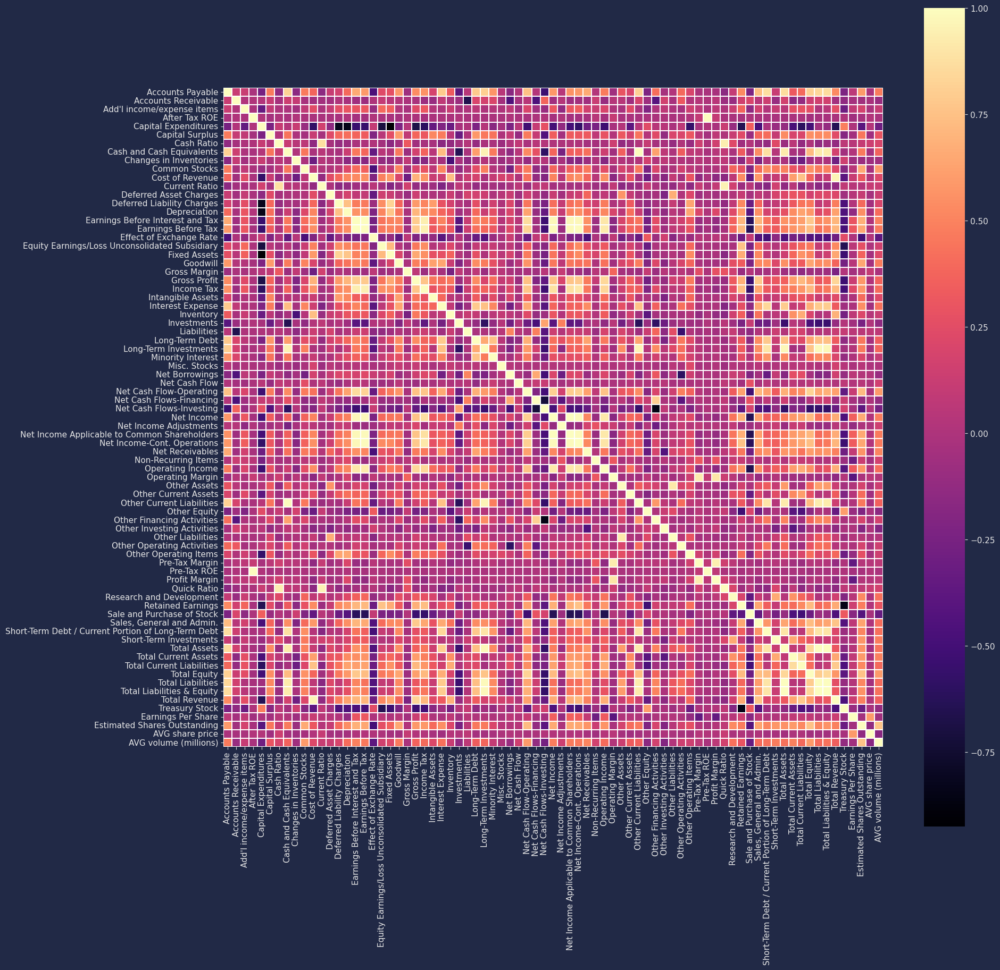

In [48]:
f, ax = plt.subplots(figsize=(20,20))
ax = sns.heatmap(metrics_corr.corr(),linewidths=.2 ,square=True, cmap='magma')

### Correlation Analysis
This was constructed to examine the relationships for AVG share price & AVG volume (the dependent variables) against independent variables. You can view these 2 on the bottom left on the vertical matrix axis. AVG share price has no weak or strong correlations, and has a single moderate r-value with Earnings Per Share. On the other hand, AVG volume has a multitude of moderate (.429 or higher) & strong correlations in both directions. Weak correlation for either direction are not mentioned.
* Negative: Capital Expenditures, Effect of Exchange Rate, Net CFI, Sale and Purchase of Stock.
* Positives: AP, Common Stocks, Depreciation, EBIT, EBT, Goodwill, Net CFO, Net Income, Net Income Applicable to Common Shareholders, Net Income - Cont. Operations, Net Receivables, Short Term Investments, Total Liabilities & Equity, Total Assets, Total Current Assets, Total Equity, Estimated Shares Outstanding.
#### *To identify the r-value for each relationship, view the correlation matrix excel sheet contained within the analysis folder.*

## Multiple Regression Analysis
This will be enacted with the dependent variable as AVG volume, given the wide variety of relationships it poses, and various samples of the independent variables which are listed in the above section.
### Test #1: AVG volume (y) by all .429+ correlations (x's)

In [49]:
corrs = metrics_corr.corr()
test_1 = corrs['AVG volume (millions)'][(corrs['AVG volume (millions)'] >= .329) | (corrs['AVG volume (millions)'] <= -.329)]
test_1_x = [i for i in test_1.index if i != 'AVG volume (millions)']
# test_1_x.insert(0, 'Ticker Symbol')
# test_1_x.insert(1, 'Period Ending')
test_1_y = metrics_v4[['AVG volume (millions)']]
test_1_x

['Accounts Payable',
 'Cash and Cash Equivalents',
 'Common Stocks',
 'Depreciation',
 'Earnings Before Interest and Tax',
 'Earnings Before Tax',
 'Effect of Exchange Rate',
 'Goodwill',
 'Gross Profit',
 'Income Tax',
 'Interest Expense',
 'Long-Term Debt',
 'Long-Term Investments',
 'Net Cash Flow-Operating',
 'Net Income',
 'Net Income Applicable to Common Shareholders',
 'Net Income-Cont. Operations',
 'Net Receivables',
 'Operating Income',
 'Other Current Assets',
 'Other Current Liabilities',
 'Research and Development',
 'Sale and Purchase of Stock',
 'Sales, General and Admin.',
 'Short-Term Debt / Current Portion of Long-Term Debt',
 'Short-Term Investments',
 'Total Assets',
 'Total Current Assets',
 'Total Current Liabilities',
 'Total Equity',
 'Total Liabilities',
 'Total Liabilities & Equity',
 'Total Revenue',
 'Estimated Shares Outstanding']

In [50]:
test_1_df = metrics_v4[test_1_x]
test_1_df.head(5)

,Accounts Payable,Cash and Cash Equivalents,Common Stocks,Depreciation,Earnings Before Interest and Tax,Earnings Before Tax,Effect of Exchange Rate,Goodwill,Gross Profit,Income Tax,Interest Expense,Long-Term Debt,Long-Term Investments,Net Cash Flow-Operating,Net Income,Net Income Applicable to Common Shareholders,Net Income-Cont. Operations,Net Receivables,Operating Income,Other Current Assets,Other Current Liabilities,Research and Development,Sale and Purchase of Stock,"Sales, General and Admin.",Short-Term Debt / Current Portion of Long-Term Debt,Short-Term Investments,Total Assets,Total Current Assets,Total Current Liabilities,Total Equity,Total Liabilities,Total Liabilities & Equity,Total Revenue,Estimated Shares Outstanding
0,4.975e+09,2.175e+09,5.000e+06,1.020e+09,-1.324e+09,-2.180e+09,0.0,4.086e+09,1.572e+10,-3.460e+08,8.560e+08,1.535e+10,0.000e+00,6.750e+08,-1.834e+09,-1.834e+09,-4.489e+09,1.560e+09,1.399e+09,1.465e+09,7.385e+09,0.000e+00,0.000e+00,1.291e+10,1.446e+09,8.111e+09,4.228e+10,1.432e+10,1.381e+10,-2.731e+09,4.501e+10,4.228e+10,2.674e+10,1.630e+08
1,4.668e+09,1.768e+09,7.000e+06,1.342e+09,4.099e+09,3.212e+09,0.0,4.091e+09,2.703e+10,3.300e+08,8.870e+08,1.604e+10,0.000e+00,3.080e+09,2.882e+09,2.882e+09,2.882e+09,1.771e+09,4.249e+09,8.980e+08,7.059e+09,0.000e+00,-1.052e+09,2.069e+10,1.677e+09,6.309e+09,4.322e+10,1.175e+10,1.340e+10,2.021e+09,4.120e+10,4.322e+10,4.265e+10,7.169e+08
2,5.102e+09,1.085e+09,6.000e+06,1.487e+09,5.496e+09,4.616e+09,0.0,4.091e+09,2.989e+10,-2.994e+09,8.800e+08,1.833e+10,0.000e+00,6.249e+09,7.610e+09,7.610e+09,7.610e+09,1.425e+09,6.204e+09,7.480e+08,6.272e+09,0.000e+00,-3.846e+09,2.128e+10,2.231e+09,5.864e+09,4.842e+10,9.985e+09,1.360e+10,5.635e+09,4.278e+10,4.842e+10,4.099e+10,6.681e+08
3,3.622e+10,1.426e+10,1.976e+10,6.757e+09,5.016e+10,5.016e+10,0.0,1.577e+09,6.430e+10,1.312e+10,0.000e+00,1.696e+10,1.062e+11,5.367e+10,3.704e+10,3.704e+10,3.704e+10,2.409e+10,4.900e+10,6.882e+09,7.435e+09,4.475e+09,-2.233e+10,1.083e+10,0.000e+00,2.629e+10,2.070e+11,7.329e+10,4.366e+10,1.235e+11,8.345e+10,2.070e+11,1.709e+11,9.252e+08
4,4.865e+10,1.384e+10,2.331e+10,7.946e+09,5.348e+10,5.348e+10,0.0,4.616e+09,7.054e+10,1.397e+10,0.000e+00,2.899e+10,1.302e+11,5.971e+10,3.951e+10,3.951e+10,3.951e+10,3.154e+10,5.250e+10,9.806e+09,8.491e+09,6.041e+09,-4.427e+10,1.199e+10,6.308e+09,1.123e+10,2.318e+11,6.853e+10,6.345e+10,1.115e+11,1.203e+11,2.318e+11,1.828e+11,6.088e+09


In [51]:
test_1_y.head(5)

,AVG volume (millions)
0,1.395e+07
1,1.311e+07
2,7.357e+06
3,7.489e+07
4,4.620e+07


In [52]:
test_1_y.isna().sum()

AVG volume (millions)    0
dtype: int64

In [53]:
test_1_df.isna().sum()

Accounts Payable                                        0
Cash and Cash Equivalents                               0
Common Stocks                                           0
Depreciation                                            0
Earnings Before Interest and Tax                        0
Earnings Before Tax                                     0
Effect of Exchange Rate                                 0
Goodwill                                                0
Gross Profit                                            0
Income Tax                                              0
Interest Expense                                        0
Long-Term Debt                                          0
Long-Term Investments                                   0
Net Cash Flow-Operating                                 0
Net Income                                              0
Net Income Applicable to Common Shareholders            0
Net Income-Cont. Operations                             0
Net Receivable

In [54]:
pd.set_option('display.max_rows', None)
metrics_v4.isna().sum()

Ticker Symbol                                            0
Period Ending                                            0
Accounts Payable                                         0
Accounts Receivable                                      0
Add'l income/expense items                               0
After Tax ROE                                            0
Capital Expenditures                                     0
Capital Surplus                                          0
Cash Ratio                                             180
Cash and Cash Equivalents                                0
Changes in Inventories                                   0
Common Stocks                                            0
Cost of Revenue                                          0
Current Ratio                                          180
Deferred Asset Charges                                   0
Deferred Liability Charges                               0
Depreciation                                            

In [55]:
pd.set_option('display.max_rows', 10)
NA = metrics_v4['Estimated Shares Outstanding'][metrics_v4['Estimated Shares Outstanding'].isna() == True].index
metrics_v4.loc[NA].head(2)

,Ticker Symbol,Period Ending,Accounts Payable,Accounts Receivable,Add'l income/expense items,After Tax ROE,Capital Expenditures,Capital Surplus,Cash Ratio,Cash and Cash Equivalents,Changes in Inventories,Common Stocks,Cost of Revenue,Current Ratio,Deferred Asset Charges,Deferred Liability Charges,Depreciation,Earnings Before Interest and Tax,Earnings Before Tax,Effect of Exchange Rate,Equity Earnings/Loss Unconsolidated Subsidiary,Fixed Assets,Goodwill,Gross Margin,Gross Profit,Income Tax,Intangible Assets,Interest Expense,Inventory,Investments,Liabilities,Long-Term Debt,Long-Term Investments,Minority Interest,Misc. Stocks,Net Borrowings,Net Cash Flow,Net Cash Flow-Operating,Net Cash Flows-Financing,Net Cash Flows-Investing,Net Income,Net Income Adjustments,Net Income Applicable to Common Shareholders,Net Income-Cont. Operations,Net Receivables,Non-Recurring Items,Operating Income,Operating Margin,Other Assets,Other Current Assets,Other Current Liabilities,Other Equity,Other Financing Activities,Other Investing Activities,Other Liabilities,Other Operating Activities,Other Operating Items,Pre-Tax Margin,Pre-Tax ROE,Profit Margin,Quick Ratio,Research and Development,Retained Earnings,Sale and Purchase of Stock,"Sales, General and Admin.",Short-Term Debt / Current Portion of Long-Term Debt,Short-Term Investments,Total Assets,Total Current Assets,Total Current Liabilities,Total Equity,Total Liabilities,Total Liabilities & Equity,Total Revenue,Treasury Stock,For Year,Earnings Per Share,Estimated Shares Outstanding,AVG share price,AVG volume (millions)
32,AEP,2015,2.624e+09,2.002e+08,1.633e+08,11.0,-4.508e+09,6.296e+09,9.0,2.837e+08,-3.860e+07,3.324e+09,7.434e+09,57.0,2.107e+09,1.280e+10,2.155e+09,3.497e+09,2.623e+09,0.000e+00,6.530e+07,4.613e+10,5.250e+07,55.0,9.020e+09,9.196e+08,0.000e+00,8.739e+08,1.339e+09,-6.000e+07,8.760e+07,1.774e+10,2.428e+09,1.320e+07,0.0,3.937e+08,1.390e+07,4.749e+09,-6.617e+08,-4.564e+09,2.052e+09,3.192e+08,2.047e+09,1.769e+09,1.640e+09,0.000e+00,3.334e+09,20.0,6.890e+09,4.220e+08,1.766e+09,-1.271e+08,-7.800e+07,4.000e+06,6.126e+09,4.642e+08,2.010e+09,16.0,15.0,12.0,38.0,0.0,8.398e+09,8.160e+07,3.676e+09,2.719e+09,3.868e+08,6.168e+10,4.072e+09,7.108e+09,1.789e+10,4.379e+10,6.168e+10,1.645e+10,0.0,NaN,NaN,NaN,56.236,3.032e+06
48,ALLE,2013,4.185e+08,2.790e+07,-7.200e+06,49.0,-2.020e+07,2.850e+07,55.0,2.676e+08,3.900e+06,1.000e+06,1.208e+09,193.0,7.850e+07,8.670e+07,4.610e+07,2.336e+08,2.234e+08,-2.900e+06,0.000e+00,2.002e+08,5.049e+08,42.0,8.615e+08,1.750e+08,1.461e+08,1.020e+07,1.875e+08,0.000e+00,-8.150e+07,1.272e+09,0.000e+00,3.110e+07,0.0,1.339e+09,-9.010e+07,2.239e+08,-2.924e+08,-1.870e+07,3.230e+07,1.078e+08,3.230e+07,4.840e+07,4.569e+08,1.376e+08,2.408e+08,12.0,1.241e+08,3.480e+07,1.000e+05,-9.670e+07,-1.598e+09,1.500e+06,1.864e+08,8.030e+07,0.000e+00,11.0,338.0,2.0,155.0,0.0,1.100e+06,1.300e+06,4.831e+08,7.190e+07,0.000e+00,2.001e+09,9.468e+08,4.905e+08,-6.610e+07,2.067e+09,2.001e+09,2.070e+09,0.0,NaN,NaN,NaN,43.498,1.753e+06


In [56]:
test_1_df.dropna(inplace=True)
print(test_1_df.isna().sum().sum())
print(test_1_df.shape)
print(test_1_y.shape)

0
(1044, 34)
(1104, 1)


In [57]:
test_1_y.drop(NA, inplace=True)
print(test_1_y.shape)
print('Check if sample is at least 10% of population:', metrics.shape)

(1044, 1)
Check if sample is at least 10% of population: (1781, 79)


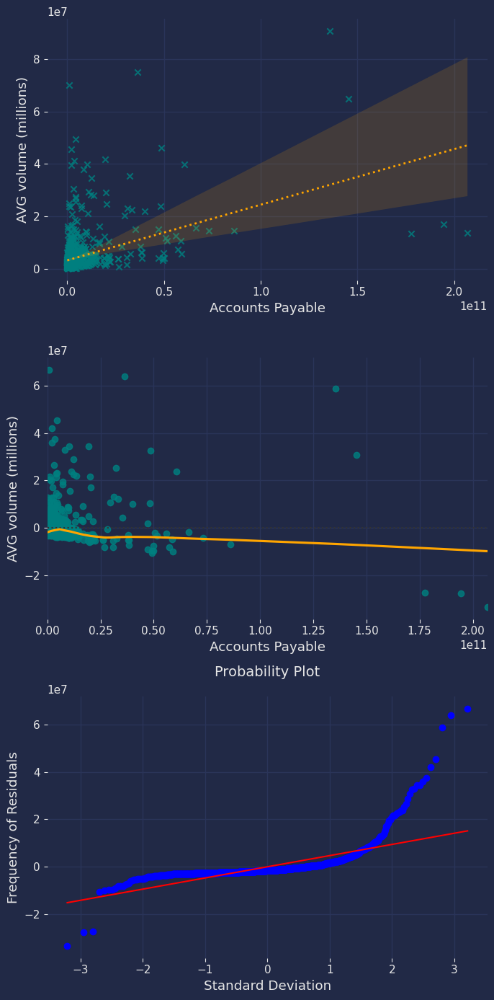

SST: 5.5392444287408616e+16
SSE: 4.520222962030732e+16
MSE: 43297154808723.484
SSR: 1.0190214667101276e+16
r-squared: 18.396%


In [58]:
paired_variables = pd.concat([test_1_df, test_1_y], axis=1)
x_var = 'Accounts Payable'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_ap = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_ap, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list = [x_var]
sse_list = [SSE]
mse_list = [MSE]
ssr_list = [SSR]
sst_list = [SST]
r2_list = [r2]

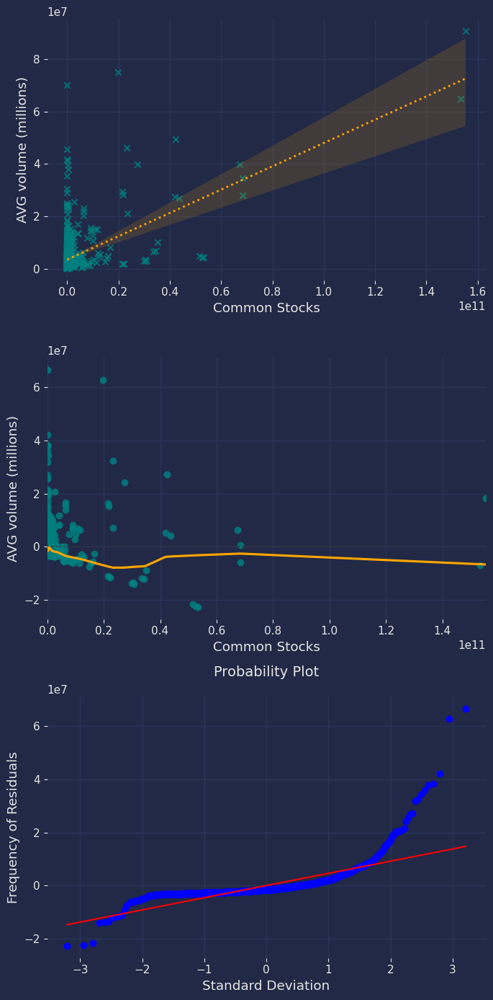

NameError: name 'shapiro' is not defined

In [59]:
x_var = 'Common Stocks'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_cs = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_cs, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

stat, p = shapiro(residuals_y_cs)
print('Shapiro-Wilk Test: Stat=%.3f, p=%.3f' % (stat, p))

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

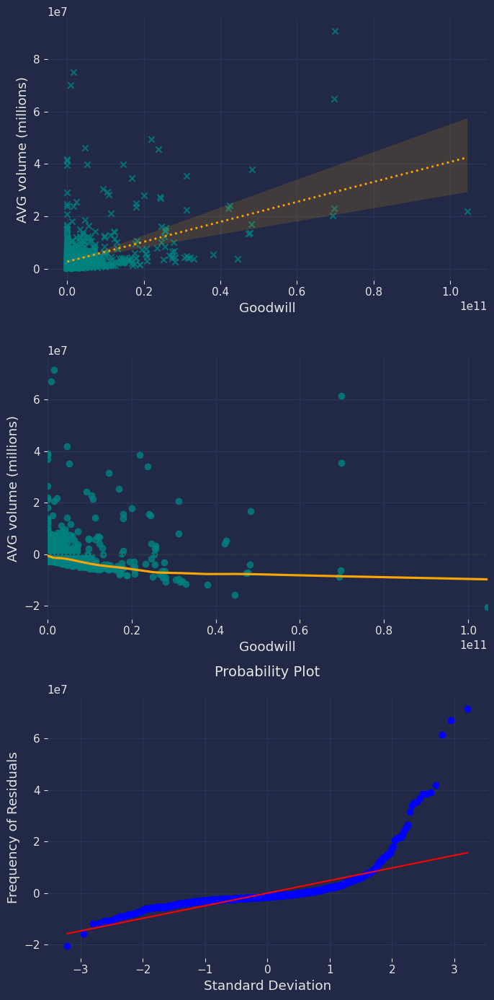

SST: 5.5392444287408616e+16
SSE: 4.4738862044190696e+16
MSE: 42853316134282.27
SSR: 1.0653582243217952e+16
r-squared: 19.233%


In [60]:
x_var = 'Goodwill'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_gw = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_gw, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

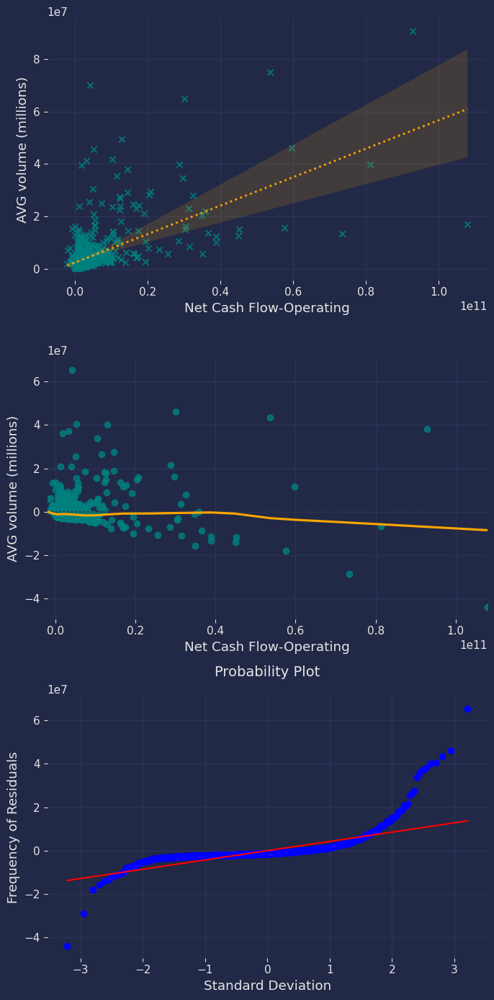

SST: 5.5392444287408616e+16
SSE: 3.55202094951322e+16
MSE: 34023189171582.566
SSR: 1.987223479227641e+16
r-squared: 35.875%


In [61]:
x_var = 'Net Cash Flow-Operating'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_cfo = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_cfo, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

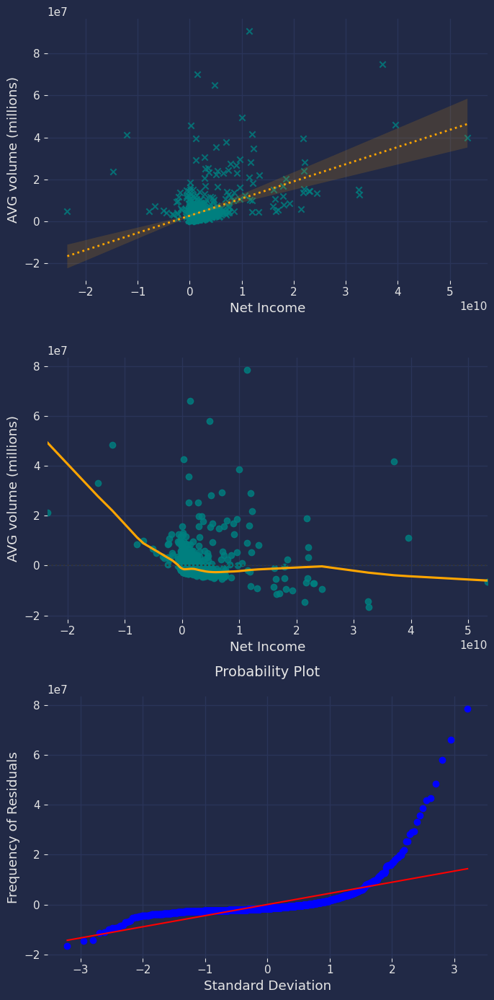

SST: 5.5392444287408616e+16
SSE: 4.2548907180041336e+16
MSE: 40755658218430.4
SSR: 1.2843537107367288e+16
r-squared: 23.186%


In [62]:
x_var = 'Net Income'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_ni = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_ni, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

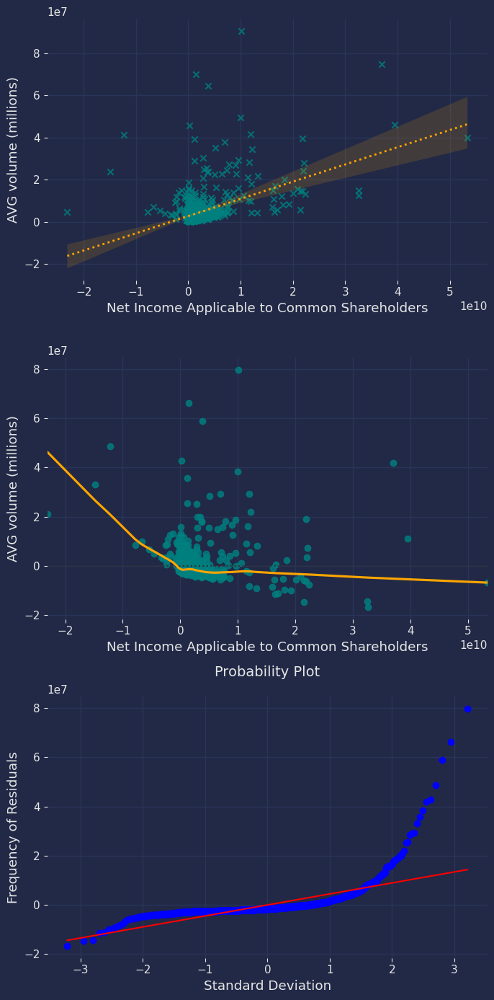

SST: 5.5392444287408616e+16
SSE: 4.281809146004134e+16
MSE: 41013497567089.41
SSR: 1.2574352827367294e+16
r-squared: 22.7%


In [63]:
x_var = 'Net Income Applicable to Common Shareholders'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_incomeshareholders = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_incomeshareholders, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

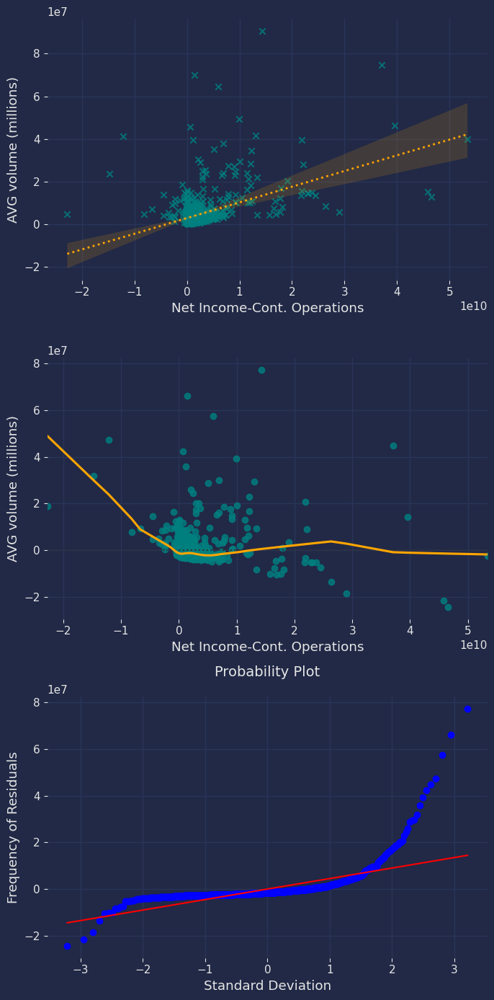

SST: 5.5392444287408616e+16
SSE: 4.329602674290497e+16
MSE: 41471289983625.445
SSR: 1.2096417544503636e+16
r-squared: 21.838%


In [64]:
x_var = 'Net Income-Cont. Operations'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_nico = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_nico, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

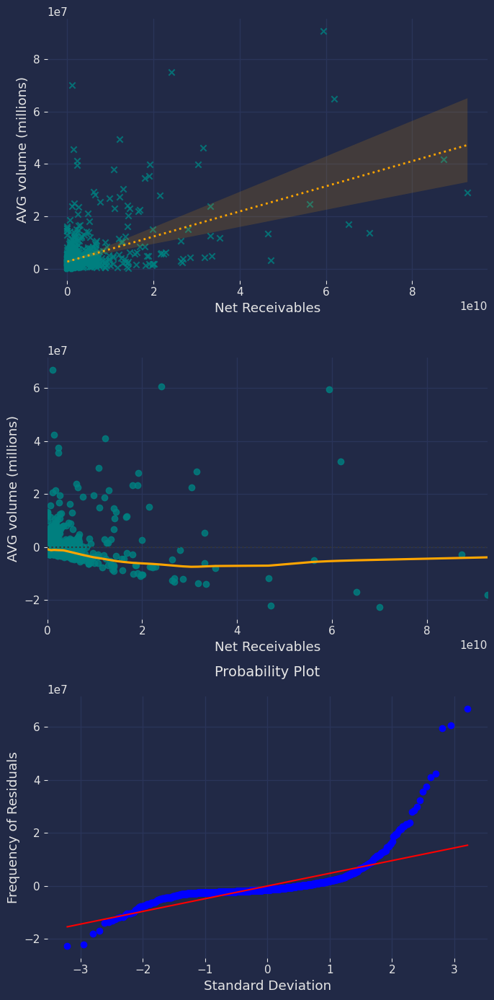

SST: 5.5392444287408616e+16
SSE: 4.133073095062505e+16
MSE: 39588822749640.85
SSR: 1.4061713336783622e+16
r-squared: 25.386%


In [65]:
x_var = 'Net Receivables'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_nr = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_nr, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

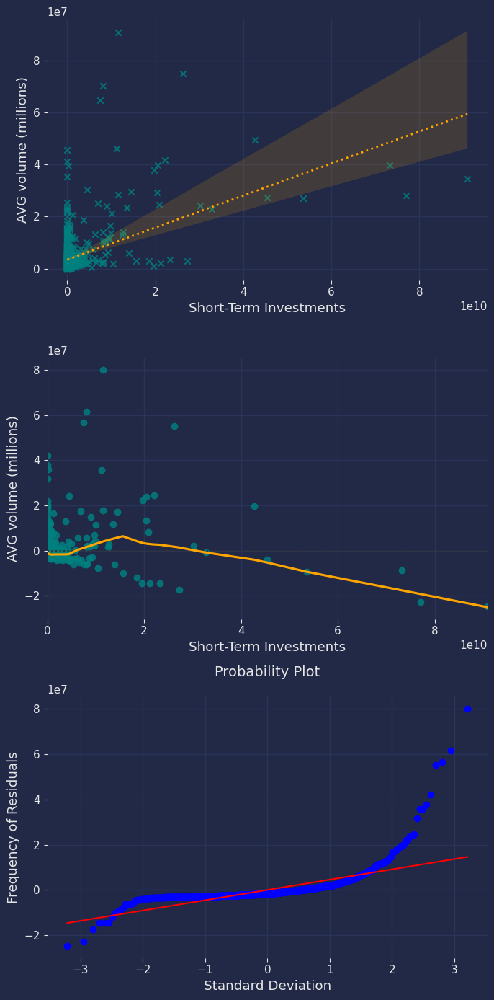

SST: 5.5392444287408616e+16
SSE: 4.181351777160812e+16
MSE: 40051262233341.11
SSR: 1.3578926515800296e+16
r-squared: 24.514%


In [66]:
x_var = 'Short-Term Investments'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_sti = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_sti, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

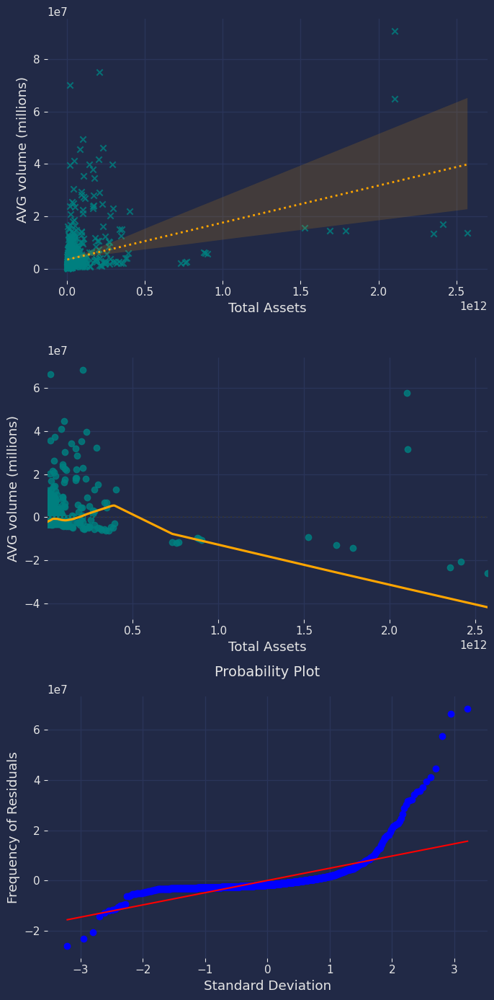

SST: 5.5392444287408616e+16
SSE: 4.725250379835369e+16
MSE: 45261018963940.31
SSR: 8139940489054964.0
r-squared: 14.695%


In [67]:
x_var = 'Total Assets'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_ta = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_ta, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

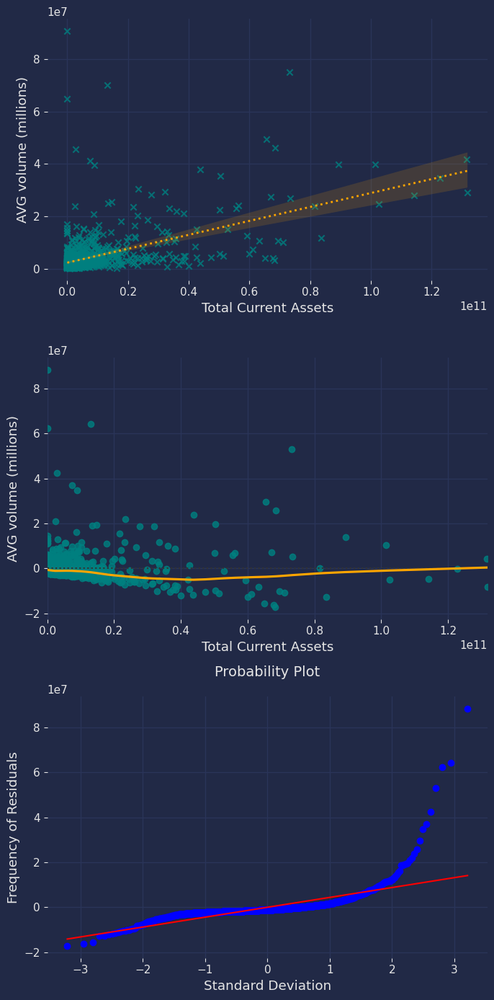

SST: 5.5392444287408616e+16
SSE: 3.999255351670453e+16
MSE: 38307043598375.984
SSR: 1.5399890770704088e+16
r-squared: 27.801%


In [68]:
x_var = 'Total Current Assets'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_tca = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_tca, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

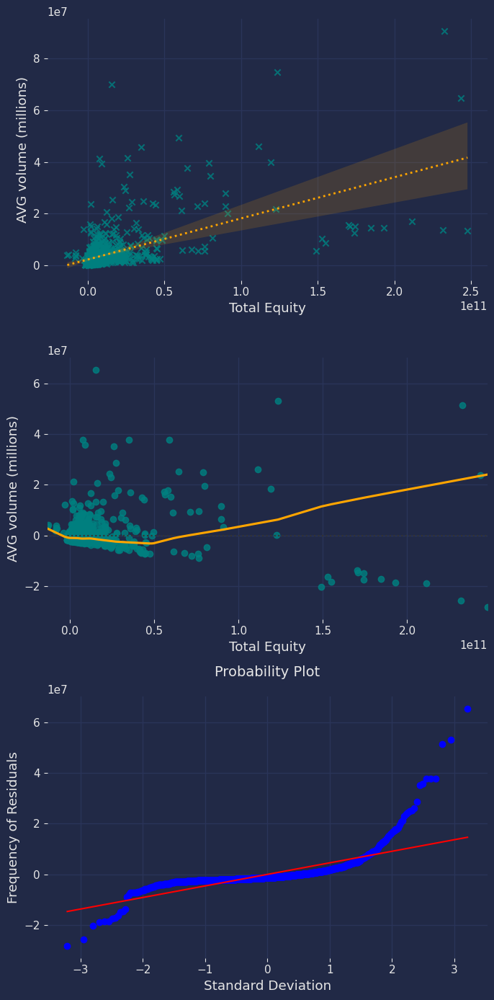

SST: 5.5392444287408616e+16
SSE: 3.790225182578414e+16
MSE: 36304838913586.34
SSR: 1.7490192461624466e+16
r-squared: 31.575%


In [69]:
x_var = 'Total Equity'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_te = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_te, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

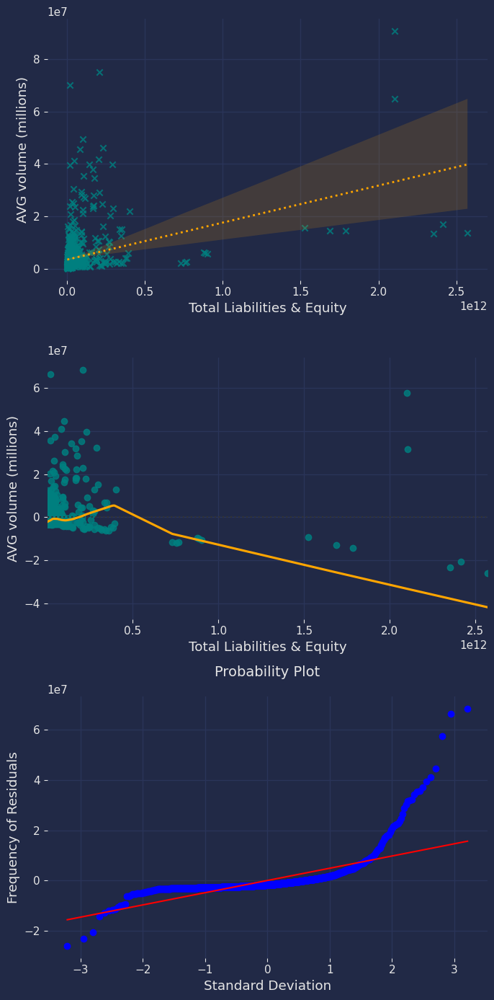

SST: 5.5392444287408616e+16
SSE: 4.72526827098067e+16
MSE: 45261190335063.89
SSR: 8139761577601930.0
r-squared: 14.695%


In [70]:
x_var = 'Total Liabilities & Equity'
# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_tle = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_tle, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

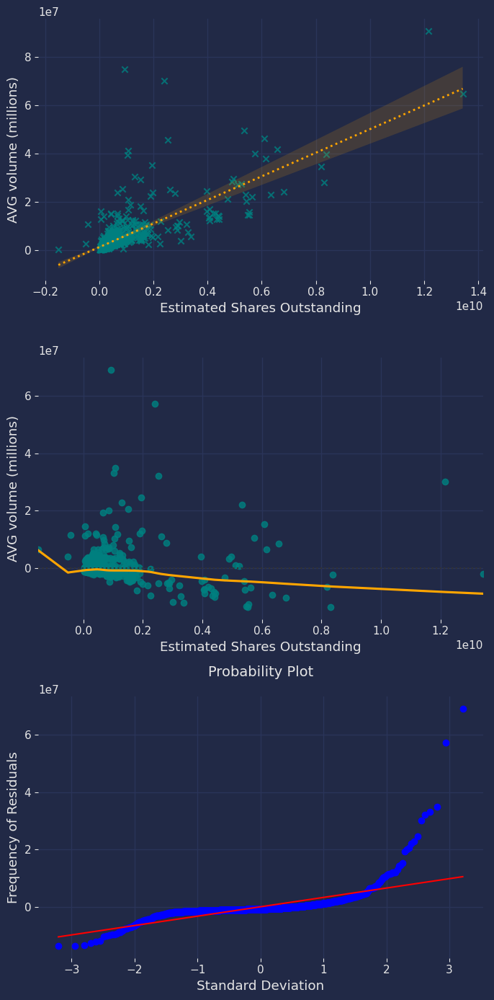

SST: 5.5392444287408616e+16
SSE: 2.313261007131252e+16
MSE: 22157672482100.113
SSR: 3.225983421609614e+16
r-squared: 58.239%


In [71]:
x_var = 'Estimated Shares Outstanding'

# Regression chart
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel('AVG volume (millions)')

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=paired_variables, x=x_var, y='AVG volume (millions)', color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel('AVG volume (millions)')

# Fit a 1st order (quadratic is 2) polynomial and get the predicted values
coefficients = np.polyfit(paired_variables[x_var], paired_variables['AVG volume (millions)'], 1)
predicted_y = np.polyval(coefficients, paired_variables[x_var])

# Calculate the residuals for y
residuals_y_eso = paired_variables['AVG volume (millions)'] - predicted_y

stats.probplot(residuals_y_eso, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = paired_variables['AVG volume (millions)'].count()
avg = paired_variables['AVG volume (millions)'].mean()
SSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2), 2)
MSE = round(sum((paired_variables['AVG volume (millions)'] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((paired_variables['AVG volume (millions)'] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append(x_var)
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

#### A pattern throughough the probability plots is that standard deviation 2-3 (positive and negative) deviate from Gaussian, while the rest is consistent.
Truncating my sample to remove residual outliers didn't produce any meaningful results.

In [72]:
# variables that pass slope inference conditions (approximately)
x_keep = ["Goodwill", 'Estimated Shares Outstanding', "Total Current Assets", "Accounts Payable", "Net Receivables", 'Net Cash Flow-Operating']
reg_metrics = pd.DataFrame({'X Variable':var_list, 'SST':sst_list, 'SSE':sse_list, 'MSE':mse_list, 'SSR':ssr_list, 'r2':r2_list})

x_drop = []
for count, item in enumerate(reg_metrics['X Variable'].values):
    if item not in x_keep:
        reg_metrics.drop(count, inplace=True)
reg_metrics.sort_values(by='SSR', ascending=False)

,X Variable,SST,SSE,MSE,SSR,r2
12,Estimated Shares Outstanding,5.539e+16,2.313e+16,2.216e+13,3.226e+16,0.582
2,Net Cash Flow-Operating,5.539e+16,3.552e+16,3.402e+13,1.987e+16,0.359
9,Total Current Assets,5.539e+16,3.999e+16,3.831e+13,1.540e+16,0.278
6,Net Receivables,5.539e+16,4.133e+16,3.959e+13,1.406e+16,0.254
1,Goodwill,5.539e+16,4.474e+16,4.285e+13,1.065e+16,0.192
0,Accounts Payable,5.539e+16,4.520e+16,4.330e+13,1.019e+16,0.184


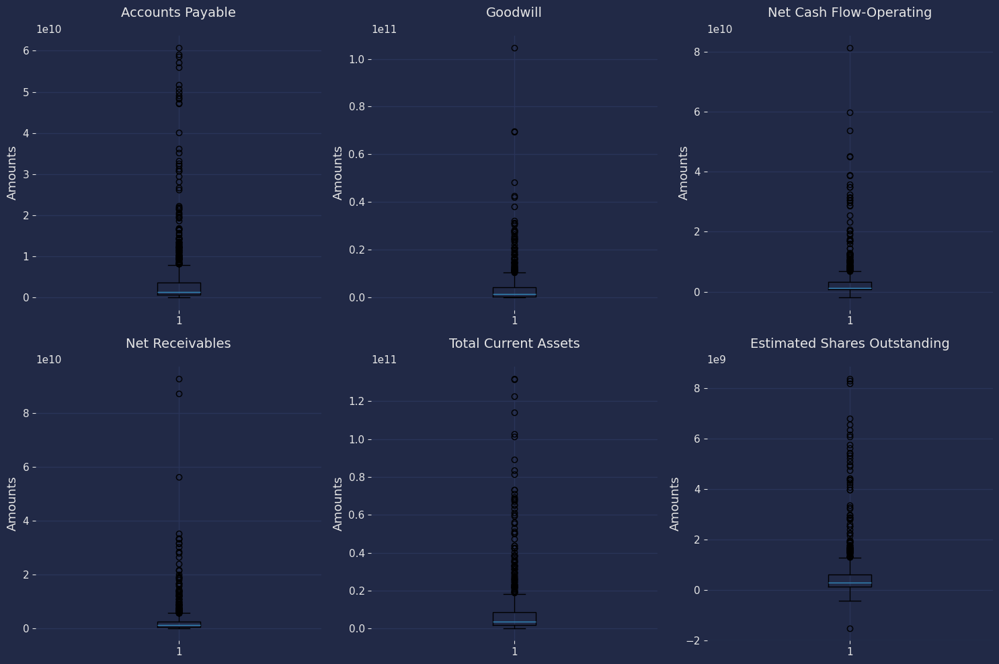

In [73]:
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.flatten()

sample_metrics = metrics_v4.dropna()
subplot_counter = 0

for col in sample_metrics.columns:
    if col in x_keep:
        ax = axs[subplot_counter]
        ax.boxplot(sample_metrics[col])
        ax.set_title(f'{col}')
        ax.set_ylabel('Amounts')
        subplot_counter += 1 

plt.tight_layout()
plt.show()

#### Significant outliers
There are quite a number of outliers contained within these samples. To have an accurate representation of an average company, aka the non Fortune 500's, the samples are limited by quantiles. Companies with an amount lower than the 10%-35% quantile are also removed form the opposite dynamic previously clarified.

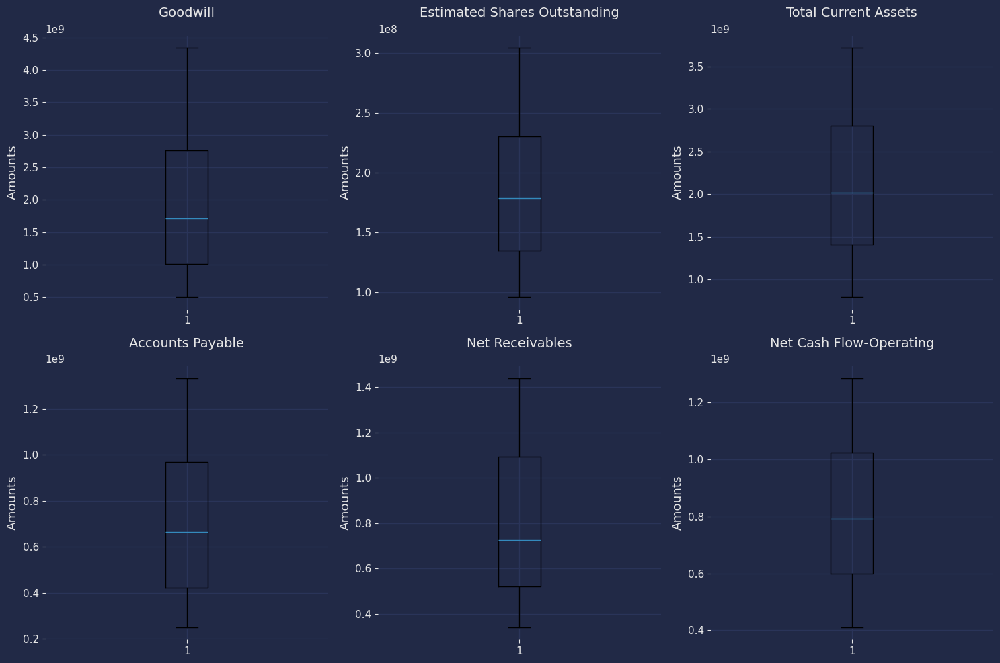

In [74]:
ap_quantile = metrics_v4['Accounts Payable'].quantile(.5)
ap_low = metrics_v4['Accounts Payable'].quantile(.1)
test_sample_ap = metrics_v4.loc[(metrics_v4['Accounts Payable']<=ap_quantile) & (metrics_v4['Accounts Payable']>ap_low),
['Accounts Payable', 'AVG volume (millions)']]

gw_quantile = metrics_v4["Goodwill"].quantile(.75)
gw_low = metrics_v4["Goodwill"].quantile(.35)
test_sample_gw = metrics_v4.loc[(metrics_v4["Goodwill"]<=gw_quantile) & (metrics_v4["Goodwill"]>gw_low),
['Goodwill', 'AVG volume (millions)']]

eso_quantile = metrics_v4['Estimated Shares Outstanding'].quantile(.5)
eso_low = metrics_v4['Estimated Shares Outstanding'].quantile(.1)
test_sample_eso = metrics_v4.loc[(metrics_v4['Estimated Shares Outstanding']<=eso_quantile) & (metrics_v4['Estimated Shares Outstanding']>eso_low),
['Estimated Shares Outstanding', 'AVG volume (millions)']]

ca_quantile = metrics_v4['Total Current Assets'].quantile(.6)
ca_low = metrics_v4['Total Current Assets'].quantile(.2)
test_sample_ac = metrics_v4.loc[(metrics_v4['Total Current Assets']<=ca_quantile) & (metrics_v4['Total Current Assets']>ca_low),
['Total Current Assets', 'AVG volume (millions)']]

nr_quantile = metrics_v4['Net Receivables'].quantile(.6)
nr_low = metrics_v4['Net Receivables'].quantile(.2)
test_sample_nr = metrics_v4.loc[(metrics_v4['Net Receivables']<=nr_quantile) & (metrics_v4['Net Receivables']>nr_low),
['Net Receivables', 'AVG volume (millions)']]

cfo_quantile = metrics_v4['Net Cash Flow-Operating'].quantile(.5)
cfo_low = metrics_v4['Net Cash Flow-Operating'].quantile(.1)
test_sample_cfo = metrics_v4.loc[(metrics_v4['Net Cash Flow-Operating']<=cfo_quantile) & (metrics_v4['Net Cash Flow-Operating']>cfo_low),
['Net Cash Flow-Operating', 'AVG volume (millions)']]

samples = [test_sample_gw, test_sample_eso, test_sample_ac, test_sample_ap, test_sample_nr, test_sample_cfo]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.flatten()

subplot_counter = 0
for sample, col in zip(samples, x_keep):
    ax = axs[subplot_counter]
    ax.boxplot(sample[col])
    ax.set_title(f'{col}')
    ax.set_ylabel('Amounts')
    subplot_counter += 1 

plt.tight_layout()
plt.show()

## Scaling Test Sets

In [75]:
test1_gw, SS_gw = SSstandardize(test_sample_gw)
test1_ac, SS_ac = SSstandardize(test_sample_ac)
test1_ap, SS_ap = SSstandardize(test_sample_ap)
test1_nr, SS_nr = SSstandardize(test_sample_nr)

test_sample_eso.rename({'Estimated Shares Outstanding':'ESO'}, inplace=True, axis=1)
test_sample_cfo.rename({'Net Cash Flow-Operating':'NCFO'}, inplace=True, axis=1)

# includes tests used later
hypno.dropna(inplace=True)
test1_eso, hypno_eso_avg, SS_eso_avg = SSstandardizeII(test_sample_eso, hypno[['ESO', 'AVG volume (millions)']])
test1_cfo, hypno_cfo_avg, SS_cfo_avg = SSstandardizeII(test_sample_cfo, hypno[['NCFO', 'AVG volume (millions)']])

model_params = {}

### Modelling with consistent dependent variable of AVG volume (millions) and an assortment of independents

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.902
Date:                Fri, 19 Apr 2024   Prob (F-statistic):              0.169
Time:                        09:31:54   Log-Likelihood:                -626.54
No. Observations:                 442   AIC:                             1257.
Df Residuals:                     440   BIC:                             1265.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.163e-17      0.048   8.73e-16      1.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


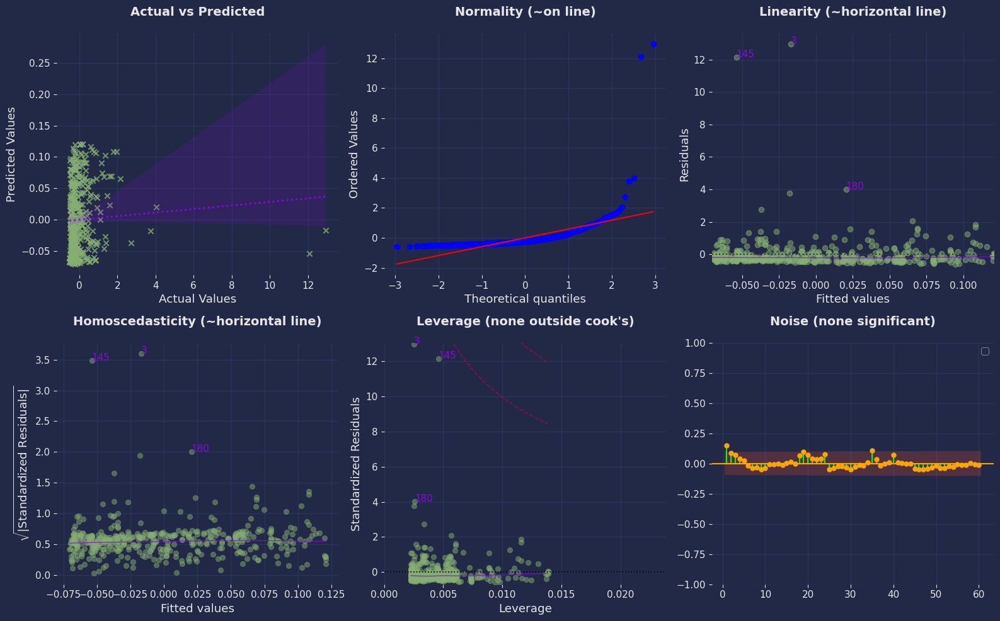

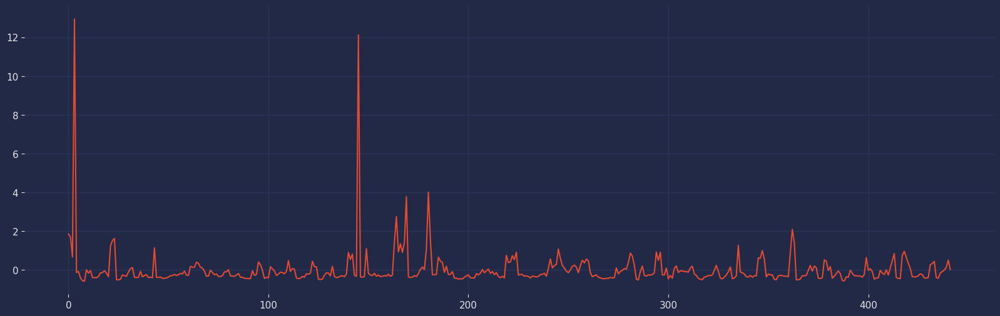

In [76]:
X = test1_gw[:, 0]
X = sm.add_constant(X)
Y = test1_gw[:, 1]

model = sm.OLS(Y, X).fit(cov_type='HC3', use_t=True)
predictions = model.predict(X)

print(model.summary())

SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     8.517
Date:                Fri, 19 Apr 2024   Prob (F-statistic):            0.00370
Time:                        09:31:55   Log-Likelihood:                -623.57
No. Observations:                 441   AIC:                             1251.
Df Residuals:                     439   BIC:                             1259.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.299e-17      0.048   1.32e-15      1.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


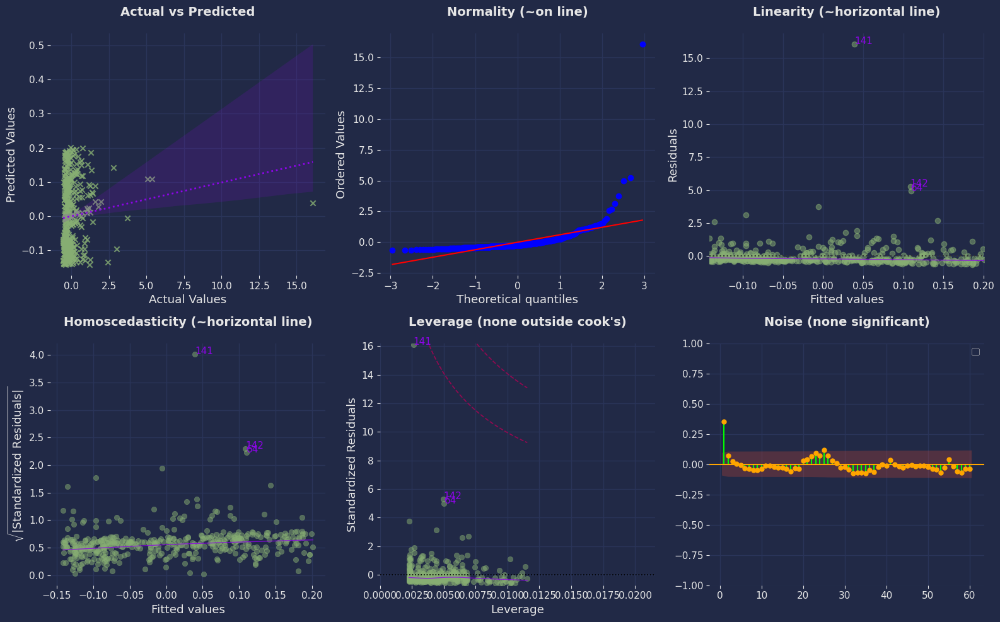

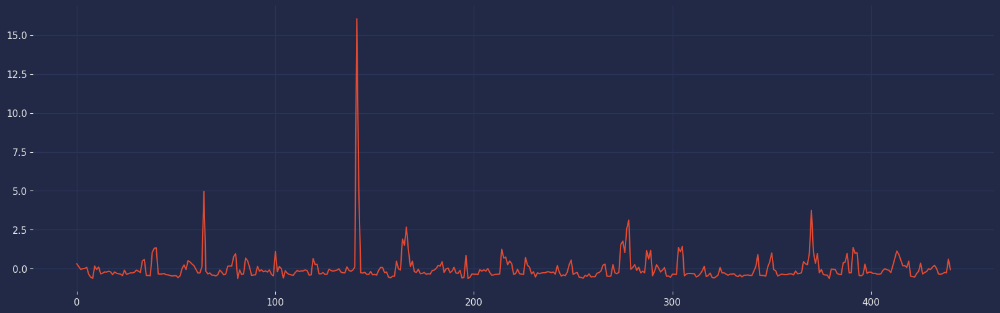

In [77]:
X = test1_ap[:, 0]
X = sm.add_constant(X)
Y = test1_ap[:, 1]

model = sm.OLS(Y, X).fit(cov_type='HC3', use_t=True)
predictions = model.predict(X)

print(model.summary())

SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     21.35
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           5.02e-06
Time:                        09:31:56   Log-Likelihood:                -569.48
No. Observations:                 441   AIC:                             1143.
Df Residuals:                     439   BIC:                             1151.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1072      0.074      1.457      0.1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


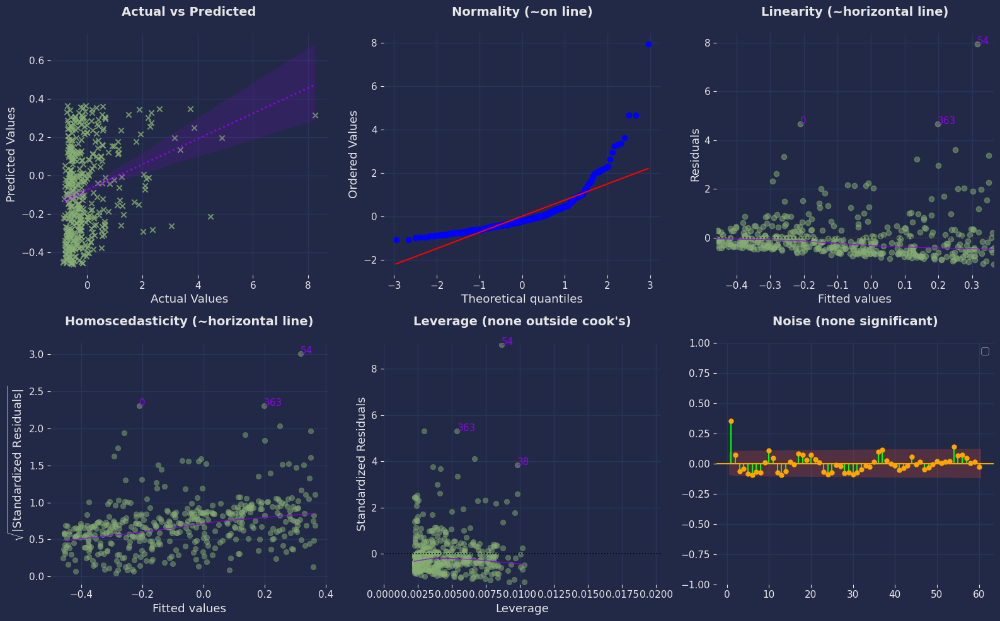

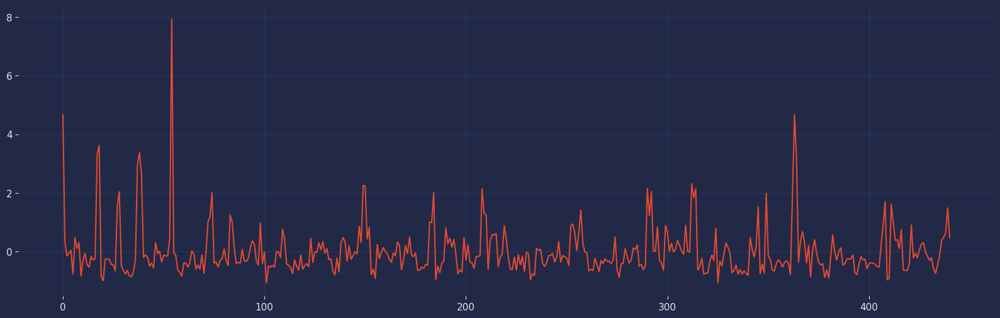

In [78]:
X = test1_cfo[:, 0]
X = sm.add_constant(X)
Y = test1_cfo[:, 1]

cfo_avg_model = sm.OLS(Y, X).fit(cov_type='HC3', se_type='HC3', use_t=True)
predictions = cfo_avg_model.predict(X)
model_params['cfo_avg'] = [cfo_avg_model.params[0], cfo_avg_model.params[1], cfo_avg_model.bse[1], cfo_avg_model.tvalues[1], cfo_avg_model.pvalues[1], [i for i in cfo_avg_model.conf_int()[1]]]

print(cfo_avg_model.summary())

SST = cfo_avg_model.centered_tss
SSR = cfo_avg_model.ssr
SSE = cfo_avg_model.mse_model
MSE = cfo_avg_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(cfo_avg_model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     5.265
Date:                Fri, 19 Apr 2024   Prob (F-statistic):             0.0222
Time:                        09:31:57   Log-Likelihood:                -622.32
No. Observations:                 441   AIC:                             1249.
Df Residuals:                     439   BIC:                             1257.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.949e-17      0.047  -6.21e-16      1.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


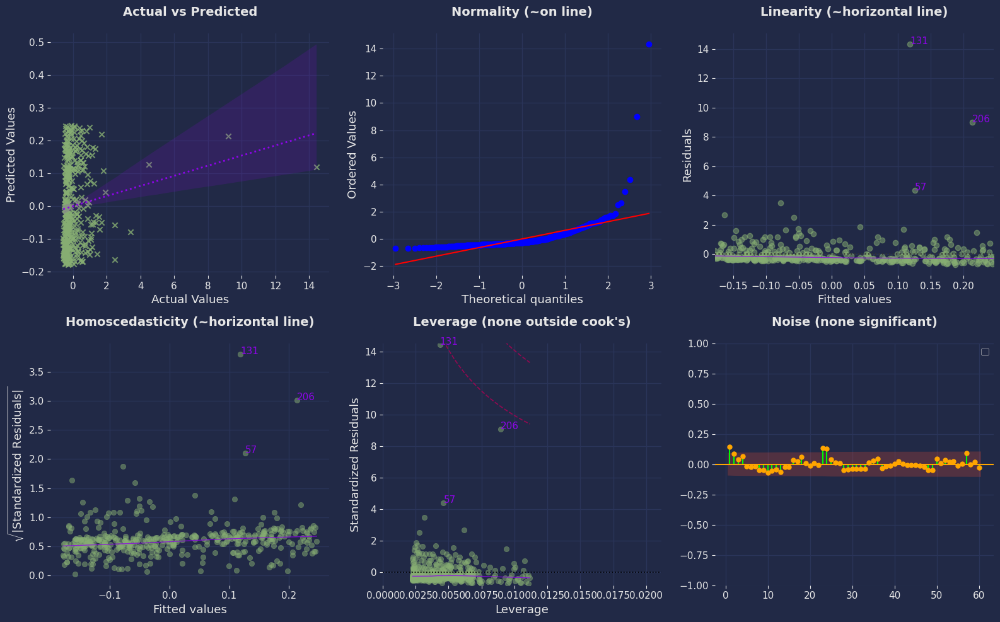

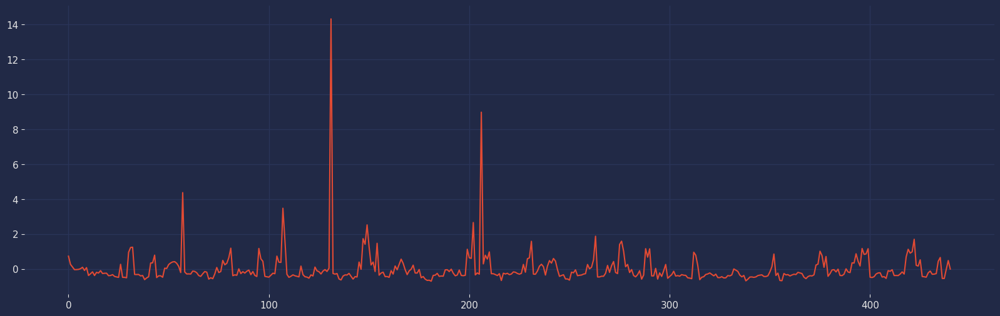

In [79]:
X = test1_nr[:, 0]
X = sm.add_constant(X)
Y = test1_nr[:, 1]

model = sm.OLS(Y, X).fit(cov_type='HC3', use_t=True)
predictions = model.predict(X)

print(model.summary())

SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     12.76
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           0.000394
Time:                        09:31:59   Log-Likelihood:                -620.04
No. Observations:                 441   AIC:                             1244.
Df Residuals:                     439   BIC:                             1252.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.908e-17      0.047  -4.04e-16      1.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


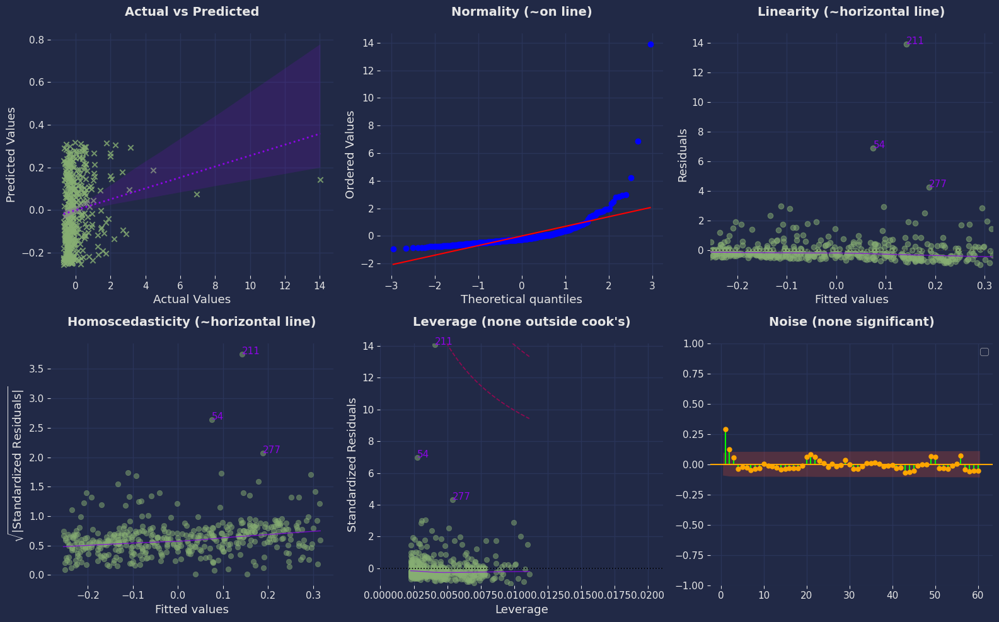

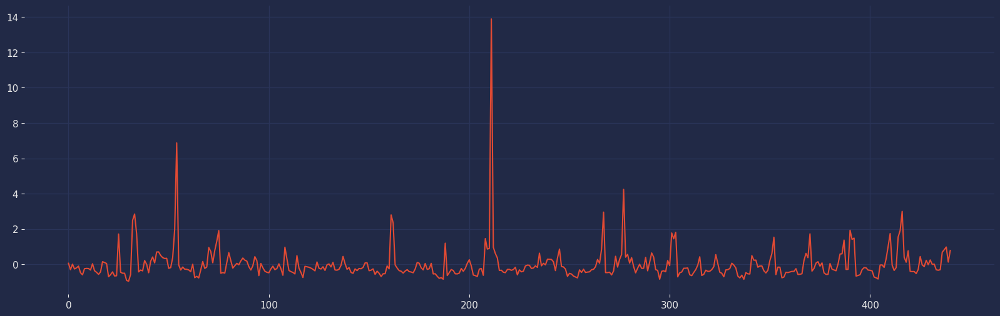

In [80]:
X = test1_ac[:, 0]
X = sm.add_constant(X)
Y = test1_ac[:, 1]

model = sm.OLS(Y, X).fit(cov_type='HC3', use_t=True)
predictions = model.predict(X)

print(model.summary())

SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.076
Model:                            OLS   Adj. R-squared:                  0.074
Method:                 Least Squares   F-statistic:                     34.31
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           9.57e-09
Time:                        09:32:00   Log-Likelihood:                -351.05
No. Observations:                 417   AIC:                             706.1
Df Residuals:                     415   BIC:                             714.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0485      0.035     -1.379      0.1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


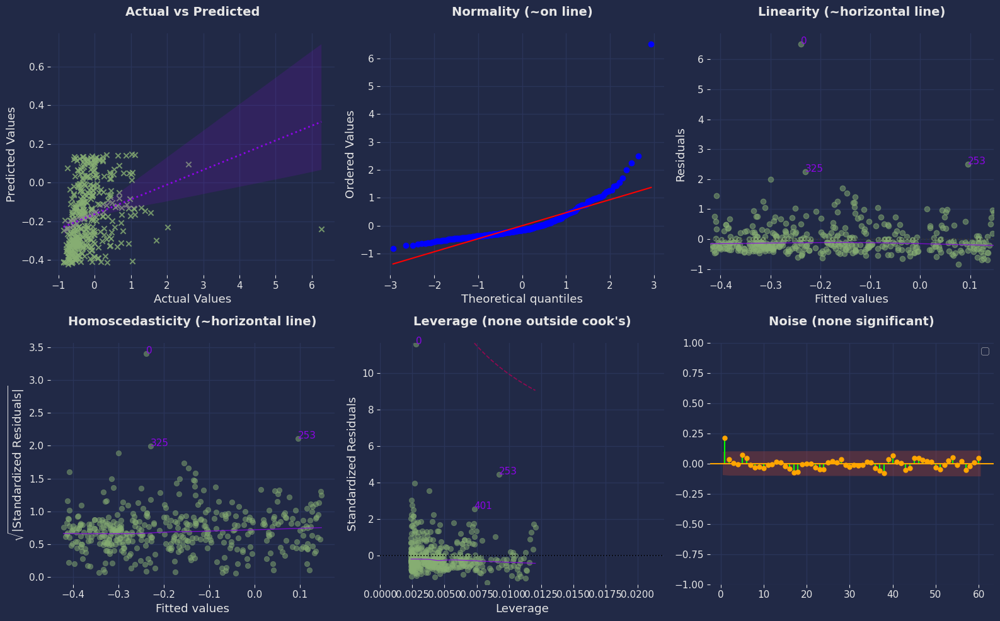

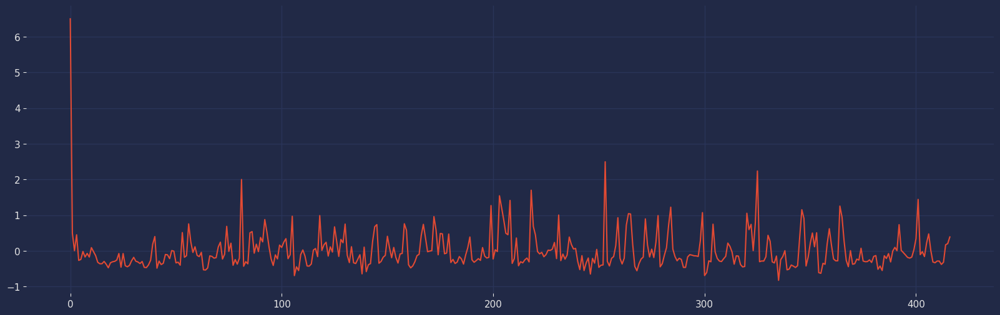

In [81]:
X = test1_eso[:, 0]
X = sm.add_constant(X)
Y = test1_eso[:, 1]

eso_avg_model = sm.OLS(Y, X).fit(use_t=True)
predictions = eso_avg_model.predict(X)
model_params['eso_avg'] = [eso_avg_model.params[0], eso_avg_model.params[1], eso_avg_model.bse[1], eso_avg_model.tvalues[1], eso_avg_model.pvalues[1], [i for i in eso_avg_model.conf_int()[1]]]

print(eso_avg_model.summary())

SST = eso_avg_model.centered_tss
SSR = eso_avg_model.ssr
SSE = eso_avg_model.mse_model
MSE = eso_avg_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(eso_avg_model)
vif, fig, ax = cls()

### Test 1 Analysis
Despite truncating outliers and creating samples that group companies of similar stature together, the relationship between AVG volume and the respective independent variables don't fit a least squares equation properly. The models have high AIC and BIC values, along with a few having a staggeringly high JB, Kurtosis, and Omnibus statistic. The Durbon Watson tests return between 1.2 and 1.6. Possibility of an AR or MA model is present in place of linear regression.
### Test 2 - Explores correlated (.5+) relationships between the columns notated in financial_metrics
Beginning by identifying linear relationships among the variables.

In [82]:
financial_metrics = ["Total Liabilities", "Sale and Purchase of Stock", "Long-Term Debt", "Total Equity"]
test2_df = metrics_v4[financial_metrics]

financial_metrics2 = ["Net Cash Flow-Operating", "Net Cash Flows-Investing", "Net Income", "Retained Earnings", "Accounts Payable"]
test2_df2 = metrics_v4[financial_metrics2]

financial_metrics3 = ["Long-Term Investments", "Capital Surplus", "Cash and Cash Equivalents", "Sales, General and Admin.", "Short-Term Debt / Current Portion of Long-Term Debt"]
test2_df3 = metrics_v4[financial_metrics3]

financial_metrics4 = ["Depreciation", "Capital Expenditures",  "Estimated Shares Outstanding", "Net Receivables", "Total Assets"]
test2_df4 = metrics_v4[financial_metrics4]


all_columns = [financial_metrics, financial_metrics2, financial_metrics3, financial_metrics4]
test2_df_cols = []
for list in all_columns:
    for col in list:
        test2_df_cols.append(col)

test2_df_all = metrics_v4[test2_df_cols]

# a dictionary to map original column names to their abbreviations
def abbreviate_column_name(col_name):
    """Return a string containing only the capital letters of the input string."""
    return ''.join(filter(str.isupper, col_name))

abbreviation_dict = {col: abbreviate_column_name(col) for col_list in all_columns for col in col_list}

test2_df_all.rename(columns=abbreviation_dict, inplace=True)
test2_df_all.dropna(inplace=True)

In [83]:
test2_df_all.columns

Index(['TL', 'SPS', 'LTD', 'TE', 'NCFO', 'NCFI', 'NI', 'RE', 'AP', 'LTI', 'CS',
       'CCE', 'SGA', 'STDCPLTD', 'D', 'CE', 'ESO', 'NR', 'TA'],
      dtype='object')

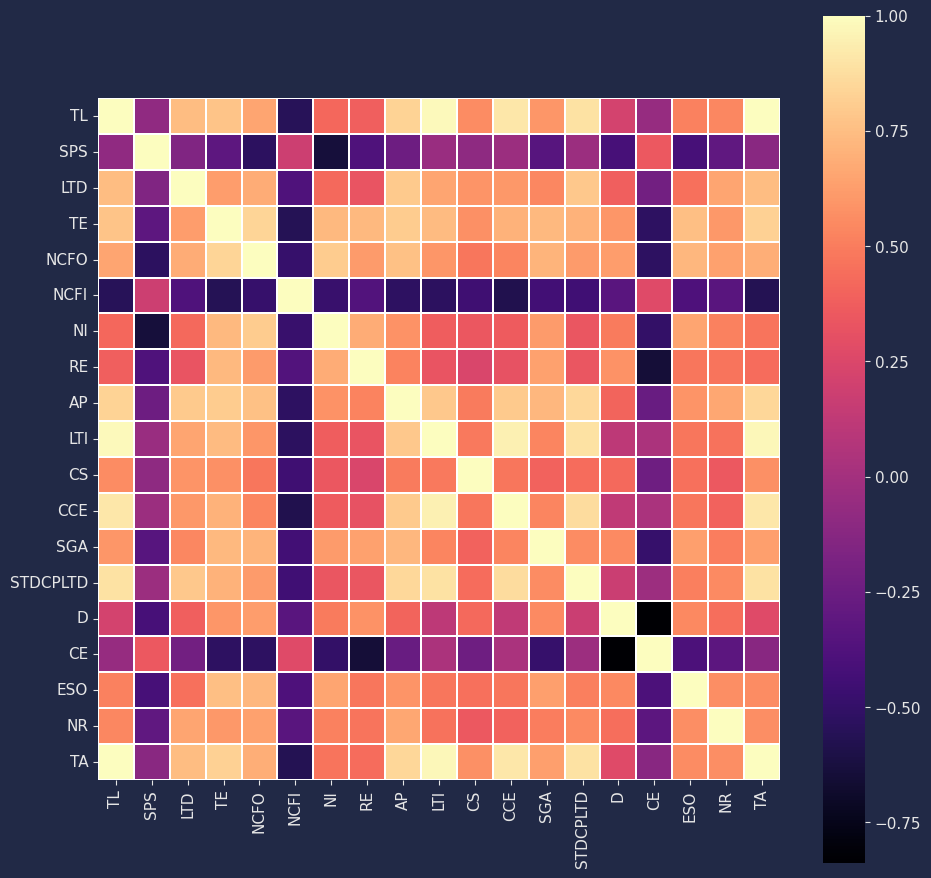

In [84]:
f, ax = plt.subplots(figsize=(11,11))
ax = sns.heatmap(test2_df_all.corr(),linewidths=.2 ,square=True, cmap='magma')

In [85]:
corr_compare = test2_df_all.corr()
corr_compare1 = corr_compare[['SGA', 'NCFO']]
corr_compare1['diff'] = corr_compare1['SGA']-corr_compare1['NCFO']
corr_compare1['diff'].mean()

-0.04105343506216417

In [86]:
corr_compare2 = corr_compare[['CCE', 'STDCPLTD']]
corr_compare2['diff'] = corr_compare2['CCE']-corr_compare2['STDCPLTD']
corr_compare2['diff'].mean()

-0.02917031813861255

In [87]:
test2_df_all.drop(['NI', 'RE', 'NR', 'CCE', 'NCFI', 'NCFO'], inplace=True, axis=1)

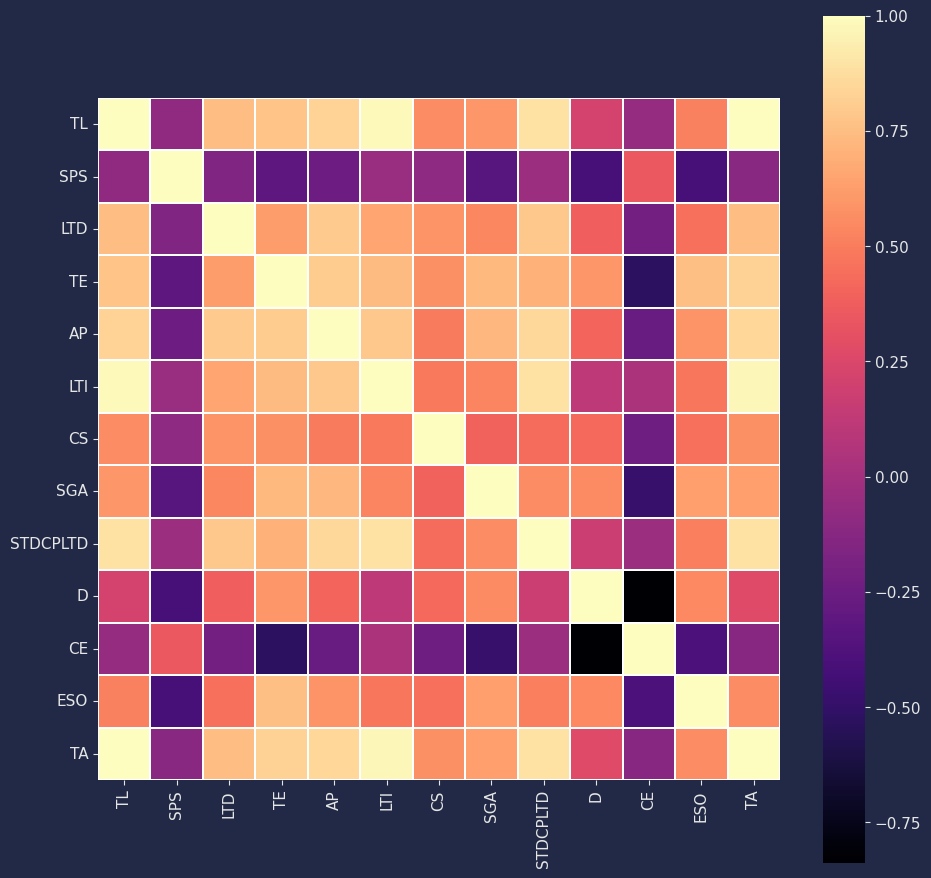

In [88]:
f, ax = plt.subplots(figsize=(11,11))
ax = sns.heatmap(test2_df_all.corr(),linewidths=.2 ,square=True, cmap='magma')

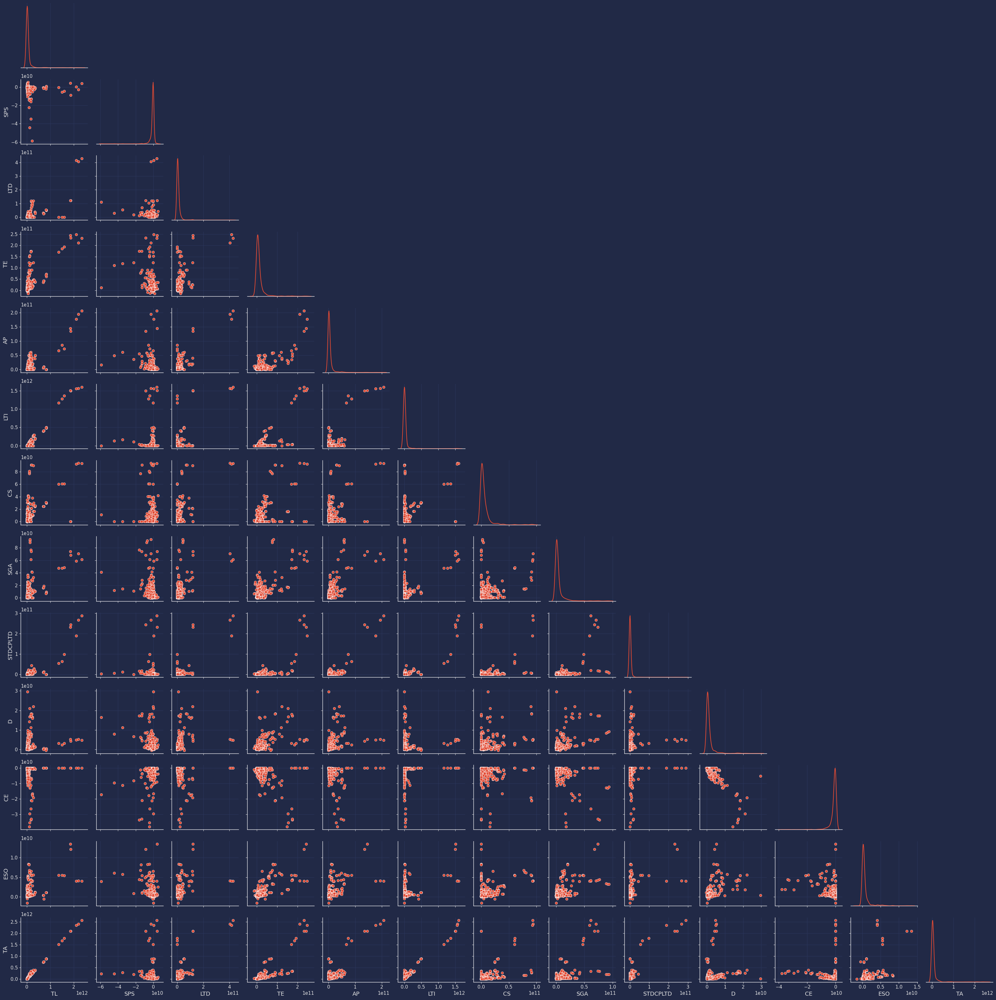

In [89]:
g = sns.PairGrid(test2_df_all, diag_sharey=False, corner=True)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
plt.tight_layout()
plt.show()

In [90]:
ratio_metrics = ["Total Liabilities", 'Total Revenue', 'Total Assets', "Total Equity"]
test3_df = metrics_v4[ratio_metrics]

ratio_metrics2 = ['Total Current Liabilities', 'Total Current Assets', 'Other Liabilities', 'Other Assets', "Net Income"]
test3_df2 = metrics_v4[ratio_metrics2]

ratio_metrics3 = ['Net Cash Flow-Operating', 'Net Cash Flows-Financing', 'Net Cash Flows-Investing', 'Estimated Shares Outstanding']
test3_df3 = metrics_v4[ratio_metrics3]

metrics_v4.rename({'Cash Ratio':'Cash Ratio Cash'}, axis=1, inplace=True)
ratio_metrics4 = ["Retained Earnings", "Current Ratio",  "Cash Ratio Cash", "Profit Margin", "Quick Ratio", "After Tax ROE"]
test3_df4 = metrics_v4[ratio_metrics4]


all_columns = [ratio_metrics, ratio_metrics2, ratio_metrics3, ratio_metrics4]
test3_df_cols = []
for list in all_columns:
    for col in list:
        test3_df_cols.append(col)

test3_df_all = metrics_v4[test3_df_cols]

# a dictionary to map original column names to their abbreviations
def abbreviate_column_name(col_name):
    """Return a string containing only the capital letters of the input string."""
    return ''.join(filter(str.isupper, col_name))

abbreviation_dict = {col: abbreviate_column_name(col) for col_list in all_columns for col in col_list}

test3_df_all.rename(columns=abbreviation_dict, inplace=True)
test3_df_all.dropna(inplace=True)

In [91]:
test3_df_all.columns

Index(['TL', 'TR', 'TA', 'TE', 'TCL', 'TCA', 'OL', 'OA', 'NI', 'NCFO', 'NCFF',
       'NCFI', 'ESO', 'RE', 'CR', 'CRC', 'PM', 'QR', 'ATROE'],
      dtype='object')

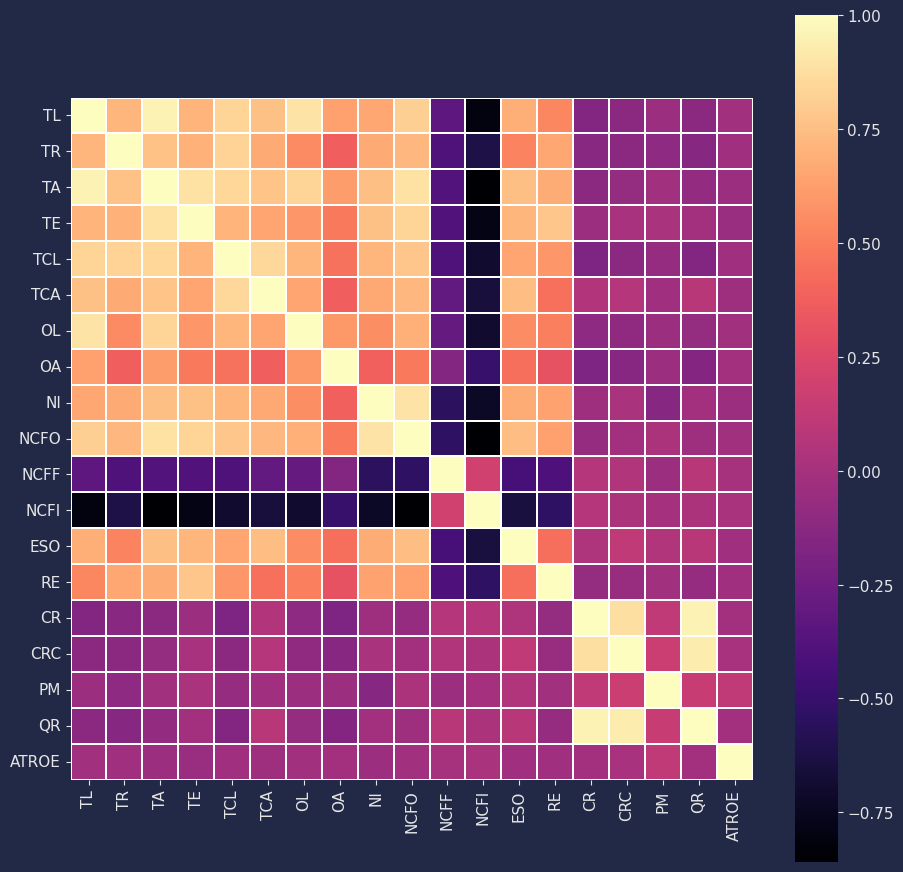

In [92]:
f, ax = plt.subplots(figsize=(11,11))
ax = sns.heatmap(test3_df_all.corr(),linewidths=.2 ,square=True, cmap='magma')

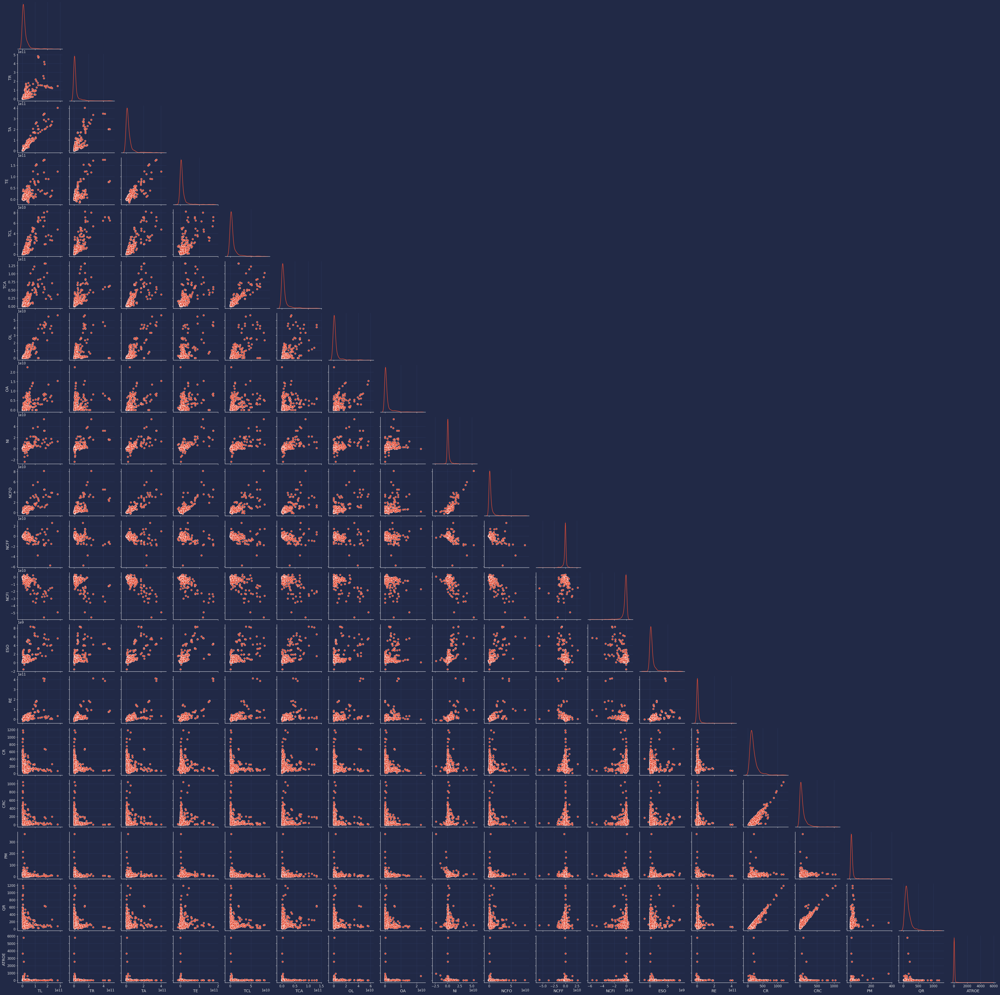

In [93]:
g = sns.PairGrid(test3_df_all, diag_sharey=False, corner=True)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
plt.show()

### Meaningful relationships
There are 16 features that are applicable to having an insight derived from their relationships. A linear regression model will be ran to determine if forecasting is possible along with prove the linearity between them.
#### Here's a closer look

<Axes: xlabel='NCFO', ylabel='NI'>

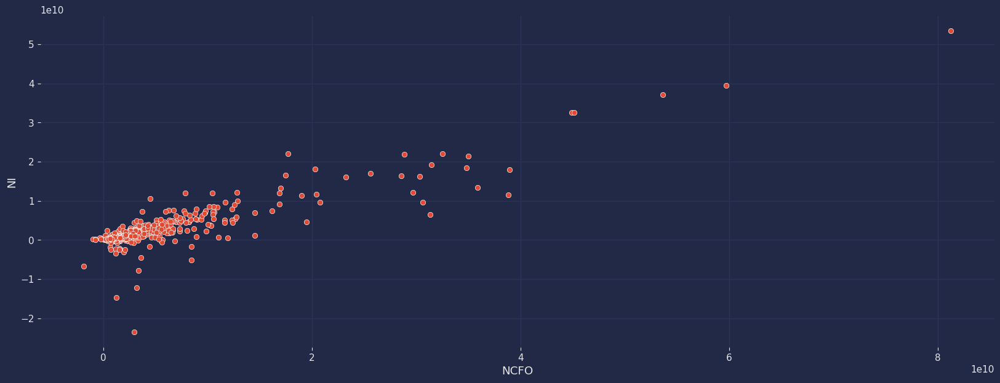

In [94]:
sns.scatterplot(data=test3_df_all, x='NCFO', y='NI')

In [95]:
test2_df_all.columns

Index(['TL', 'SPS', 'LTD', 'TE', 'AP', 'LTI', 'CS', 'SGA', 'STDCPLTD', 'D',
       'CE', 'ESO', 'TA'],
      dtype='object')

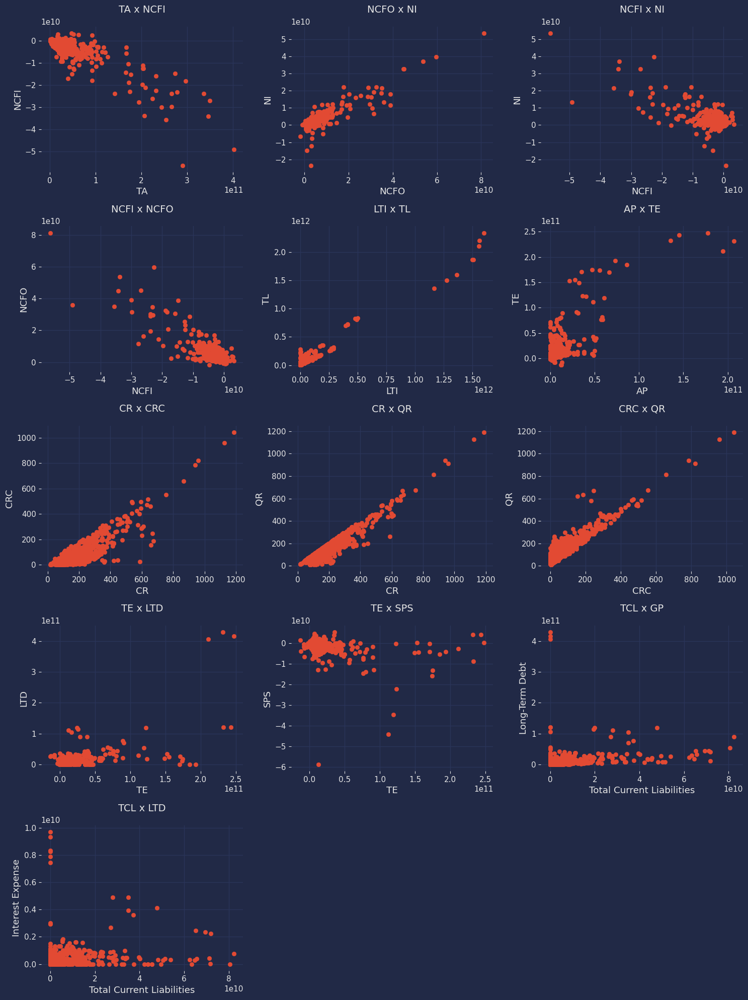

In [96]:
tests = [test3_df_all[['TA', 'NCFI']], test3_df_all[['NCFO', 'NI']], test3_df_all[['NCFI', 'NI']], test3_df_all[['NCFI', 'NCFO']], test2_df_all[['LTI', 'TL']],
           test2_df_all[['AP', 'TE']], test3_df_all[['CR', 'CRC']], test3_df_all[['CR', 'QR']], test3_df_all[['CRC', 'QR']],
           test2_df_all[['TE', 'LTD']], test2_df_all[['TE', 'SPS']],
           metrics_v4[['Total Current Liabilities', 'Long-Term Debt']], metrics_v4[['Total Current Liabilities', 'Interest Expense']]]

test_names = ['TA x NCFI', 'NCFO x NI', 'NCFI x NI', 'NCFI x NCFO', 'LTI x TL', 'AP x TE' , 'CR x CRC', 'CR x QR', 'CRC x QR', 'TE x LTD', 'TE x SPS', 
             'TCL x GP', 'TCL x LTD', 'TCL x IE']

fig, axs = plt.subplots(5, 3, figsize=(15, 20))
axs = axs.flatten()

for ax, (test, name) in zip(axs, zip(tests, test_names)):
    ax.scatter(test.iloc[:, 0], test.iloc[:, 1])
    ax.set_title(name)
    ax.set_xlabel(test.columns[0])
    ax.set_ylabel(test.columns[1])
    
fig.delaxes(axs[-2])
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

In [97]:
tests = [test3_df_all[['TA', 'NCFI']], test3_df_all[['NCFO', 'NI']], test3_df_all[['NCFI', 'NI']], test3_df_all[['NCFI', 'NCFO']], test2_df_all[['LTI', 'TL']],
           test3_df_all[['CR', 'CRC']], test3_df_all[['CR', 'QR']], test3_df_all[['CRC', 'QR']], test2_df_all[['TE', 'LTD']], test2_df_all[['TE', 'SPS']],
           metrics_v4[['Total Current Liabilities', 'Long-Term Debt']], metrics_v4[['Total Current Liabilities', 'Interest Expense']]]

In [98]:
# truncating outliers
test2_te_ltd = test2_df_all[['TE', 'LTD']].query('LTD < 200000000000')
test2_te_sps = test2_df_all[['TE', 'SPS']].query('SPS > -20000000000')
test2_tcl_ie = metrics_v4[['Total Current Liabilities', 'Interest Expense']].query('`Interest Expense` < 6000000000')
test2_tcl_ltd = metrics_v4[['Total Current Liabilities', 'Long-Term Debt']].query('`Long-Term Debt` < 200000000000')

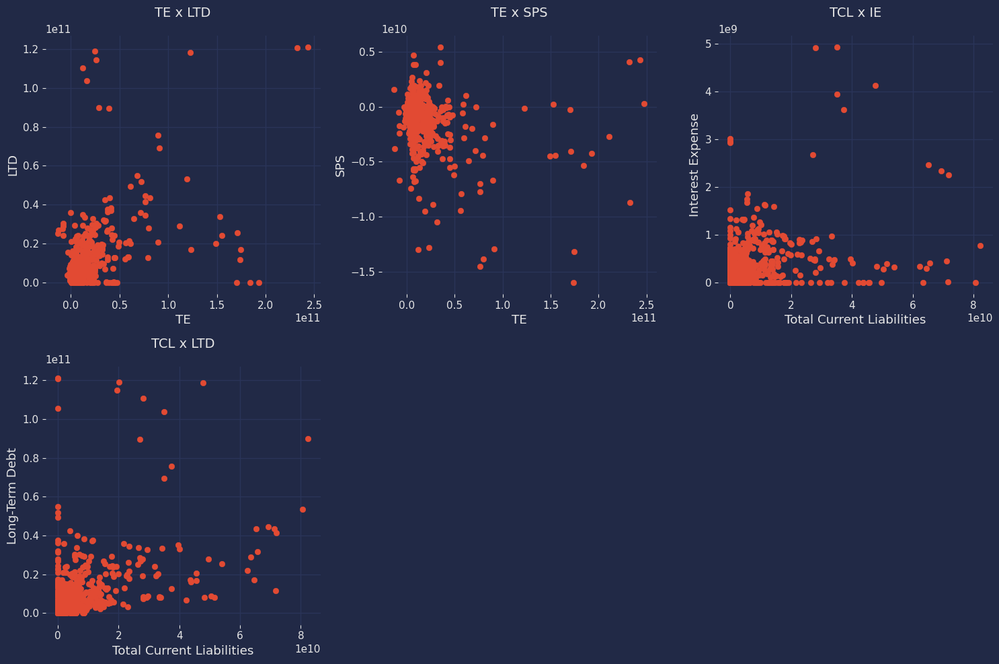

In [99]:
transformed = [test2_te_ltd, test2_te_sps, test2_tcl_ie, test2_tcl_ltd]
name = ['TE x LTD', 'TE x SPS', 'TCL x IE', 'TCL x LTD']

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.flatten()

for ax, (test, name) in zip(axs, zip(transformed, name)):
    ax.scatter(test.iloc[:, 0], test.iloc[:, 1])
    ax.set_title(name)
    ax.set_xlabel(test.columns[0])
    ax.set_ylabel(test.columns[1])
    
fig.delaxes(axs[-2])
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

### Not looking very linear
Truncating the outliers and other transformations for these provided a zoom in and it depicts an extremely non-linear relationship among TE x LTD, TE x SPS, TCL x LTD and TCL x IE. Those 4 features have been removed from the test set.
### Now begins inference on slope justification

In [100]:
test3_df_all.replace(0, np.nan, inplace=True)
test2_df_all.replace(0, np.nan, inplace=True)
test3_df_all.dropna(inplace=True)
test2_df_all.dropna(inplace=True)

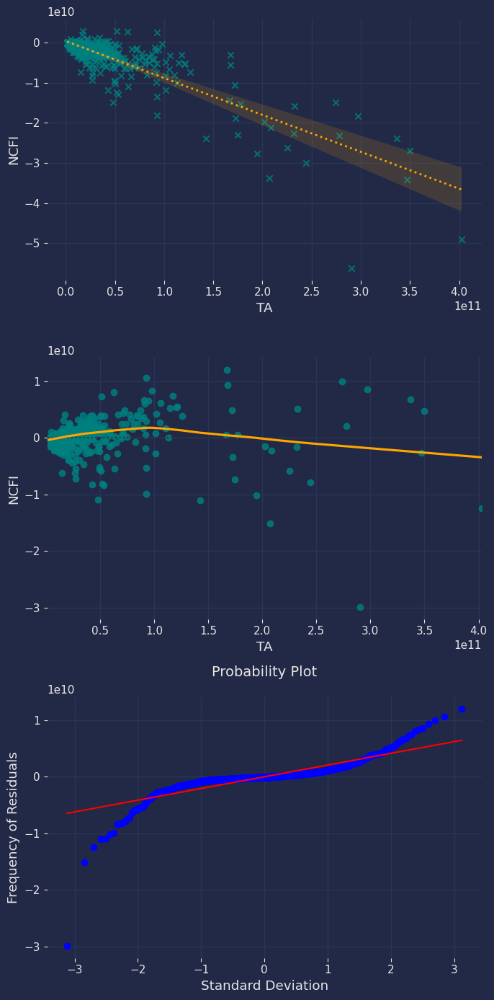

SST: 1.7910326628627058e+22
SSE: 4.682161995444102e+21
MSE: 6.144569547826906e+18
SSR: 1.3228164633182966e+22
r-squared: 73.858%


In [101]:
x_var = 'TA'
y_var = 'NCFI'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test3_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test3_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test3_df_all[x_var], test3_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test3_df_all[x_var])

# Calculate the residuals for y
residuals_y = test3_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test3_df_all[y_var].count()
avg = test3_df_all[y_var].mean()
SSE = round(sum((test3_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test3_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test3_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list = ['TA x NCFI']
sse_list = [SSE]
mse_list = [MSE]
ssr_list = [SSR]
sst_list = [SST]
r2_list = [r2]

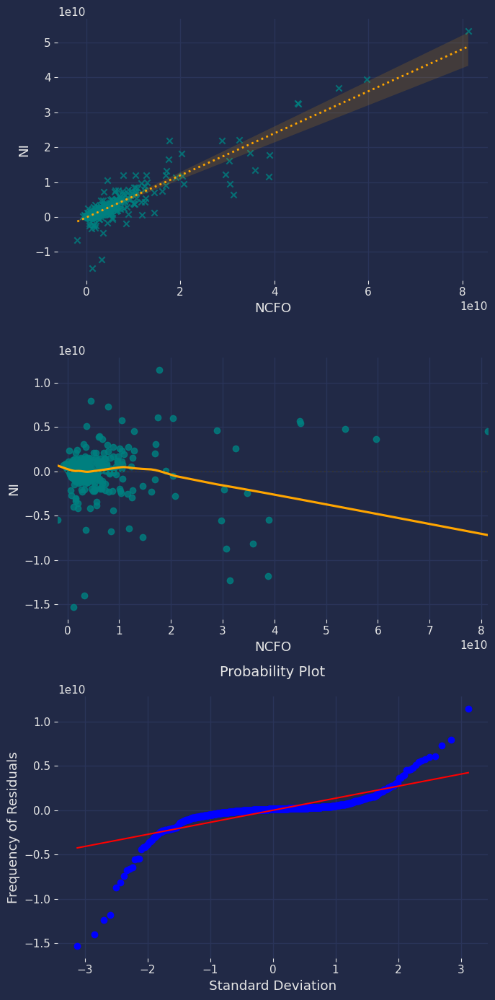

SST: 1.3944714661486314e+22
SSE: 2.2846084154153076e+21
MSE: 2.9981737735109023e+18
SSR: 1.1660106246071024e+22
r-squared: 83.617%


In [102]:
x_var = 'NCFO'
y_var = 'NI'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test3_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test3_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test3_df_all[x_var], test3_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test3_df_all[x_var])

# Calculate the residuals for y
residuals_y = test3_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test3_df_all[y_var].count()
avg = test3_df_all[y_var].mean()
SSE = round(sum((test3_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test3_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test3_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append('NCFO x NI')
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

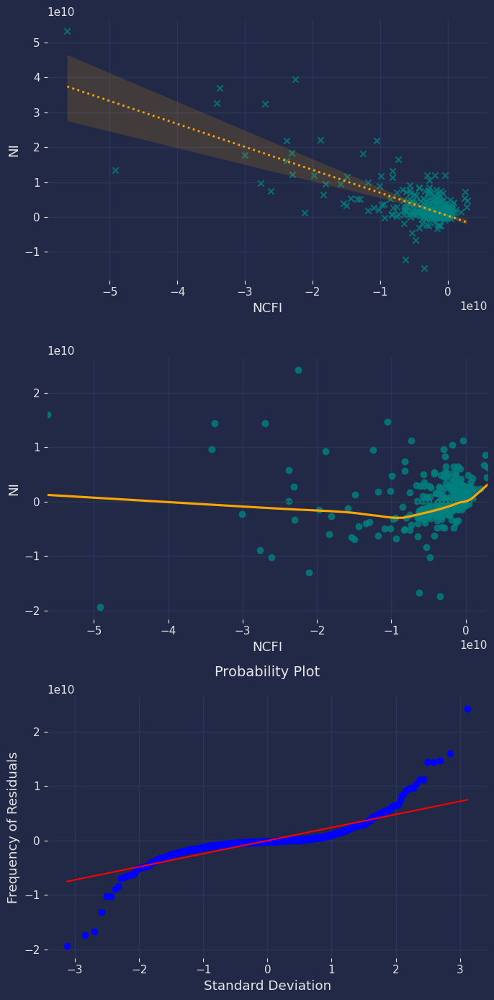

SST: 1.3944714661486314e+22
SSE: 6.192711482627579e+21
MSE: 8.126917956204171e+18
SSR: 7.752003178858751e+21
r-squared: 55.591%


In [103]:
x_var = 'NCFI'
y_var = 'NI'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test3_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test3_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test3_df_all[x_var], test3_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test3_df_all[x_var])

# Calculate the residuals for y
residuals_y = test3_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test3_df_all[y_var].count()
avg = test3_df_all[y_var].mean()
SSE = round(sum((test3_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test3_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test3_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append('NCFI x NI')
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

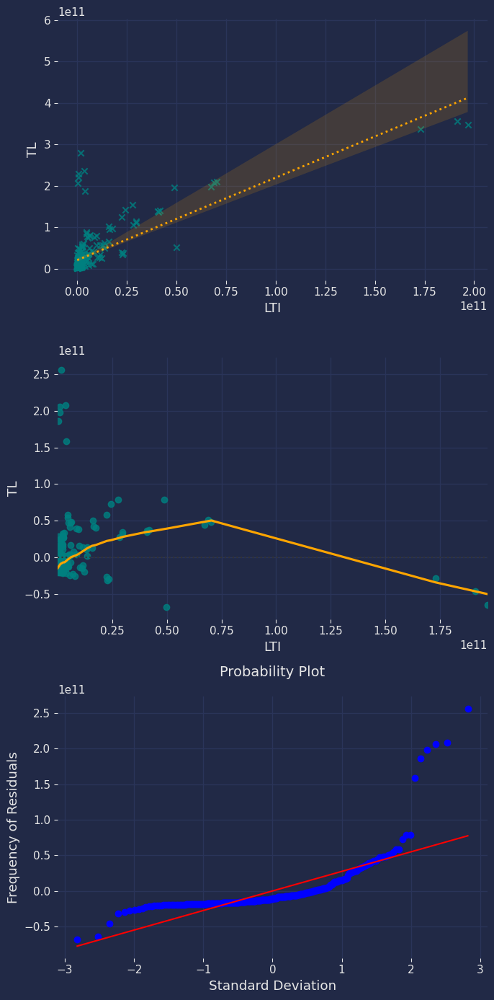

SST: 8.85823828846091e+23
SSE: 3.7608829921448736e+23
MSE: 1.3058621500503034e+21
SSR: 5.097355296316036e+23
r-squared: 57.544%


In [104]:
x_var = 'LTI'
y_var = 'TL'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test2_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test2_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test2_df_all[x_var], test2_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test2_df_all[x_var])

# Calculate the residuals for y
residuals_y = test2_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test2_df_all[y_var].count()
avg = test2_df_all[y_var].mean()
SSE = round(sum((test2_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test2_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test2_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append('LTI x TL')
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

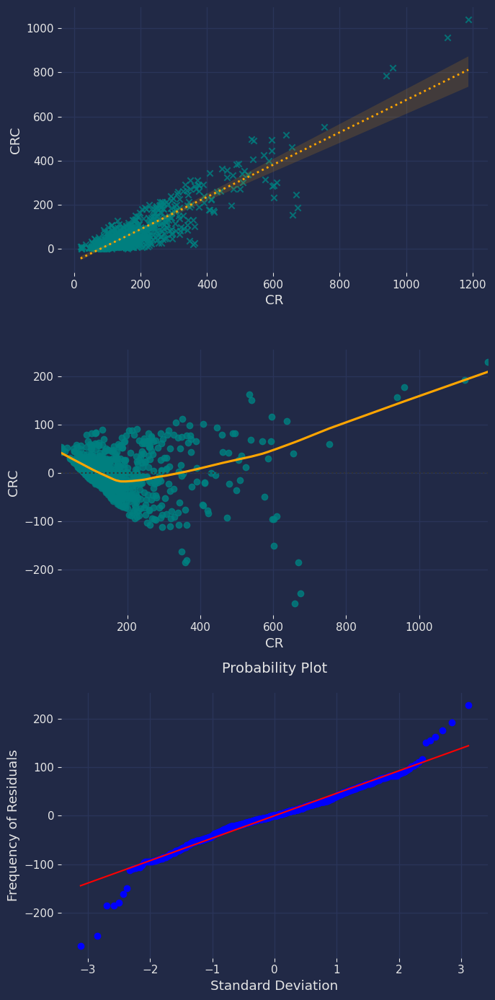

SST: 8482281.87
SSE: 1706183.91
MSE: 2239.086
SSR: 6776097.96
r-squared: 79.885%


In [105]:
x_var = 'CR'
y_var = 'CRC'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test3_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test3_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test3_df_all[x_var], test3_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test3_df_all[x_var])

# Calculate the residuals for y
residuals_y = test3_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test3_df_all[y_var].count()
avg = test3_df_all[y_var].mean()
SSE = round(sum((test3_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test3_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test3_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append('CR x CRC')
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

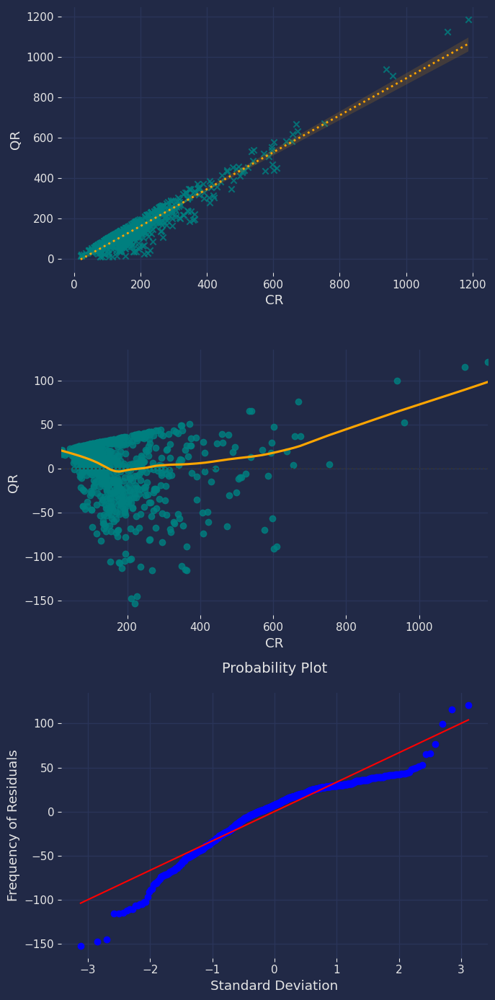

SST: 11471042.23
SSE: 919287.34
MSE: 1206.414
SSR: 10551754.89
r-squared: 91.986%


In [106]:
x_var = 'CR'
y_var = 'QR'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test3_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test3_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test3_df_all[x_var], test3_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test3_df_all[x_var])

# Calculate the residuals for y
residuals_y = test3_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test3_df_all[y_var].count()
avg = test3_df_all[y_var].mean()
SSE = round(sum((test3_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test3_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test3_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append('CR x QR')
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

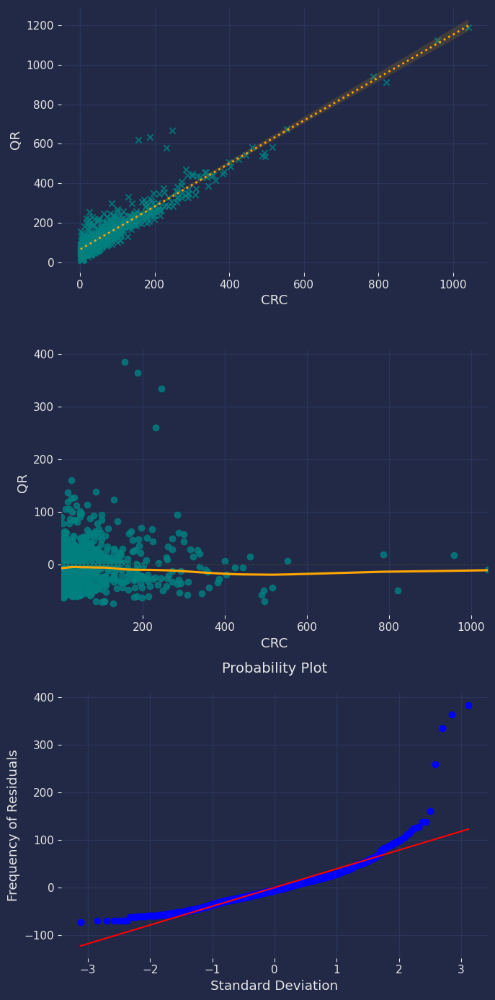

SST: 11471042.23
SSE: 1449215.23
MSE: 1901.857
SSR: 10021826.99
r-squared: 87.366%


In [107]:
x_var = 'CRC'
y_var = 'QR'

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 14))
sns.regplot(data=test3_df_all, x=x_var, y=y_var, color='teal', marker="x", x_ci='sd', line_kws={'color': 'orange', 'lw': 2, 'ls': ':'}, ax=ax1)
plt.xlabel(x_var)
plt.ylabel(y_var)

# Residual chart. lowess confirmed a higher order of 2 was more appopriate from the improved structure of residual plot.
sns.residplot(data=test3_df_all, x=x_var, y=y_var, color='teal', line_kws=dict(color="orange"), lowess=True, order=1, ax=ax2)
plt.xlabel('Residuals')
plt.ylabel(y_var)

# Fit a 2nd order polynomial and get the predicted values
coefficients = np.polyfit(test3_df_all[x_var], test3_df_all[y_var], 1)
predicted_y = np.polyval(coefficients, test3_df_all[x_var])

# Calculate the residuals for y
residuals_y = test3_df_all[y_var] - predicted_y

stats.probplot(residuals_y, dist='norm', plot=ax3)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency of Residuals')
plt.tight_layout()
plt.show()

# Assessing goodness of fit metrics
count = test3_df_all[y_var].count()
avg = test3_df_all[y_var].mean()
SSE = round(sum((test3_df_all[y_var] - predicted_y)**2), 2)
MSE = round(sum((test3_df_all[y_var] - predicted_y)**2)/count, 3)
SSR = round(sum((predicted_y - avg)**2), 2)
SST = round(sum((test3_df_all[y_var] - avg)**2), 2)
r2 = SSR/SST

print('====================================')
print(f'SST: {SST}\nSSE: {SSE}\nMSE: {MSE}\nSSR: {SSR}\nr-squared: {round(r2*100, 3)}%')
print('====================================')

# collecting all metrics into a DF
var_list.append('CRC x QR')
sse_list.append(SSE)
mse_list.append(MSE)
ssr_list.append(SSR)
sst_list.append(SST)
r2_list.append(r2)

### And the results are...
* TA x NCFI: Yes
* NCFO x NI: Yes
* NCFI x NI: Yes
* LTI x TL: No
* CR x CRC: Yes
* CR x QR: Yes
* CRC x QR: Yes
### Linear Regression models will be fitted to the Yes features.
These numbers are compressed into a table that has scaled values after the LR models.

## Scaling Test Sets

In [108]:
test2a_ta, hypno_ta, SS_ta = SSstandardizeII(test3_df_all[['TA']], hypno[['TA']])
test2a_ncfi, hypno_ncfi, SS_ncfi = SSstandardizeII(test3_df_all[['NCFI']], hypno[['NCFI']])

test2b_nfco, hypno_ncfo, SS_ncfo = SSstandardizeII(test3_df_all[['NCFO']], hypno[['NCFO']])
test2b_ni, hypno_ni, SS_ni = SSstandardizeII(test3_df_all[['NI']], hypno[['NI']])

test2d_cr, hypno_cr, SS_cr = SSstandardizeII(test3_df_all[['CR']], hypno[['CR']])
test2d_crc, hypno_crc, SS_crc = SSstandardizeII(test3_df_all[['CRC']], hypno[['CRC']])

test2e_cr, SS1 = SSstandardize(test3_df_all[['CR']])
test2e_qr, hypno_qr, SS_qr = SSstandardizeII(test3_df_all[['QR']], hypno[['QR']])

test2f_crc, SS2 = SSstandardize(test3_df_all[['CRC']])
test2f_qr, SS3 = SSstandardize(test3_df_all[['QR']])

test2g_ncfi, SS4 = SSstandardize(test3_df_all[['NCFI']])
test2g_ni, SS5 = SSstandardize(test3_df_all[['NI']])

### Modelling

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.739
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     116.7
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           2.05e-25
Time:                        09:32:44   Log-Likelihood:                -616.25
No. Observations:                 762   AIC:                             1237.
Df Residuals:                     760   BIC:                             1246.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0051      0.019      0.275      0.7

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


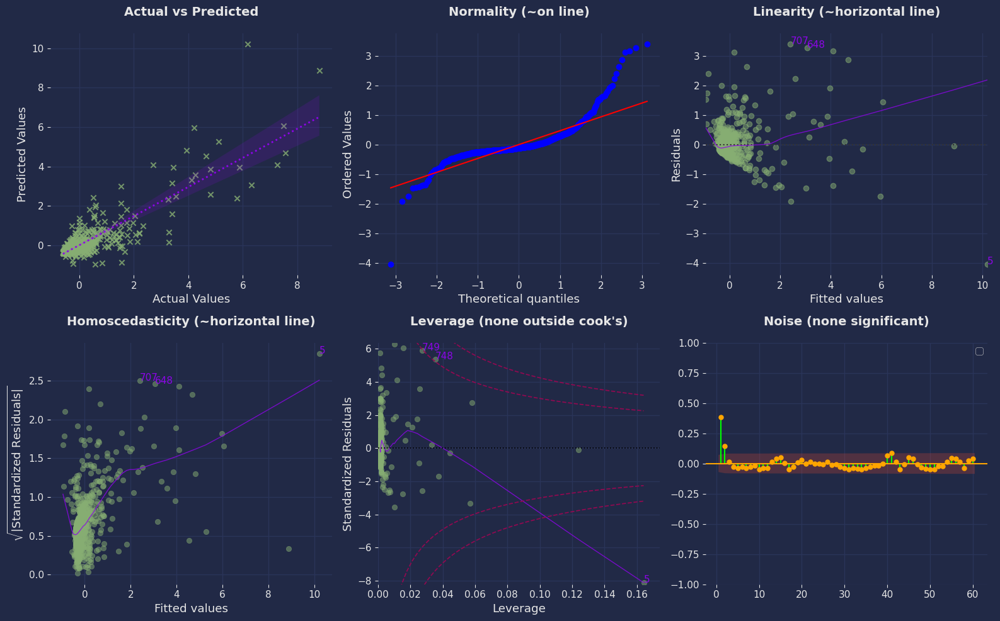

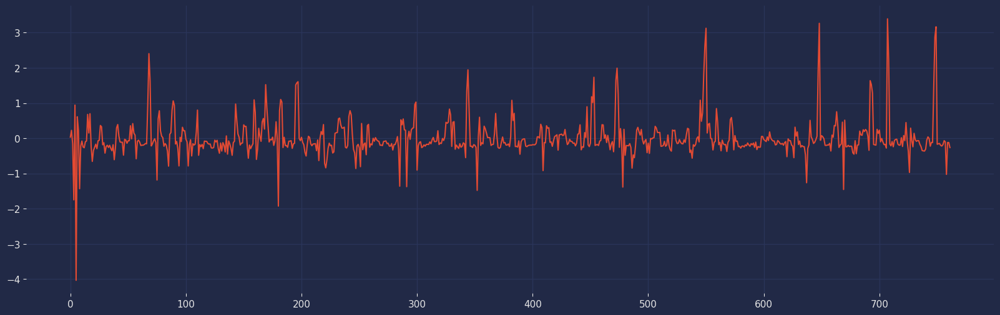

In [109]:
X = test2a_ncfi
X = sm.add_constant(X)
Y = test2a_ta

ncfiXta_model = sm.OLS(Y, X).fit(se_type='HC3', cov_type='HC3', use_t=True)
predictions = ncfiXta_model.predict(X)
model_params['ncfi_ta'] = [ncfiXta_model.params[0], ncfiXta_model.params[1], ncfiXta_model.bse[1], ncfiXta_model.tvalues[1], ncfiXta_model.pvalues[1], [i for i in ncfiXta_model.conf_int()[1]]]


print(ncfiXta_model.summary())

SST = ncfiXta_model.centered_tss
SSR = ncfiXta_model.ssr
SSE = ncfiXta_model.mse_model
MSE = ncfiXta_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

# collecting all metrics into a DF
var_list = ['TA x NCFI']
sse_list = [round(SSE, 2)]
mse_list = [round(MSE, 2)]
ssr_list = [round(SSR, 2)]
sst_list = [round(SST, 2)]

cls = LinearRegDiagnostic(ncfiXta_model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.836
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     355.2
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           2.69e-65
Time:                        09:32:45   Log-Likelihood:                -432.35
No. Observations:                 762   AIC:                             868.7
Df Residuals:                     760   BIC:                             878.0
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.015      0.016      0.9

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


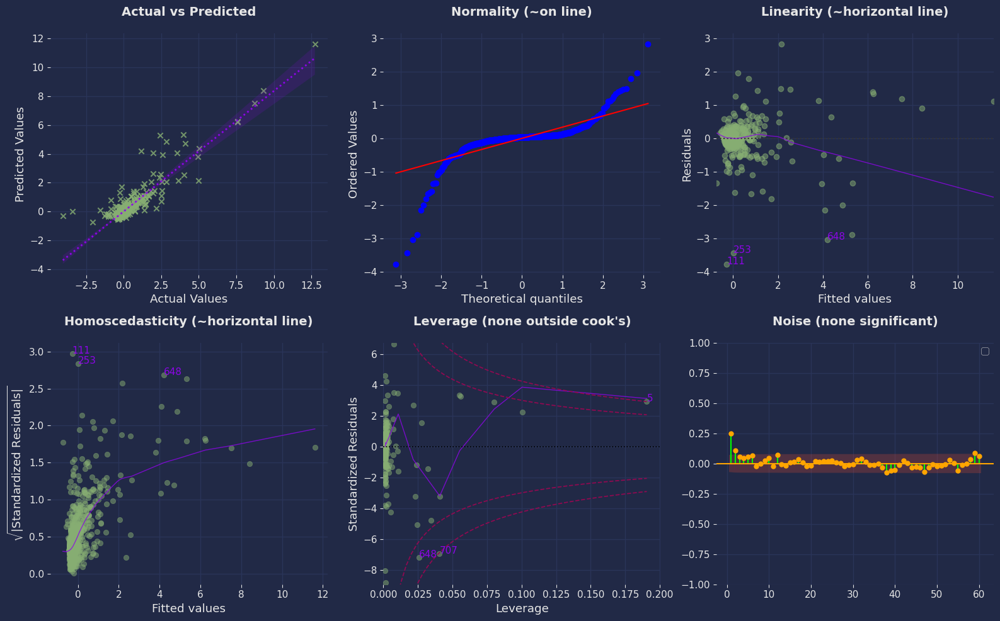

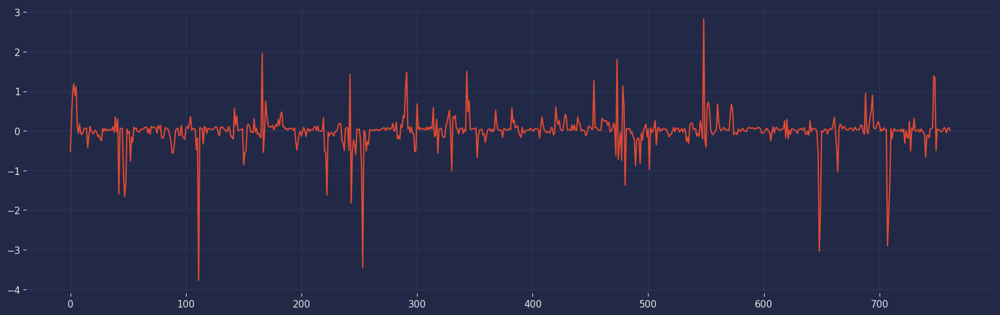

In [110]:
X = test2b_nfco
X = sm.add_constant(X)
Y = test2b_ni

ncfoXni_model = sm.OLS(Y, X).fit(se_type='HC3', cov_type='HC3', use_t=True)
predictions = ncfoXni_model.predict(X)
model_params['ncfo_ni'] = [ncfoXni_model.params[0], ncfoXni_model.params[1], ncfoXni_model.bse[1], ncfoXni_model.tvalues[1], ncfoXni_model.pvalues[1], [i for i in ncfoXni_model.conf_int()[1]]]


print(ncfoXni_model.summary())

SST = ncfoXni_model.centered_tss
SSR = ncfoXni_model.ssr
SSE = ncfoXni_model.mse_model
MSE = ncfoXni_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

# collecting all metrics into a DF
var_list.append('NFCO x NI')
sse_list.append(round(SSE, 2))
mse_list.append(round(MSE, 2))
ssr_list.append(round(SSR, 2))
sst_list.append(round(SST, 2))

cls = LinearRegDiagnostic(ncfoXni_model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     394.2
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           5.48e-71
Time:                        09:32:46   Log-Likelihood:                -493.44
No. Observations:                 762   AIC:                             990.9
Df Residuals:                     760   BIC:                             1000.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0121      0.017      0.716      0.4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


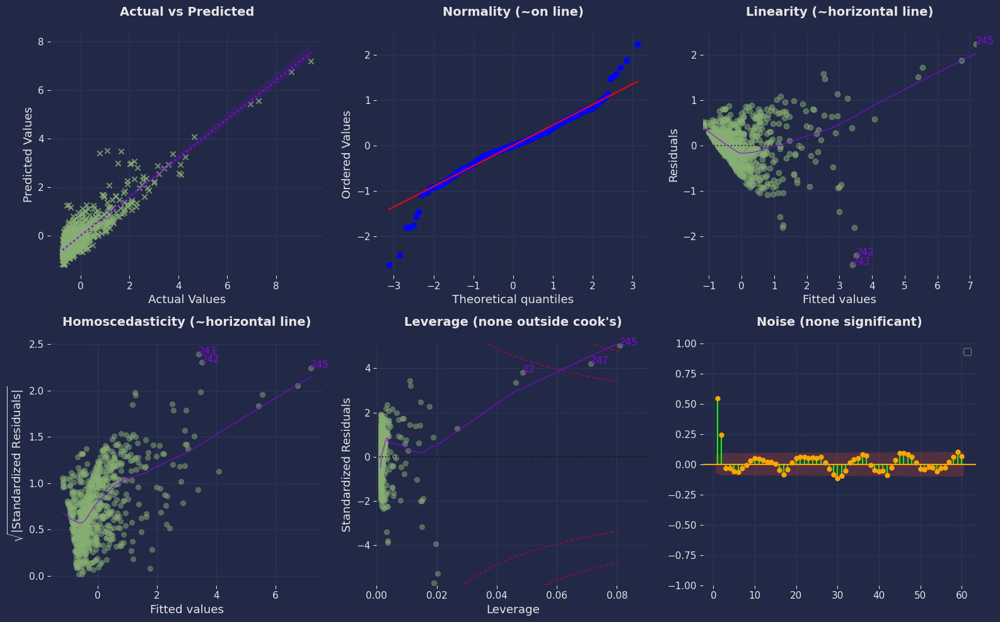

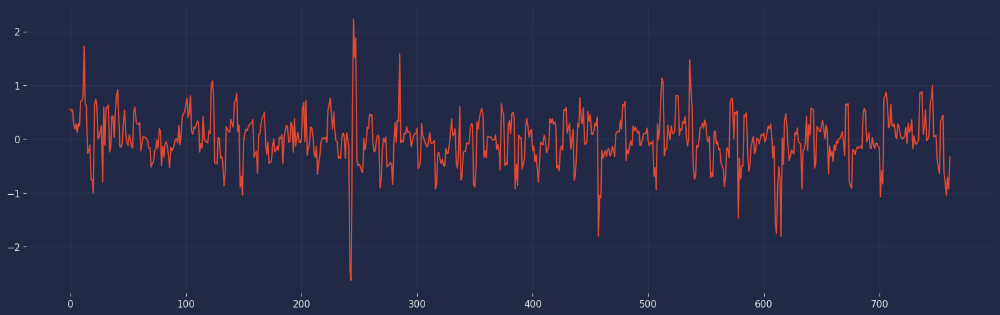

In [111]:
X = test2d_cr
X = sm.add_constant(X)
Y = test2d_crc

model = sm.OLS(Y, X).fit(se_type='HC3', cov_type='HC3', use_t=True)
predictions = model.predict(X)

print(model.summary())

SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

# collecting all metrics into a DF
var_list.append('CR x CRC')
sse_list.append(round(SSE, 2))
mse_list.append(round(MSE, 2))
ssr_list.append(round(SSR, 2))
sst_list.append(round(SST, 2))

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     2452.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):          4.70e-240
Time:                        09:32:47   Log-Likelihood:                -142.53
No. Observations:                 762   AIC:                             289.1
Df Residuals:                     760   BIC:                             298.3
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0153      0.011      1.437      0.1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


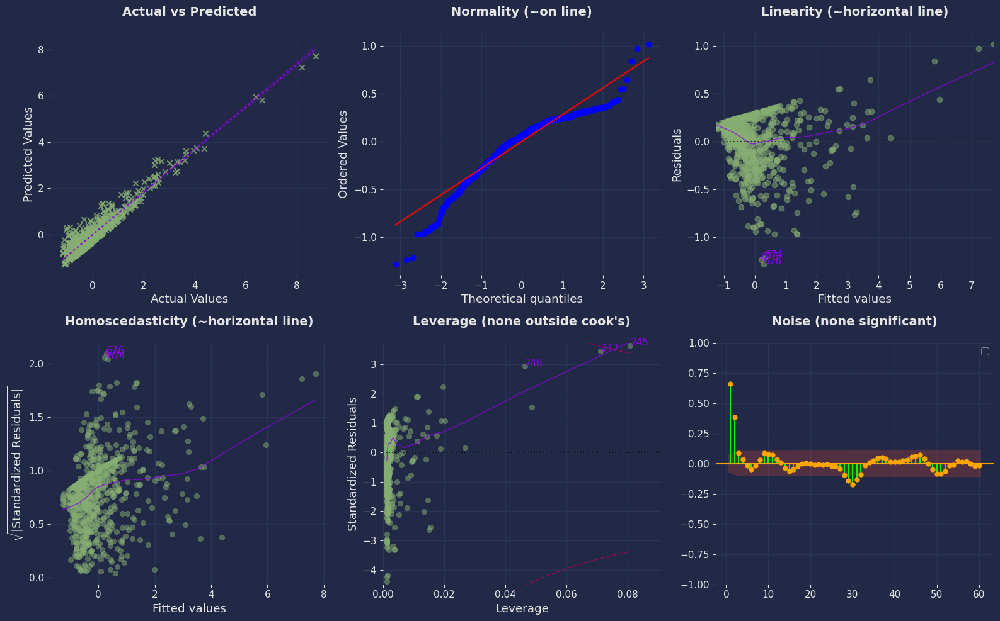

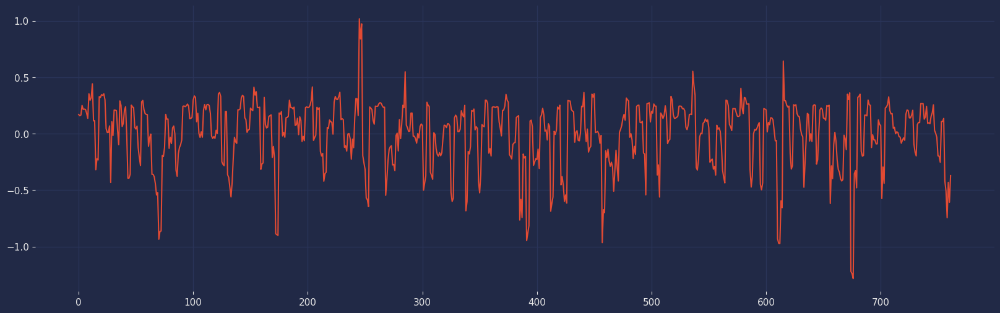

In [112]:
X = test2e_cr
X = sm.add_constant(X)
Y = test2e_qr

crXqr_model = sm.OLS(Y, X).fit(se_type='HC3', cov_type='HC3', use_t=True)
predictions = crXqr_model.predict(X)
model_params['cr_qr'] = [crXqr_model.params[0], crXqr_model.params[1], crXqr_model.bse[1], crXqr_model.tvalues[1], crXqr_model.pvalues[1], [i for i in crXqr_model.conf_int()[1]]]

print(crXqr_model.summary())

SST = crXqr_model.centered_tss
SSR = crXqr_model.ssr
SSE = crXqr_model.mse_model
MSE = crXqr_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

# collecting all metrics into a DF
var_list.append('CR x QR')
sse_list.append(round(SSE, 2))
mse_list.append(round(MSE, 2))
ssr_list.append(round(SSR, 2))
sst_list.append(round(SST, 2))

cls = LinearRegDiagnostic(crXqr_model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.874
Model:                            OLS   Adj. R-squared:                  0.873
Method:                 Least Squares   F-statistic:                     4965.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        09:32:49   Log-Likelihood:                -293.02
No. Observations:                 762   AIC:                             590.0
Df Residuals:                     760   BIC:                             599.3
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -6.852e-17      0.013  -5.31e-15      1.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


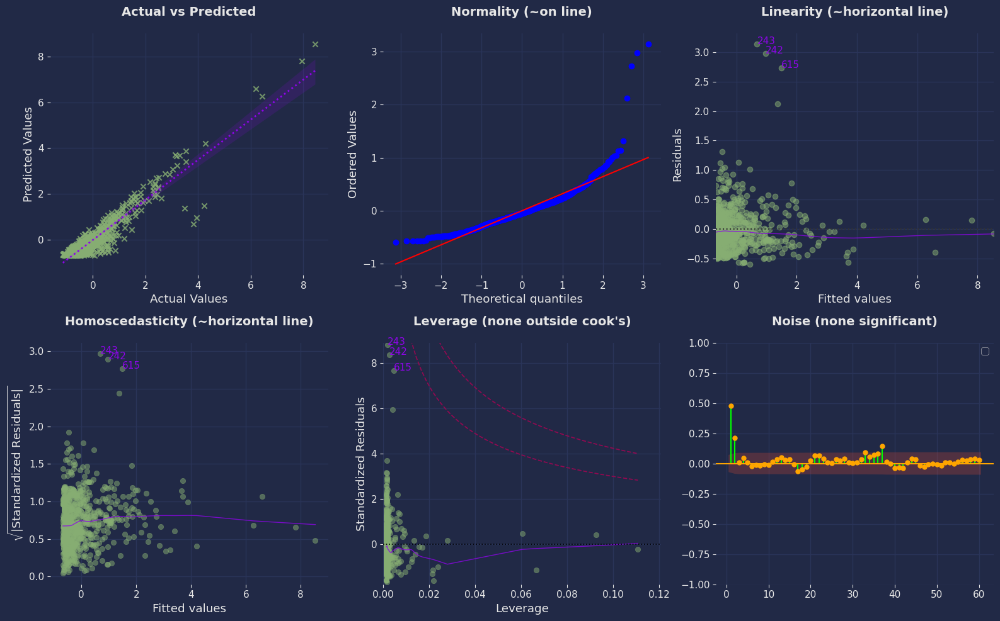

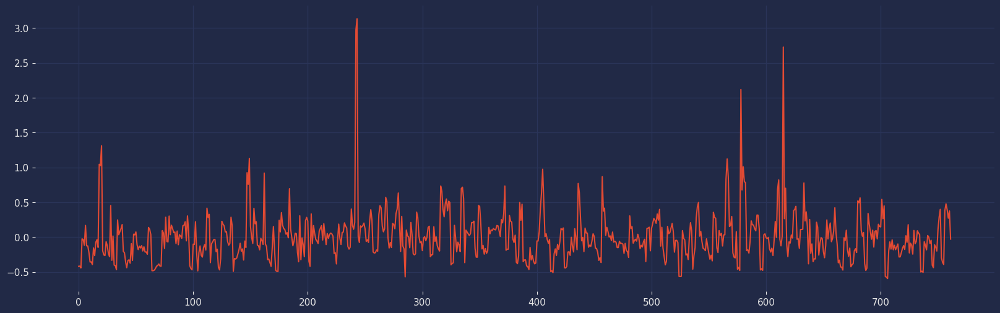

In [113]:
X = test2f_crc
X = sm.add_constant(X)
Y = test2f_qr

crcXqr_model = sm.OLS(Y, X).fit(se_type='HC3', cov_type='HC3', use_t=True)
predictions = crcXqr_model.predict(X)
model_params['crc_qr'] = [crcXqr_model.params[0], crcXqr_model.params[1], crcXqr_model.bse[1], crcXqr_model.tvalues[1], crcXqr_model.pvalues[1], [i for i in crcXqr_model.conf_int()[1]]]

print(crcXqr_model.summary())

SST = crcXqr_model.centered_tss
SSR = crcXqr_model.ssr
SSE = crcXqr_model.mse_model
MSE = crcXqr_model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

# collecting all metrics into a DF
var_list.append('CRC x QR')
sse_list.append(round(SSE, 2))
mse_list.append(round(MSE, 2))
ssr_list.append(round(SSR, 2))
sst_list.append(round(SST, 2))

cls = LinearRegDiagnostic(crcXqr_model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.556
Model:                            OLS   Adj. R-squared:                  0.555
Method:                 Least Squares   F-statistic:                     43.27
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           8.85e-11
Time:                        09:32:50   Log-Likelihood:                -771.96
No. Observations:                 762   AIC:                             1548.
Df Residuals:                     760   BIC:                             1557.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.214e-17      0.025   4.89e-16      1.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


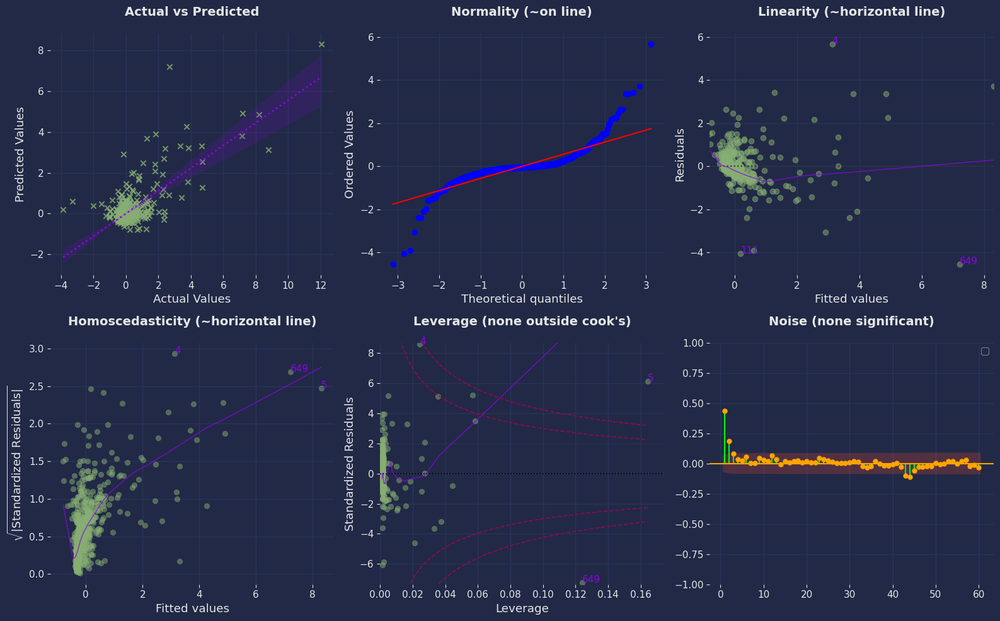

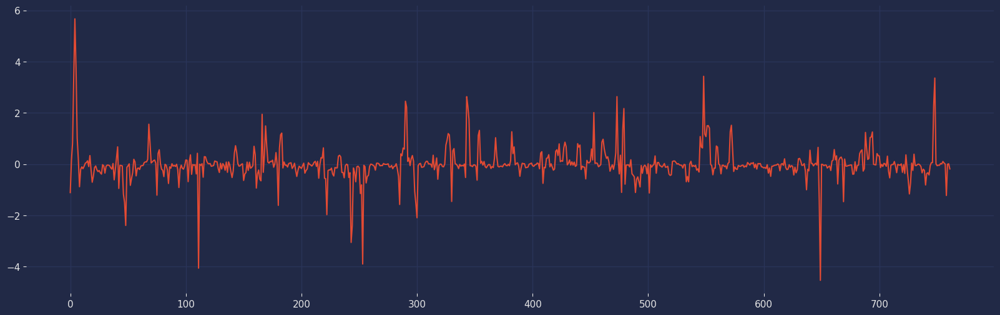

In [114]:
X = test2g_ncfi
X = sm.add_constant(X)
Y = test2g_ni

model = sm.OLS(Y, X).fit(se_type='HC3', cov_type='HC3', use_t=True)
predictions = model.predict(X)

print(model.summary())

SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

# collecting all metrics into a DF
var_list.append('CRC x QR')
sse_list.append(round(SSE, 2))
mse_list.append(round(MSE, 2))
ssr_list.append(round(SSR, 2))
sst_list.append(round(SST, 2))

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

In [115]:
test2_metrics = pd.DataFrame({'X Variable':var_list, 'SST':sst_list, 'SSE':sse_list, 'MSE_residual':mse_list, 'SSR':ssr_list})
test2_metrics.sort_values(by='SSE')

,X Variable,SST,SSE,MSE_residual,SSR
5,CRC x QR,762.00,423.60,0.45,338.40
0,TA x NCFI,860.19,635.31,0.30,224.87
2,CR x CRC,809.89,646.98,0.21,162.91
4,CRC x QR,762.00,665.73,0.13,96.27
1,NFCO x NI,847.05,708.27,0.18,138.77
3,CR x QR,809.28,744.42,0.09,64.86


In [116]:
hypnoS = pd.DataFrame()
hypnoS['symbol'] = hypno['symbol']
hypnoS['year'] = hypno['year']
hypnoS['niS'] = hypno_ni
hypnoS['crcS'] = hypno_crc
hypnoS['qrS'] = hypno_qr
hypnoS['ncfoS'] = hypno_ncfo
hypnoS['crS'] = hypno_cr
hypnoS[['ncfoAVG', 'volumeAVG']] = hypno_cfo_avg
hypnoS['esoS'] = hypno_eso_avg[:, 0]

In [117]:
hypnoS[hypnoS['symbol']=="HOLX"]

,symbol,year,niS,crcS,qrS,ncfoS,crS,ncfoAVG,volumeAVG,esoS
561,HOLX,2013,-0.720,-0.003,-0.214,-0.430,-0.290,-0.577,1.136,0.172
562,HOLX,2014,-0.427,0.427,0.424,-0.427,0.536,-0.561,-0.397,0.264
563,HOLX,2015,-0.399,-0.238,-0.374,-0.382,-0.409,-0.252,-0.126,0.225


In [118]:
hypno.reset_index(drop=True, inplace=True)
hypno[hypno['symbol']=="HOLX"]

,symbol,year,CR,QR,CRC,NCFI,NCFO,NI,TA,ESO,AVG volume (millions)
53,HOLX,2013,149.0,123.0,76.0,1.880e+07,4.938e+08,-1.173e+09,9.001e+09,2.690e+08,5.352e+06
54,HOLX,2014,253.0,199.0,120.0,-6.700e+07,5.084e+08,1.730e+07,8.415e+09,2.883e+08,1.380e+06
55,HOLX,2015,134.0,104.0,52.0,-8.610e+07,7.861e+08,1.316e+08,7.642e+09,2.800e+08,2.082e+06


### Hypothesis Testing
Predictions pertains to 55 companies, each with a record for 2013 - 2015. The linear models which have shown efficacy are involved. The alpha level for each is .05 and 95% confidence level.

### Risk Assessment
With the 4 models proven as obtaining higher accuracy, their financial risks are evaluated against the rest of the companies reporting to the NYSE. Actionable insights will be developed for HOLX, based on liklihood and severity of the risk under inspection. It begins with Linear Regression output, then implements other techniques to provide a transparent yet comprehensive report.
* Net Cash Flows and AVG Volume
* Net Cash Flows Operating and Net Income
* Cash Ratio and Quick Ratio
* Current Ratio and Quick Ratio

### Net Cash Flows Operating (x) and AVG Volume (y)
alpha = 0.05 | Two-tailed test
#### Test 1
* null: β = 0
* alternate: B != 0
#### Results
* A significance was detected in the relationship between X and Y, null hypothesis is rejected. Since a 0 isn't clarified within the confidence interval, an approximately linear relationship is established.

In [119]:
statistics = ['y-int:', 'slope:', 'std err:', 't:', 'p-value:', 'confidence interval:']
for i, item in enumerate(model_params['cfo_avg']):
    if i < 5:
        print(statistics[i], [round(item, 3)])
    else:
        CI = f'[{round(item[0], 3)}, {round(item[1], 3)}]'
        print(statistics[i], CI)

y-int: [0.107]
slope: [0.848]
std err: [0.184]
t: [4.621]
p-value: [0.0]
confidence interval: [0.487, 1.209]


In [120]:
alpha = .05

X_H1 = hypno_cfo_avg[:, 0]
X_H1 = sm.add_constant(X_H1)
trueY_H1 = hypno_cfo_avg[:, 1]
Y_pred_H1 = cfo_avg_model.predict(X_H1)

H1_diff = np.round((Y_pred_H1-trueY_H1)/trueY_H1*100, 2)

H1_compare = pd.DataFrame({'true':trueY_H1, 'predicted':Y_pred_H1, 'diff %':H1_diff})
print(f'Average diff: {round(H1_compare['diff %'].mean(), 2)}%')
H1_compare

Average diff: -111.06%


,true,predicted,diff %
0,-0.348,-0.104,-70.06
1,-0.323,0.534,-265.19
2,-0.225,2.852,-1365.52
3,-0.167,-0.316,89.35
4,-0.442,-0.227,-48.61
...,...,...,...
116,-0.652,-0.455,-30.21
117,-0.532,-0.410,-22.94
118,5.069,0.280,-94.48
119,6.791,0.017,-99.75


In [121]:
to_unscale = np.array([[-.281, .409],[-.275, -.290],[-.152, -.166]])
df_unscaled = SS_cfo_avg.inverse_transform(to_unscale)

diff_2013 = round(df_unscaled[0, 0]-df_unscaled[0, 1], 2)
diff_2014 = round(df_unscaled[1, 0]-df_unscaled[1, 1], 2)
diff_2015 = round(df_unscaled[2, 0]-df_unscaled[2, 1], 2)
diff_2013P = round((df_unscaled[0, 0]-df_unscaled[0, 1])/df_unscaled[0, 1]*100, 2)
diff_2014P = round((df_unscaled[1, 0]-df_unscaled[1, 1])/df_unscaled[1, 1]*100, 2)
diff_2015P = round((df_unscaled[2, 0]-df_unscaled[2, 1])/df_unscaled[2, 1]*100, 2)

print(f'Volume outputted by LR model:\n2013: {df_unscaled[0, 0]}\n2014: {df_unscaled[1, 0]}\n2015: {df_unscaled[2, 0]}')
print(f'\nTrue volume:\n2013: {df_unscaled[0, 1]}\n2014: {df_unscaled[1, 1]}\n2015: {df_unscaled[2, 1]}')
print(f'\nVolume diff:\n2013: {diff_2013}\n2014: {diff_2014}\n2015: {diff_2015}')
print(f'\nVolume diff %:\n2013: {diff_2013P}\n2014: {diff_2014P}\n2015: {diff_2015P}')

Volume outputted by LR model:
2013: 759733441.0348866
2014: 765127328.5795629
2015: 875702023.2454259

True volume:
2013: 3467861.3286903137
2014: 1656432.1243608738
2015: 1977772.9274178846

Volume diff:
2013: 756265579.71
2014: 763470896.46
2015: 873724250.32

Volume diff %:
2013: 21807.84
2014: 46091.29
2015: 44177.18


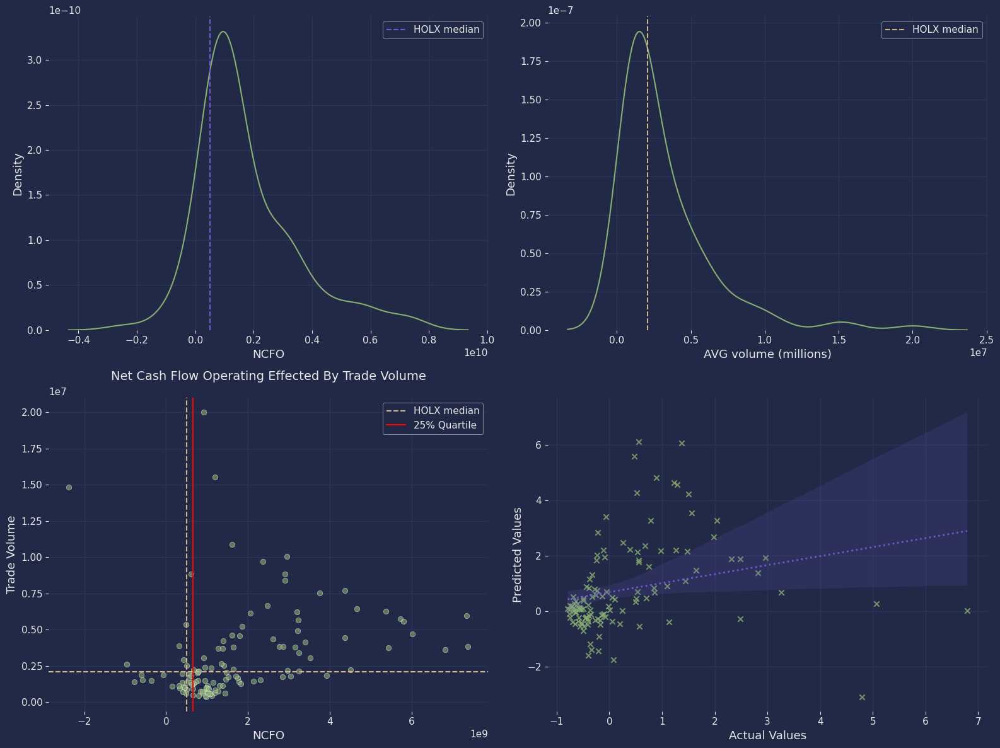

HOLX Median NCFO (x): 508400000.0
HOLX Median VOLUME (y): 2082085.71


In [122]:
HOLX_ncfo = hypno.iloc[53:56, 6].median()
HOLX_v = hypno.iloc[53:56, 10].median()
HOLX_ncfo_avg = round(hypno.iloc[53:56, 6].median(), 2)
HOLX_v_avg = round(hypno.iloc[53:56, 10].median(), 2)

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
q1rt = np.quantile(hypno['NCFO'], .25)
q2rt = np.quantile(hypno['NCFO'], .5)


sns.kdeplot(hypno['NCFO'], color='#87ae73', ax=axs[0, 0])
axs[0, 0].axvline(x=HOLX_ncfo, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 0].legend()
sns.kdeplot(hypno['AVG volume (millions)'], color='#87ae73', ax=axs[0, 1])
axs[0, 1].axvline(x=HOLX_v, c='tan', label='HOLX median', linestyle='dashed')
axs[0, 1].legend()
sns.scatterplot(data=hypno, x='NCFO', y='AVG volume (millions)', color='#87ae73', ax=axs[1, 0], alpha=0.6)
axs[1, 0].axvline(x=HOLX_ncfo, c='tan', label='HOLX median', linestyle='dashed')
axs[1, 0].axvline(x=q1rt, c='red', label='25% Quartile')
# axs[1, 0].axvline(x=q2rt, c='red', label='50% Quartile')
axs[1, 0].axhline(y=HOLX_v, c='tan', linestyle='dashed')
axs[1, 0].set_ylabel('Trade Volume')
axs[1, 0].set_title('Net Cash Flow Operating Effected By Trade Volume')
axs[1, 0].legend()
sns.regplot(data=H1_compare, x='true', y='predicted', color='#87ae73', marker="x",
            line_kws={'color': '#6d5acf', 'lw': 2, 'ls': ':'}, ax=axs[1, 1])
axs[1, 1].set_xlabel('Actual Values')
axs[1, 1].set_ylabel('Predicted Values')

plt.tight_layout()
plt.show()
print(f'HOLX Median NCFO (x): {HOLX_ncfo_avg}')
print(f'HOLX Median VOLUME (y): {HOLX_v_avg}')

* Shares trading volume, given HOLX's NCFO, is off by as much as 39807.25% (2015) with a median of 12031.5% (2014). This indicates NCFO mismanagement or underutilization in terms of capitalizing on investors' perceived value. Note that this effect is likely overdrawn, as the regression plot has linear inconsistencies.
* The KDE plots depct HOLX with a median for both variables in the center of the sample's distribution. Their potential is slightly positive in comparison to other companies within their NCFO range, shown in the scatter plot barely above the 25% quartile. If their full potential was harnessed, the right KDE would have an AVG line farther up.
* Median NCFO balance from 5.1x10^8 into 3.0x10^9 - 7.5x10^9 area, could realistically reign a median Volume return of up to 1.0x10^7.

In [123]:
hypno['NCFO'].median()

1190430000.0

In [124]:
hypno['AVG volume (millions)'].median()

1974778.0487804879

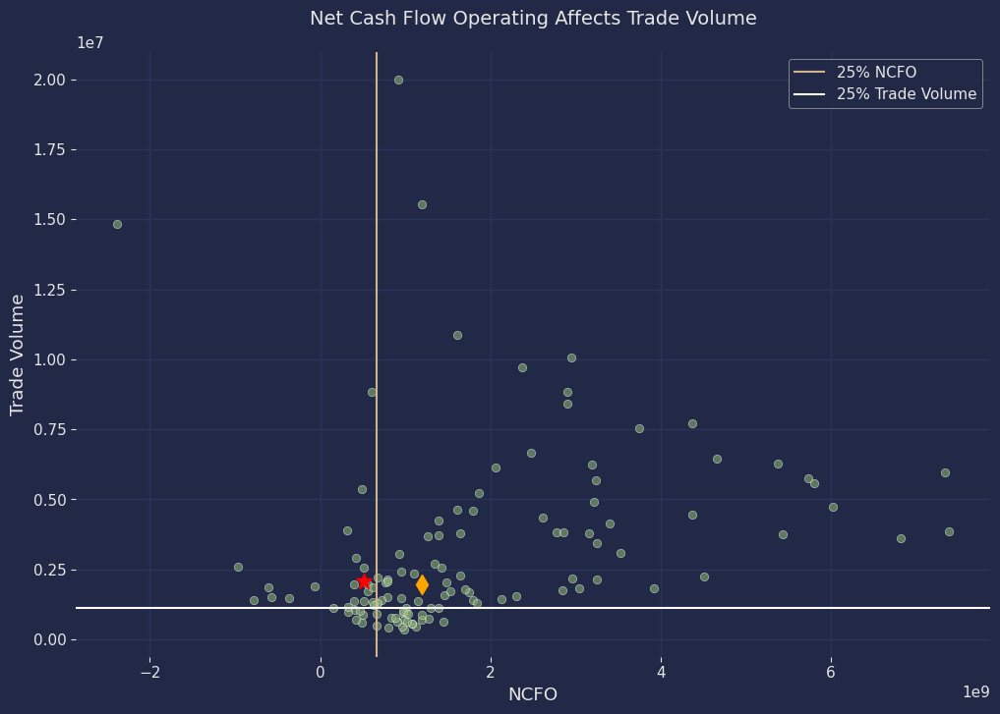

In [125]:
q4rt = np.quantile(hypno['AVG volume (millions)'], .25)
fig, axs = plt.subplots(1,1,figsize=(12,8))
sns.scatterplot(data=hypno, x='NCFO', y='AVG volume (millions)', color='#87ae73', ax=axs, alpha=0.6)
axs.axvline(x=q1rt, c='tan', label='25% NCFO')
axs.axhline(y=q4rt, c='white', label='25% Trade Volume')
axs.plot(508400000, 2082085.71, marker="*", color="red", markersize=12)
axs.plot(hypno['NCFO'].median(), hypno['AVG volume (millions)'].median(), marker="d", color="orange", markersize=10)
axs.set_title('Net Cash Flow Operating Affects Trade Volume')
axs.set_xlabel('NCFO')
axs.set_ylabel('Trade Volume')
axs.legend()
plt.show()

### Estimated Shares Outstanding (x) and AVG Volume (y)
alpha = 0.05 | Two-tailed test
#### Test 2
* null: β = 0
* alternate: B != 0
#### Results
* A significance was detected in the relationship between X and Y, null hypothesis is rejected. Since a 0 isn't clarified within the confidence interval, an approximately linear relationship is established.

In [126]:
statistics = ['y-int:', 'slope:', 'std err:', 't:', 'p-value:', 'confidence interval:']
for i, item in enumerate(model_params['eso_avg']):
    if i < 5:
        print(statistics[i], [round(item, 3)])
    else:
        CI = f'[{round(item[0], 3)}, {round(item[1], 3)}]'
        print(statistics[i], CI)

y-int: [-0.049]
slope: [0.575]
std err: [0.098]
t: [5.858]
p-value: [0.0]
confidence interval: [0.382, 0.768]


In [127]:
X_H2 = hypno_eso_avg[:, 0]
X_H2 = sm.add_constant(X_H2)
trueY_H2 = hypno_eso_avg[:, 1]
Y_pred_H2 = eso_avg_model.predict(X_H2)

H2_diff = (Y_pred_H2-trueY_H2)/trueY_H2*100

H2_compare = pd.DataFrame({'true':trueY_H2, 'predicted':Y_pred_H2, 'diff %':H2_diff})
print(f'Average diff: {round(H2_compare['diff %'].mean(), 2)}%')
H2_compare

Average diff: 9.03%


,true,predicted,diff %
0,-0.252,-0.054,-78.569
1,-0.218,-0.070,-67.818
2,-0.085,-0.075,-11.535
3,-0.006,-0.198,3333.590
4,-0.379,-0.196,-48.157
...,...,...,...
116,-0.665,-0.184,-72.338
117,-0.502,-0.190,-62.081
118,7.099,2.187,-69.198
119,9.436,2.016,-78.639


In [128]:
to_unscale = np.array([[-.099, .5],[-.081, -.224],[-.089, -.096]])
df_unscaled = SS_eso_avg.inverse_transform(to_unscale)

diff_2013 = round(df_unscaled[0, 0]-df_unscaled[0, 1], 2)
diff_2014 = round(df_unscaled[1, 0]-df_unscaled[1, 1], 2)
diff_2015 = round(df_unscaled[2, 0]-df_unscaled[2, 1], 2)
diff_2013P = round((df_unscaled[0, 0]-df_unscaled[0, 1])/df_unscaled[0, 1]*100, 2)
diff_2014P = round((df_unscaled[1, 0]-df_unscaled[1, 1])/df_unscaled[1, 1]*100, 2)
diff_2015P = round((df_unscaled[2, 0]-df_unscaled[2, 1])/df_unscaled[2, 1]*100, 2)

print(f'Volume outputted by LR model:\n2013: {df_unscaled[0, 0]}\n2014: {df_unscaled[1, 0]}\n2015: {df_unscaled[2, 0]}')
print(f'\nTrue volume:\n2013: {df_unscaled[0, 1]}\n2014: {df_unscaled[1, 1]}\n2015: {df_unscaled[2, 1]}')
print(f'\nVolume diff:\n2013: {diff_2013}\n2014: {diff_2014}\n2015: {diff_2015}')
print(f'\nVolume diff %:\n2013: {diff_2013P}\n2014: {diff_2014P}\n2015: {diff_2015P}')

Volume outputted by LR model:
2013: 211870217.80409905
2014: 215657774.48246378
2015: 213974415.95874614

True volume:
2013: 2941587.24481094
2014: 1559037.1995545472
2015: 1803465.9368374455

Volume diff:
2013: 208928630.56
2014: 214098737.28
2015: 212170950.02

Volume diff %:
2013: 7102.58
2014: 13732.75
2015: 11764.62


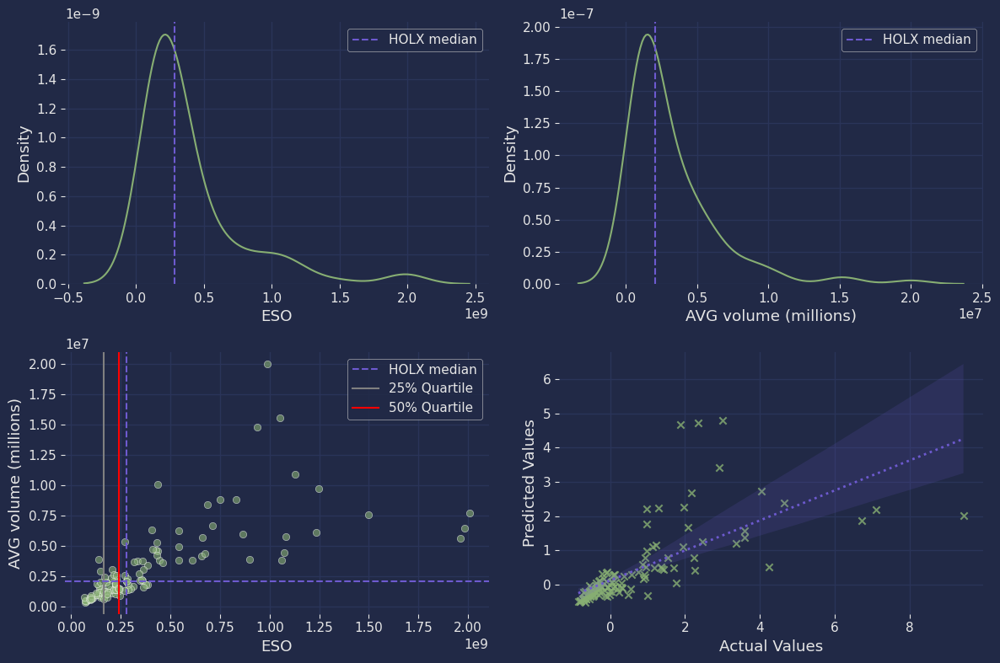

HOLX Median ESO: 280000000.0
HOLX Median volume (y): 2082085.71


In [129]:
HOLX_eso = hypno.iloc[53:56, 9].median()
HOLX_eso_avg = round(hypno.iloc[53:56, 9].median(), 2)

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
q1rt = np.quantile(hypno['ESO'], .25)
q2rt = np.quantile(hypno['ESO'], .5)


sns.kdeplot(hypno['ESO'], color='#87ae73', ax=axs[0, 0])
axs[0, 0].axvline(x=HOLX_eso, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 0].legend()
sns.kdeplot(hypno['AVG volume (millions)'], color='#87ae73', ax=axs[0, 1])
axs[0, 1].axvline(x=HOLX_v, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 1].legend()
sns.scatterplot(data=hypno, x='ESO', y='AVG volume (millions)', color='#87ae73', ax=axs[1, 0], alpha=0.6)
axs[1, 0].axvline(x=HOLX_eso, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[1, 0].axvline(x=q1rt, c='grey', label='25% Quartile')
axs[1, 0].axvline(x=q2rt, c='red', label='50% Quartile')
axs[1, 0].axhline(y=HOLX_v, c='#6d5acf', linestyle='dashed')
axs[1, 0].legend()
sns.regplot(data=H2_compare, x='true', y='predicted', color='#87ae73', marker="x",
            line_kws={'color': '#6d5acf', 'lw': 2, 'ls': ':'}, ax=axs[1, 1])
axs[1, 1].set_xlabel('Actual Values')
axs[1, 1].set_ylabel('Predicted Values')

plt.tight_layout()
plt.show()
print(f'HOLX Median ESO: {HOLX_eso_avg}')
print(f'HOLX Median volume (y): {HOLX_v_avg}')

* Shares trading volume, given HOLX's ESO, is off by as much as 17982.97% (2014) with a median of 11609.61% (2015). This indicates ESO mismanagement or underutilization in terms of capitalizing on investors' perceived value. Note that this effect is likely overdrawn, as the regression plot has linear inconsistencies.
* The KDE plots depct HOLX with a median for both variables in the center of the sample's distribution. Their potential is slighty positive in comparison to other companies within their ESO range, shown in the scatter plot directly on the 50% quartile. Their ESO figure isn't acting as a limitation on volume. The higher volume holding companies are positioned to do so from having higher ESO quantity. HOLX would require gains to place within the 75% quartile for an improvement in volume.
* Median ESO balance from 2.8x10^8 into 3.2x10^8 - 1.0x10^9 area, could realistically reign a median Volume return of up to 1.2x10^7.

In [130]:
hypno['ESO'].median()

240186585.366

In [131]:
hypno.iloc[53:56, 9].std()

9702052.750730742

In [132]:
ESOX = pd.DataFrame({'Year': [2013, 2014, 2015, 2013, 2014, 2015], 'Company':['HOLX', 'HOLX', 'HOLX', 'All', 'All', 'All'],
                     'Estimated Shares Outstanding':[hypno.iloc[53, 9], hypno.iloc[54, 9], hypno.iloc[55, 9],
                    hypno.query('year == 2013')['ESO'].median(), hypno.query('year == 2014')['ESO'].median(), hypno.query('year == 2015')['ESO'].median()],
                    'Earnings Per Share':[new_metrics.query('`Ticker Symbol` == "HOLX"')['Earnings Per Share'].iloc[0], new_metrics.query('`Ticker Symbol` == "HOLX"')['Earnings Per Share'].iloc[1],
                                          new_metrics.query('`Ticker Symbol` == "HOLX"')['Earnings Per Share'].iloc[2], new_metrics.query('`For Year` == 2013')['Earnings Per Share'].median(),
                                          new_metrics.query('`For Year` == 2014')['Earnings Per Share'].median(), new_metrics.query('`For Year` == 2015')['Earnings Per Share'].median()]})
ESOX

,Year,Company,Estimated Shares Outstanding,Earnings Per Share
0,2013,HOLX,2.690e+08,-4.360
1,2014,HOLX,2.883e+08,0.060
2,2015,HOLX,2.800e+08,0.470
3,2013,All,2.307e+08,2.855
4,2014,All,2.399e+08,3.055
5,2015,All,2.405e+08,2.865


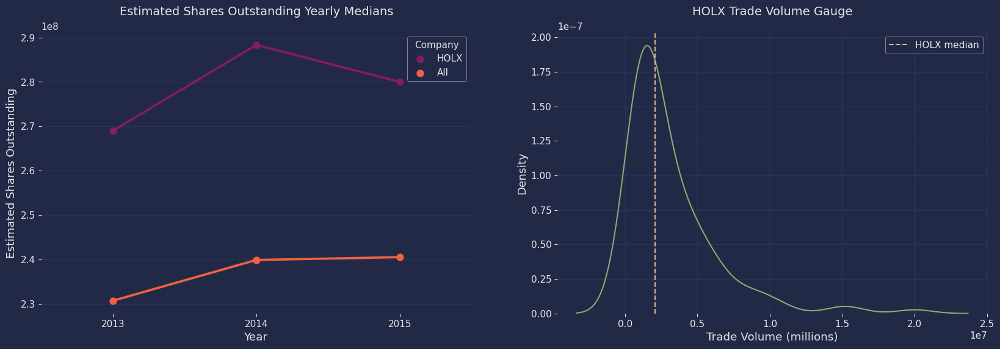

In [133]:
HOLX_v = hypno.iloc[53:56, 10].median()

fig, axs = plt.subplots(1,2,figsize=(20,6))
sns.pointplot(data=ESOX, x="Year", y="Estimated Shares Outstanding", hue='Company', palette='rocket', ax=axs[0])
axs[0].set_title('Estimated Shares Outstanding Yearly Medians')
sns.kdeplot(hypno['AVG volume (millions)'], color='#87ae73', ax=axs[1])
axs[1].set_title('HOLX Trade Volume Gauge')
axs[1].set_xlabel('Trade Volume (millions)')
axs[1].axvline(x=HOLX_v, c='tan', label='HOLX median', linestyle='dashed')
axs[1].legend()
plt.show()

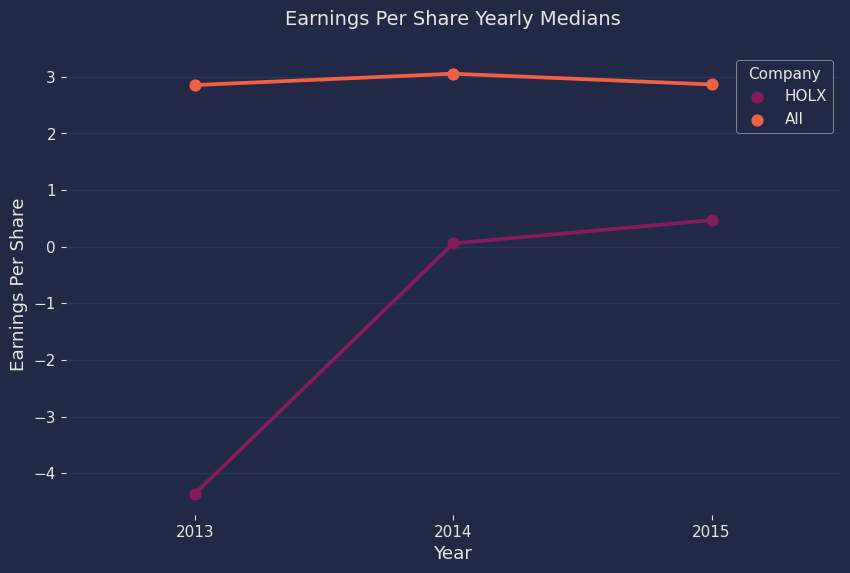

In [134]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
sns.pointplot(data=ESOX, x="Year", y="Earnings Per Share", hue='Company', palette='rocket', ax=ax)
plt.title('Earnings Per Share Yearly Medians')
plt.show()

In [135]:
hypno.iloc[53:55]

,symbol,year,CR,QR,CRC,NCFI,NCFO,NI,TA,ESO,AVG volume (millions)
53,HOLX,2013,149.0,123.0,76.0,1.880e+07,4.938e+08,-1.173e+09,9.001e+09,2.690e+08,5.352e+06
54,HOLX,2014,253.0,199.0,120.0,-6.700e+07,5.084e+08,1.730e+07,8.415e+09,2.883e+08,1.380e+06


### Net Cash Flows Operating (x) and Net Income (y)
alpha = 0.05 | Two-tailed test
#### Test 3
* null: β = 0
* alternate: B != 0
#### Results
* A significance was detected in the relationship between X and Y, null hypothesis is rejected. Since a 0 isn't clarified within the confidence interval, an approximately linear relationship is established.

In [136]:
statistics = ['y-int:', 'slope:', 'std err:', 't:', 'p-value:', 'confidence interval:']
for i, item in enumerate(model_params['ncfo_ni']):
    if i < 5:
        print(statistics[i], [round(item, 3)])
    else:
        CI = f'[{round(item[0], 3)}, {round(item[1], 3)}]'
        print(statistics[i], CI)

y-int: [0.0]
slope: [0.904]
std err: [0.048]
t: [18.846]
p-value: [0.0]
confidence interval: [0.81, 0.998]


In [137]:
X_H3 = hypno_ncfo
X_H3 = sm.add_constant(X_H3)
trueY_H3 = hypno_ni
Y_pred_H3 = ncfoXni_model.predict(X_H3)

H3_diff = (Y_pred_H3-trueY_H3)/trueY_H3*100

H3_compare = pd.DataFrame({'true':trueY_H3, 'predicted':Y_pred_H3, 'diff %':H3_diff})
print(f'Average diff: {round(H3_compare['diff %'].mean(), 2)}%')
H3_compare

Average diff: -42.59%


,true,predicted,diff %
0,-0.324,-0.345,6.248
1,-0.364,-0.244,-32.878
2,-0.465,0.121,-126.014
3,-0.359,-0.378,5.297
4,-0.349,-0.364,4.298
...,...,...,...
116,-0.348,-0.400,14.853
117,-0.347,-0.393,13.045
118,-0.094,-0.284,200.806
119,1.423,-0.325,-122.879


In [138]:
to_unscale = np.array([[-.366, -.715],[-.364, -.425],[-.326, -.397]])
df_unscaled = SS_ni.inverse_transform(to_unscale)

diff_2013 = round(df_unscaled[0, 0]-df_unscaled[0, 1], 2)
diff_2014 = round(df_unscaled[1, 0]-df_unscaled[1, 1], 2)
diff_2015 = round(df_unscaled[2, 0]-df_unscaled[2, 1], 2)
diff_2013P = round((df_unscaled[0, 0]-df_unscaled[0, 1])/df_unscaled[0, 1]*100, 2)
diff_2014P = round((df_unscaled[1, 0]-df_unscaled[1, 1])/df_unscaled[1, 1]*100, 2)
diff_2015P = round((df_unscaled[2, 0]-df_unscaled[2, 1])/df_unscaled[2, 1]*100, 2)

print(f'Volume outputted by LR model:\n2013: {df_unscaled[0, 0]}\n2014: {df_unscaled[1, 0]}\n2015: {df_unscaled[2, 0]}')
print(f'\nTrue volume:\n2013: {df_unscaled[0, 1]}\n2014: {df_unscaled[1, 1]}\n2015: {df_unscaled[2, 1]}')
print(f'\nVolume diff:\n2013: {diff_2013}\n2014: {diff_2014}\n2015: {diff_2015}')
print(f'\nVolume diff %:\n2013: {diff_2013P}\n2014: {diff_2014P}\n2015: {diff_2015P}')

Volume outputted by LR model:
2013: 264420090.7312348
2014: 272534943.84552073
2015: 426717153.01694965

True volume:
2013: -1151621777.7116282
2014: 25031923.859805346
2015: 138639867.45980573

Volume diff:
2013: 1416041868.44
2014: 247503019.99
2015: 288077285.56

Volume diff %:
2013: -122.96
2014: 988.75
2015: 207.79


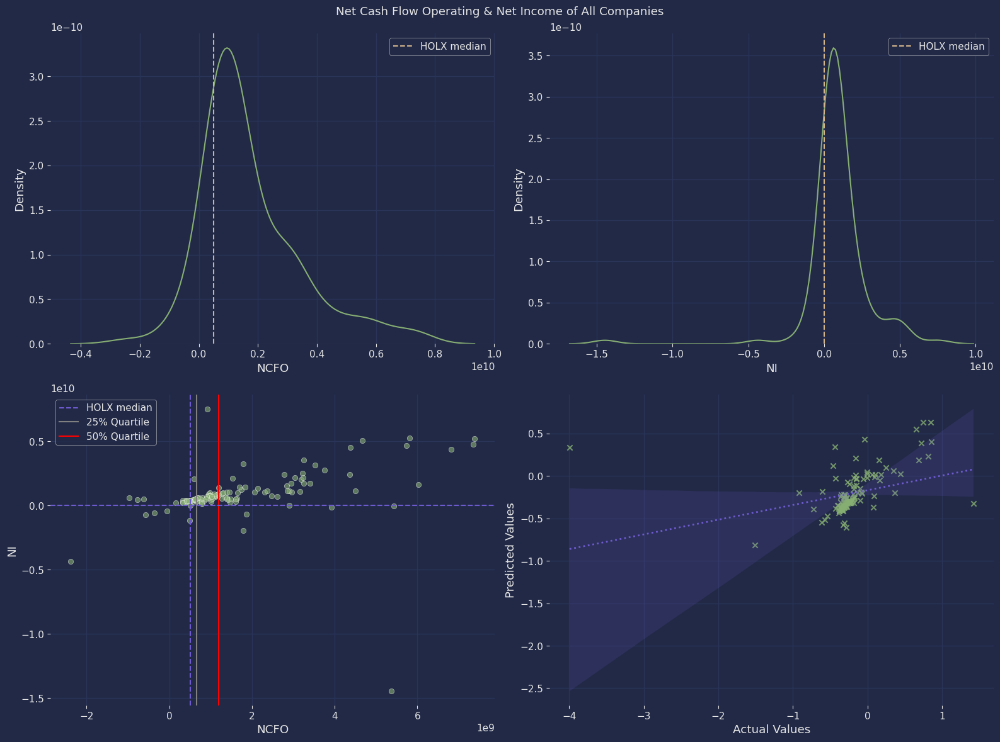

HOLX Median NCFO: 508400000.0
HOLX Median NI: 17300000.0


In [139]:
HOLX_ncfo = hypno.iloc[53:56, 6].median()
HOLX_ni = hypno.iloc[53:56, 7].median()
HOLX_ncfo_avg = hypno.iloc[53:56, 6].median()
HOLX_ni_avg = hypno.iloc[53:56, 7].median()

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
q1rt = np.quantile(hypno['NCFO'], .25)
q2rt = np.quantile(hypno['NCFO'], .5)

sns.kdeplot(hypno['NCFO'], color='#87ae73', ax=axs[0, 0])
axs[0, 0].axvline(x=HOLX_ncfo, c='tan', label='HOLX median', linestyle='dashed')
axs[0, 0].legend()
sns.kdeplot(hypno['NI'], color='#87ae73', ax=axs[0, 1])
axs[0, 1].axvline(x=HOLX_ni, c='tan', label='HOLX median', linestyle='dashed')
axs[0, 1].legend()
sns.scatterplot(data=hypno, x='NCFO', y='NI', color='#87ae73', ax=axs[1, 0], alpha=0.6)
axs[1, 0].axvline(x=HOLX_ncfo, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[1, 0].axvline(x=q1rt, c='grey', label='25% Quartile')
axs[1, 0].axvline(x=q2rt, c='red', label='50% Quartile')
axs[1, 0].axhline(y=HOLX_ni, c='#6d5acf', linestyle='dashed')
axs[1, 0].legend()
sns.regplot(data=H3_compare, x='true', y='predicted', color='#87ae73', marker="x",
            line_kws={'color': '#6d5acf', 'lw': 2, 'ls': ':'}, ax=axs[1, 1])
axs[1, 1].set_xlabel('Actual Values')
axs[1, 1].set_ylabel('Predicted Values')

plt.suptitle('Net Cash Flow Operating & Net Income of All Companies')
plt.tight_layout()
plt.show()
print(f'HOLX Median NCFO: {HOLX_ncfo_avg}')
print(f'HOLX Median NI: {HOLX_ni_avg}')

* Net income, given HOLX's NCFO, is off by as much as 1417.93% (2014) with a median of 219.8% (2015). This indicates NCFO mismanagement or underutilization in terms of realizing Net Income, though less severe than in volume from NCFO.
* The KDE plots depct HOLX with a median for both variables in the bottom-half of the sample's distribution. Their potential is slighty negative in comparison to other companies within their ESO range, shown in the scatter plot directly on the 25% quartile. Their NCFO figure is acting as a limitation on NI. The higher NI holding companies are positioned to do so from having a higher NCFO figure and NCFO:NI ratio. HOLX would require NFCO optimization to advance into the 50% quartile for an improvement in NI - at a minimum. KDE plots are evidence of transactions resulting in no y (NI) gains, unlike previous KDE plots.
* Median NCFO balance from 5.1x10^8 into 2.5x10^9 area could realistically reign a median NI return of up to 5.0x10^9.

### Net Cash Flows Investing (x) and Total Assets (y)
alpha = 0.05 | Two-tailed test
#### Test 4
* null: β = 0
* alternate: B != 0
#### Results
* A significance was detected in the relationship between X and Y, null hypothesis is rejected. Since a 0 isn't clarified within the confidence interval, an approximately linear relationship is established.

In [140]:
statistics = ['y-int:', 'slope:', 'std err:', 't:', 'p-value:', 'confidence interval:']
for i, item in enumerate(model_params['ncfi_ta']):
    if i < 5:
        print(statistics[i], [round(item, 3)])
    else:
        CI = f'[{round(item[0], 3)}, {round(item[1], 3)}]'
        print(statistics[i], CI)

y-int: [0.005]
slope: [-0.859]
std err: [0.079]
t: [-10.805]
p-value: [0.0]
confidence interval: [-1.015, -0.703]


In [141]:
X_H4 = hypno_ncfi
X_H4 = sm.add_constant(X_H4)
trueY_H4 = hypno_ta
Y_pred_H4 = ncfiXta_model.predict(X_H4)

H4_diff = (Y_pred_H4-trueY_H4)/trueY_H4*100

H4_compare = pd.DataFrame({'true':trueY_H4, 'predicted':Y_pred_H4, 'diff %':H4_diff})
print(f'Average diff: {round(H4_compare['diff %'].mean(), 2)}%')
H4_compare

Average diff: -49.59%


,true,predicted,diff %
0,-0.187,-0.413,120.939
1,-0.126,-0.318,153.505
2,0.025,0.161,541.943
3,-0.561,-0.332,-40.854
4,-0.536,-0.169,-68.549
...,...,...,...
116,-0.517,-0.375,-27.552
117,-0.521,-0.366,-29.788
118,-0.236,-0.386,63.445
119,0.816,-1.095,-234.169


In [142]:
to_unscale = np.array([[-.441, -.426],[-.423, -.440],[-.419, -.458]])
df_unscaled = SS_ta.inverse_transform(to_unscale)

diff_2013 = round(df_unscaled[0, 0]-df_unscaled[0, 1], 2)
diff_2014 = round(df_unscaled[1, 0]-df_unscaled[1, 1], 2)
diff_2015 = round(df_unscaled[2, 0]-df_unscaled[2, 1], 2)
diff_2013P = round((df_unscaled[0, 0]-df_unscaled[0, 1])/df_unscaled[0, 1]*100, 2)
diff_2014P = round((df_unscaled[1, 0]-df_unscaled[1, 1])/df_unscaled[1, 1]*100, 2)
diff_2015P = round((df_unscaled[2, 0]-df_unscaled[2, 1])/df_unscaled[2, 1]*100, 2)

print(f'Volume outputted by LR model:\n2013: {df_unscaled[0, 0]}\n2014: {df_unscaled[1, 0]}\n2015: {df_unscaled[2, 0]}')
print(f'\nTrue volume:\n2013: {df_unscaled[0, 1]}\n2014: {df_unscaled[1, 1]}\n2015: {df_unscaled[2, 1]}')
print(f'\nVolume diff:\n2013: {diff_2013}\n2014: {diff_2014}\n2015: {diff_2015}')
print(f'\nVolume diff %:\n2013: {diff_2013P}\n2014: {diff_2014P}\n2015: {diff_2015P}')

Volume outputted by LR model:
2013: 8075303050.86721
2014: 8843285559.619114
2015: 9013948339.341759

True volume:
2013: 8715288474.82713
2014: 8117968745.797871
2015: 7349986237.045971

Volume diff:
2013: -639985423.96
2014: 725316813.82
2015: 1663962102.3

Volume diff %:
2013: -7.34
2014: 8.93
2015: 22.64


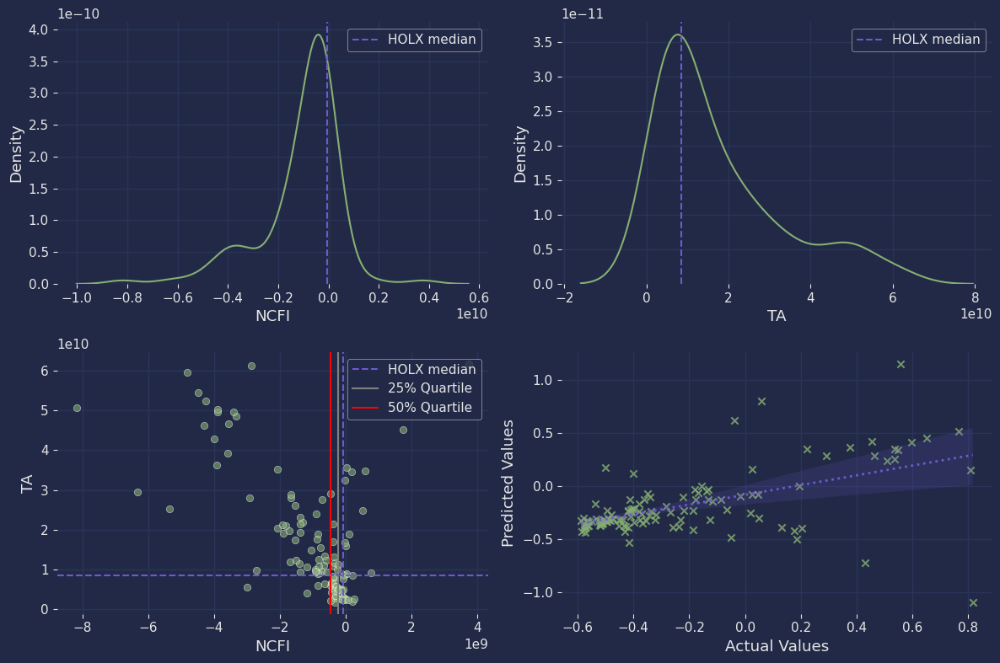

HOLX Median NCFI: -67000000.0
HOLX Median TA: 8414700000.0


In [143]:
HOLX_ncfi = hypno.iloc[53:56, 5].median()
HOLX_ta = hypno.iloc[53:56, 8].median()
HOLX_ncfi_avg = round(hypno.iloc[53:56, 5].median(), 2)
HOLX_ta_avg = round(hypno.iloc[53:56, 8].median(), 2)
q1rt = np.quantile(hypno['NCFI'], .75)
q2rt = np.quantile(hypno['NCFI'], .5)


fig, axs = plt.subplots(2, 2, figsize=(12, 8))

sns.kdeplot(hypno['NCFI'], color='#87ae73', ax=axs[0, 0])
axs[0, 0].axvline(x=HOLX_ncfi, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 0].legend()
sns.kdeplot(hypno['TA'], color='#87ae73', ax=axs[0, 1])
axs[0, 1].axvline(x=HOLX_ta, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 1].legend()
sns.scatterplot(data=hypno, x='NCFI', y='TA', color='#87ae73', ax=axs[1, 0], alpha=0.6)
axs[1, 0].axvline(x=HOLX_ncfi, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[1, 0].axvline(x=q1rt, c='grey', label='25% Quartile')
axs[1, 0].axvline(x=q2rt, c='red', label='50% Quartile')
axs[1, 0].axhline(y=HOLX_ta, c='#6d5acf', linestyle='dashed')
axs[1, 0].legend()
sns.regplot(data=H4_compare, x='true', y='predicted', color='#87ae73', marker="x",
            line_kws={'color': '#6d5acf', 'lw': 2, 'ls': ':'}, ax=axs[1, 1])
axs[1, 1].set_xlabel('Actual Values')
axs[1, 1].set_ylabel('Predicted Values')

plt.tight_layout()
plt.show()
print(f'HOLX Median NCFI: {HOLX_ncfi_avg}')
print(f'HOLX Median TA: {HOLX_ta_avg}')

* Total Assets, given HOLX's NCFI, is over by as much as 22% (2015) with a median of 8.93% (2014). This does indicates slightly positive NCFI management in terms of realizing Net Income.
* The KDE plots depct HOLX with a median for both variables in the bottom-half of the sample's distribution. Their potential is lackluster in comparison to other companies within their NCFI range, shown in the scatter plot above the overall NCFI median. Their NCFI figure is acting as a limitation on TA. The higher NI holding companies are positioned to do so from having a higher NCFI figure and NCFI:TA ratio. HOLX would require NFCI optimization to advance above the overall median for an improvement in TA - at a minimum. KDE plots are evidence of transactions resulting in no y (TA) gains, unlike the KDE plots with volume as y.
* Median NCFI balance from -6.7x10^7 into >0 area could realistically reign a Median TA return of up to 5.0x10^10.

### Current Ratio (x) and Quick Ratio (y)
alpha = 0.05 | Two-tailed test
#### Test 5
* null: β = 0
* alternate: B != 0
#### Results
* A significance was detected in the relationship between X and Y, null hypothesis is rejected. Since a 0 isn't clarified within the confidence interval, an approximately linear relationship is established.

In [144]:
statistics = ['y-int:', 'slope:', 'std err:', 't:', 'p-value:', 'confidence interval:']
for i, item in enumerate(model_params['cr_qr']):
    if i < 5:
        print(statistics[i], [round(item, 3)])
    else:
        CI = f'[{round(item[0], 3)}, {round(item[1], 3)}]'
        print(statistics[i], CI)

y-int: [0.015]
slope: [0.988]
std err: [0.02]
t: [49.514]
p-value: [0.0]
confidence interval: [0.949, 1.028]


In [145]:
X_H5 = hypno_cr
X_H5 = sm.add_constant(X_H5)
trueY_H5 = hypno_qr
Y_pred_H5 = crXqr_model.predict(X_H5)

H5_diff = (Y_pred_H5-trueY_H5)/trueY_H5*100

H5_compare = pd.DataFrame({'true':trueY_H5, 'predicted':Y_pred_H5, 'diff %':H5_diff})
print(f'Average diff: {round(H5_compare['diff %'].mean(), 2)}%')
H5_compare

Average diff: 50.3%


,true,predicted,diff %
0,-0.828,-0.680,-17.871
1,-0.844,-0.680,-19.505
2,-0.836,-0.703,-15.878
3,2.037,1.629,-20.038
4,1.927,1.526,-20.803
...,...,...,...
116,0.222,0.357,60.400
117,0.357,0.474,32.987
118,1.902,1.503,-20.992
119,0.508,0.200,-60.695


In [146]:
to_unscale = np.array([[-.287, -.219],[.507, .415],[-.401, -.377]])
df_unscaled = SS_qr.inverse_transform(to_unscale)

diff_2013 = round(df_unscaled[0, 0]-df_unscaled[0, 1], 2)
diff_2014 = round(df_unscaled[1, 0]-df_unscaled[1, 1], 2)
diff_2015 = round(df_unscaled[2, 0]-df_unscaled[2, 1], 2)
diff_2013P = round((df_unscaled[0, 0]-df_unscaled[0, 1])/df_unscaled[0, 1]*100, 2)
diff_2014P = round((df_unscaled[1, 0]-df_unscaled[1, 1])/df_unscaled[1, 1]*100, 2)
diff_2015P = round((df_unscaled[2, 0]-df_unscaled[2, 1])/df_unscaled[2, 1]*100, 2)

print(f'Volume outputted by LR model:\n2013: {df_unscaled[0, 0]}\n2014: {df_unscaled[1, 0]}\n2015: {df_unscaled[2, 0]}')
print(f'\nTrue volume:\n2013: {df_unscaled[0, 1]}\n2014: {df_unscaled[1, 1]}\n2015: {df_unscaled[2, 1]}')
print(f'\nVolume diff:\n2013: {diff_2013}\n2014: {diff_2014}\n2015: {diff_2015}')
print(f'\nVolume diff %:\n2013: {diff_2013P}\n2014: {diff_2014P}\n2015: {diff_2015P}')

Volume outputted by LR model:
2013: 114.35740022098109
2014: 208.88825595223346
2015: 100.78495997745114

True volume:
2013: 122.45324176975333
2014: 197.9350585627181
2015: 103.64231581819429

Volume diff:
2013: -8.1
2014: 10.95
2015: -2.86

Volume diff %:
2013: -6.61
2014: 5.53
2015: -2.76


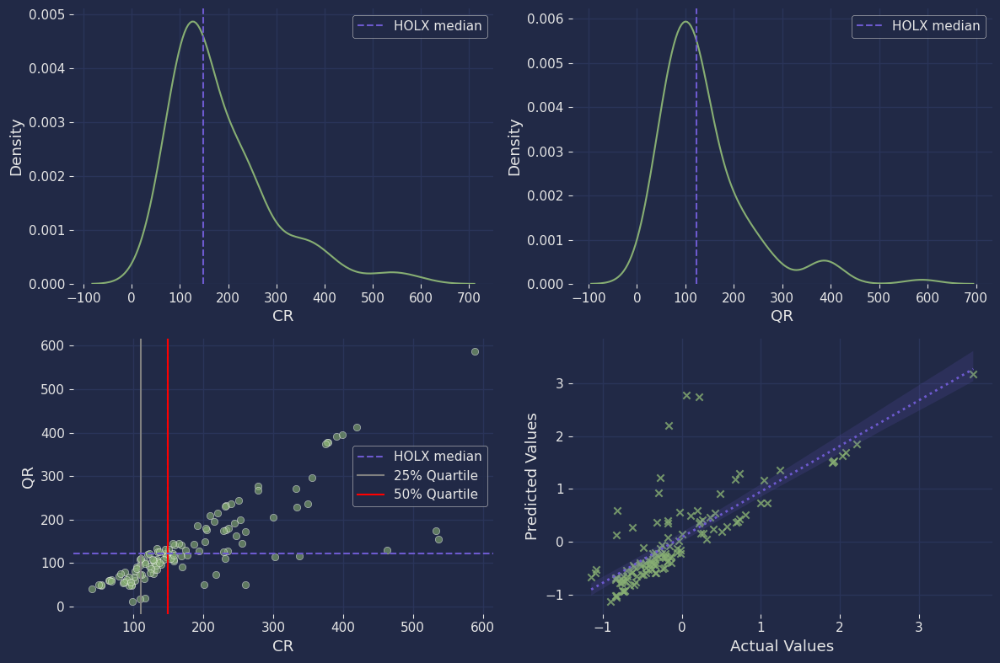

HOLX Median CR: 149.0
HOLX Median QR: 123.0


In [147]:
HOLX_cr = hypno.iloc[53:56, 2].median()
HOLX_qr = hypno.iloc[53:56, 3].median()
HOLX_cr_avg = round(hypno.iloc[53:56, 2].median(), 2)
HOLX_qr_avg = round(hypno.iloc[53:56, 3].median(), 2)

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
q1rt = np.quantile(hypno['CR'], .25)
q2rt = np.quantile(hypno['CR'], .5)

sns.kdeplot(hypno['CR'], color='#87ae73', ax=axs[0, 0])
axs[0, 0].axvline(x=HOLX_cr, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 0].legend()
sns.kdeplot(hypno['QR'], color='#87ae73', ax=axs[0, 1])
axs[0, 1].axvline(x=HOLX_qr, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 1].legend()
sns.scatterplot(data=hypno, x='CR', y='QR', color='#87ae73', ax=axs[1, 0], alpha=0.6)
axs[1, 0].axvline(x=HOLX_cr, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[1, 0].axvline(x=q1rt, c='grey', label='25% Quartile')
axs[1, 0].axvline(x=q2rt, c='red', label='50% Quartile')
axs[1, 0].axhline(y=HOLX_qr, c='#6d5acf', linestyle='dashed')
axs[1, 0].legend()
sns.regplot(data=H5_compare, x='true', y='predicted', color='#87ae73', marker="x",
            line_kws={'color': '#6d5acf', 'lw': 2, 'ls': ':'}, ax=axs[1, 1])
axs[1, 1].set_xlabel('Actual Values')
axs[1, 1].set_ylabel('Predicted Values')

plt.tight_layout()
plt.show()
print(f'HOLX Median CR: {HOLX_cr_avg}')
print(f'HOLX Median QR: {HOLX_qr_avg}')

* Quick Ratio, given HOLX's Current Ratio (underneath red line), is off by as much as -6.63% (2013) with a median of -2.76% (2015). This does indicate slight CR mismanagement or underutilization in terms of surmassing QR.
* The KDE plots depct HOLX with a median for both variables in the top-half of the sample's distribution. Their potential exceeds similar companies, shown in the scatter plot in the 50% quartile. The higher QR holding companies are positioned to do so from having a higher CR figure exclusively. HOLX would require further expanding upon their CR contributing balances, reducing inventory, reducing current liabilities, or all 3, to advance into the 75% quartile for an improvement in QR. KDE plots are evidence of transactions resulting in a seemingly 1:1 ratio.
* AVG CR balance from 149 into >175 area would realistically reign AVG QR balance of up to 150.

In [148]:
new_metrics.query('`Ticker Symbol` == "HOLX"')

,Ticker Symbol,Period Ending,Accounts Payable,Accounts Receivable,Add'l income/expense items,After Tax ROE,Capital Expenditures,Capital Surplus,Cash Ratio,Cash and Cash Equivalents,Changes in Inventories,Common Stocks,Cost of Revenue,Current Ratio,Deferred Asset Charges,Deferred Liability Charges,Depreciation,Earnings Before Interest and Tax,Earnings Before Tax,Effect of Exchange Rate,Equity Earnings/Loss Unconsolidated Subsidiary,Fixed Assets,Goodwill,Gross Margin,Gross Profit,Income Tax,Intangible Assets,Interest Expense,Inventory,Investments,Liabilities,Long-Term Debt,Long-Term Investments,Minority Interest,Misc. Stocks,Net Borrowings,Net Cash Flow,Net Cash Flow-Operating,Net Cash Flows-Financing,Net Cash Flows-Investing,Net Income,Net Income Adjustments,Net Income Applicable to Common Shareholders,Net Income-Cont. Operations,Net Receivables,Non-Recurring Items,Operating Income,Operating Margin,Other Assets,Other Current Assets,Other Current Liabilities,Other Equity,Other Financing Activities,Other Investing Activities,Other Liabilities,Other Operating Activities,Other Operating Items,Pre-Tax Margin,Pre-Tax ROE,Profit Margin,Quick Ratio,Research and Development,Retained Earnings,Sale and Purchase of Stock,"Sales, General and Admin.",Short-Term Debt / Current Portion of Long-Term Debt,Short-Term Investments,Total Assets,Total Current Assets,Total Current Liabilities,Total Equity,Total Liabilities,Total Liabilities & Equity,Total Revenue,Treasury Stock,For Year,Earnings Per Share,Estimated Shares Outstanding
561,HOLX,2013,3.923e+08,4.100e+06,4.830e+07,60.0,-9.010e+07,5.536e+09,76.0,8.294e+08,2.520e+07,2.700e+06,1.331e+09,149.0,0.0,1.561e+09,5.160e+08,-9.118e+08,-1.193e+09,-1.700e+06,0.0,4.915e+08,2.814e+09,47.0,1.161e+09,-2.010e+07,3.907e+09,2.811e+08,2.894e+08,-1.600e+06,9.200e+06,4.242e+09,0.0,0.0,0.0,-2.650e+08,2.621e+08,4.938e+08,-2.488e+08,1.880e+07,-1.173e+09,1.086e+09,-1.173e+09,-1.182e+09,4.093e+08,1.150e+09,-9.062e+08,36.0,1.639e+08,9.610e+07,1.323e+08,2.040e+07,-5.690e+07,1.105e+08,1.680e+08,2.600e+07,1.126e+08,48.0,61.0,47.0,123.0,1.976e+08,-3.616e+09,7.510e+07,6.611e+08,5.638e+08,0.0,9.001e+09,1.624e+09,1.088e+09,1.942e+09,7.059e+09,9.001e+09,2.492e+09,-1.500e+06,2013.0,-4.36,2.690e+08
562,HOLX,2014,3.542e+08,7.900e+06,-1.100e+07,1.0,-8.020e+07,5.658e+09,120.0,7.416e+08,-4.470e+07,2.800e+06,1.285e+09,253.0,0.0,1.396e+09,5.232e+08,2.687e+08,4.810e+07,-2.700e+06,0.0,4.619e+08,2.811e+09,49.0,1.246e+09,3.080e+07,3.434e+09,2.206e+08,3.306e+08,-7.300e+06,4.160e+07,4.153e+09,0.0,0.0,0.0,-5.950e+08,-8.640e+07,5.084e+08,-5.251e+08,-6.700e+07,1.730e+07,-7.660e+07,1.730e+07,9.900e+06,4.354e+08,5.730e+07,2.797e+08,11.0,1.426e+08,5.820e+07,1.509e+08,2.600e+06,-1.480e+07,2.050e+07,1.834e+08,3.970e+07,1.138e+08,2.0,2.0,1.0,199.0,2.032e+08,-3.601e+09,8.140e+07,5.915e+08,1.145e+08,0.0,8.415e+09,1.566e+09,6.196e+08,2.063e+09,6.352e+09,8.415e+09,2.531e+09,0.000e+00,2014.0,0.06,2.883e+08
563,HOLX,2015,3.891e+08,-3.030e+07,-7.240e+07,6.0,-8.940e+07,5.560e+09,52.0,4.927e+08,4.390e+07,2.800e+06,1.272e+09,134.0,0.0,1.198e+09,4.914e+08,3.827e+08,1.772e+08,-8.100e+06,0.0,4.571e+08,2.808e+09,53.0,1.433e+09,4.560e+07,3.023e+09,2.055e+08,2.831e+08,1.000e+07,7.850e+07,3.221e+09,0.0,0.0,0.0,-9.686e+08,-2.448e+08,7.861e+08,-9.367e+08,-8.610e+07,1.316e+08,6.460e+07,1.316e+08,6.890e+07,4.351e+08,2.850e+07,4.551e+08,17.0,8.820e+07,5.490e+07,1.631e+08,-1.450e+07,-1.290e+07,-6.700e+06,2.009e+08,6.400e+06,1.102e+08,7.0,9.0,5.0,104.0,2.149e+08,-3.469e+09,7.000e+07,6.240e+08,3.912e+08,0.0,7.642e+09,1.266e+09,9.434e+08,2.079e+09,5.563e+09,7.642e+09,2.705e+09,0.000e+00,2015.0,0.47,2.800e+08


In [150]:
slicer = new_metrics.query('`Ticker Symbol` == "HOLX"')
CL = pd.DataFrame({'Year': [2013, 2014, 2015, 2013, 2014, 2015], 'Company':['HOLX', 'HOLX', 'HOLX', 'All', 'All', 'All'],
                     'Current Liabilities':[slicer.iloc[0, -9], slicer.iloc[1, -9], slicer.iloc[2, -9],
                    new_metrics.query('`For Year` == 2013')['Total Current Liabilities'].median(), new_metrics.query('`For Year` == 2014')['Total Current Liabilities'].median(), new_metrics.query('`For Year` == 2015')['Total Current Liabilities'].median()]})
CL['TA'] = [slicer.iloc[0, -10]-slicer.iloc[0, 29], slicer.iloc[1, -10]-slicer.iloc[1, 29], slicer.iloc[2, -10]-slicer.iloc[2, 29],
           new_metrics.query('`For Year` == 2013')['Total Current Liabilities'].median()-new_metrics.query('`For Year` == 2013')['Inventory'].median(),
           new_metrics.query('`For Year` == 2014')['Total Current Liabilities'].median()-new_metrics.query('`For Year` == 2013')['Inventory'].median(),
           new_metrics.query('`For Year` == 2015')['Total Current Liabilities'].median()-new_metrics.query('`For Year` == 2013')['Inventory'].median(),]
CL

,Year,Company,Current Liabilities,TA
0,2013,HOLX,1.088e+09,1.626e+09
1,2014,HOLX,6.196e+08,1.573e+09
2,2015,HOLX,9.434e+08,1.256e+09
3,2013,All,1.584e+09,1.222e+09
4,2014,All,1.930e+09,1.568e+09
5,2015,All,1.802e+09,1.440e+09


In [151]:
slicer = new_metrics.query('`Ticker Symbol` == "HOLX"')
CL = pd.DataFrame({'Year': [2013, 2014, 2015, 2013, 2014, 2015], 'Company':['HOLX', 'HOLX', 'HOLX', 'All', 'All', 'All'],
                     'Current Liabilities':[slicer.iloc[0, -9], slicer.iloc[1, -9], slicer.iloc[2, -9],
                    new_metrics.query('`For Year` == 2013')['Total Current Liabilities'].median(), new_metrics.query('`For Year` == 2014')['Total Current Liabilities'].median(), new_metrics.query('`For Year` == 2015')['Total Current Liabilities'].median()]})
CL['TA'] = [slicer.iloc[0, -18], slicer.iloc[1, -18], slicer.iloc[2, -18],
           new_metrics.query('`For Year` == 2013')['Quick Ratio'].median(),
           new_metrics.query('`For Year` == 2014')['Quick Ratio'].median(),
           new_metrics.query('`For Year` == 2015')['Quick Ratio'].median(),]
CL

,Year,Company,Current Liabilities,TA
0,2013,HOLX,1.088e+09,123.0
1,2014,HOLX,6.196e+08,199.0
2,2015,HOLX,9.434e+08,104.0
3,2013,All,1.584e+09,120.0
4,2014,All,1.930e+09,112.5
5,2015,All,1.802e+09,113.0


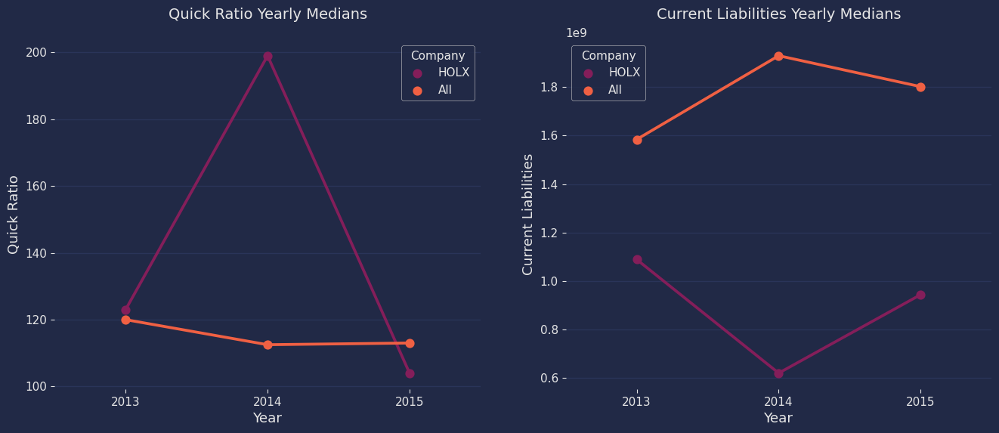

In [152]:
fig, ax = plt.subplots(1,2,figsize=(16,6))
sns.pointplot(data=CL, x="Year", y="Current Liabilities", hue='Company', palette='rocket', ax=ax[1])
ax[1].set_title('Current Liabilities Yearly Medians')
sns.pointplot(data=CL, x="Year", y="TA", hue='Company', palette='rocket', ax=ax[0])
ax[0].set_title('Quick Ratio Yearly Medians')
ax[0].set_ylabel('Quick Ratio')
plt.show()

### Cash Ratio (x) and Quick Ratio (y)
alpha = 0.05 | Two-tailed test
#### Test 6
* null: β = 0
* alternate: B != 0
#### Results
* A significance was detected in the relationship between X and Y, null hypothesis is rejected. Since a 0 isn't clarified within the confidence interval, an approximately linear relationship is established.

In [153]:
statistics = ['y-int:', 'slope:', 'std err:', 't:', 'p-value:', 'confidence interval:']
for i, item in enumerate(model_params['crc_qr']):
    if i < 5:
        print(statistics[i], [round(item, 3)])
    else:
        CI = f'[{round(item[0], 3)}, {round(item[1], 3)}]'
        print(statistics[i], CI)

y-int: [-0.0]
slope: [0.935]
std err: [0.013]
t: [70.464]
p-value: [0.0]
confidence interval: [0.909, 0.961]


In [154]:
X_H6 = hypno_crc
X_H6 = sm.add_constant(X_H6)
trueY_H6 = hypno_qr
Y_pred_H6 = crcXqr_model.predict(X_H6)

H6_diff = (Y_pred_H6-trueY_H6)/trueY_H6*100

H6_compare = pd.DataFrame({'true':trueY_H6, 'predicted':Y_pred_H6, 'diff %':H6_diff})
print(f'Average diff: {round(H6_compare['diff %'].mean(), 2)}%')
H6_compare

Average diff: 0.63%


,true,predicted,diff %
0,-0.828,-0.624,-24.584
1,-0.844,-0.606,-28.247
2,-0.836,-0.606,-27.526
3,2.037,1.641,-19.428
4,1.927,1.376,-28.605
...,...,...,...
116,0.222,-0.030,-113.695
117,0.357,0.061,-82.934
118,1.902,1.623,-14.696
119,0.508,0.919,81.009


In [155]:
to_unscale = np.array([[-.009, -.219],[.389, .415],[-.226, -.377]])
df_unscaled = SS_qr.inverse_transform(to_unscale)

diff_2013 = round(df_unscaled[0, 0]-df_unscaled[0, 1], 2)
diff_2014 = round(df_unscaled[1, 0]-df_unscaled[1, 1], 2)
diff_2015 = round(df_unscaled[2, 0]-df_unscaled[2, 1], 2)
diff_2013P = round((df_unscaled[0, 0]-df_unscaled[0, 1])/df_unscaled[0, 1]*100, 2)
diff_2014P = round((df_unscaled[1, 0]-df_unscaled[1, 1])/df_unscaled[1, 1]*100, 2)
diff_2015P = round((df_unscaled[2, 0]-df_unscaled[2, 1])/df_unscaled[2, 1]*100, 2)

print(f'Volume outputted by LR model:\n2013: {df_unscaled[0, 0]}\n2014: {df_unscaled[1, 0]}\n2015: {df_unscaled[2, 0]}')
print(f'\nTrue volume:\n2013: {df_unscaled[0, 1]}\n2014: {df_unscaled[1, 1]}\n2015: {df_unscaled[2, 1]}')
print(f'\nVolume diff:\n2013: {diff_2013}\n2014: {diff_2014}\n2015: {diff_2015}')
print(f'\nVolume diff %:\n2013: {diff_2013P}\n2014: {diff_2014P}\n2015: {diff_2015P}')

Volume outputted by LR model:
2013: 147.45510537625586
2014: 194.83958973524636
2015: 121.61984631620325

True volume:
2013: 122.45324176975333
2014: 197.9350585627181
2015: 103.64231581819429

Volume diff:
2013: 25.0
2014: -3.1
2015: 17.98

Volume diff %:
2013: 20.42
2014: -1.56
2015: 17.35


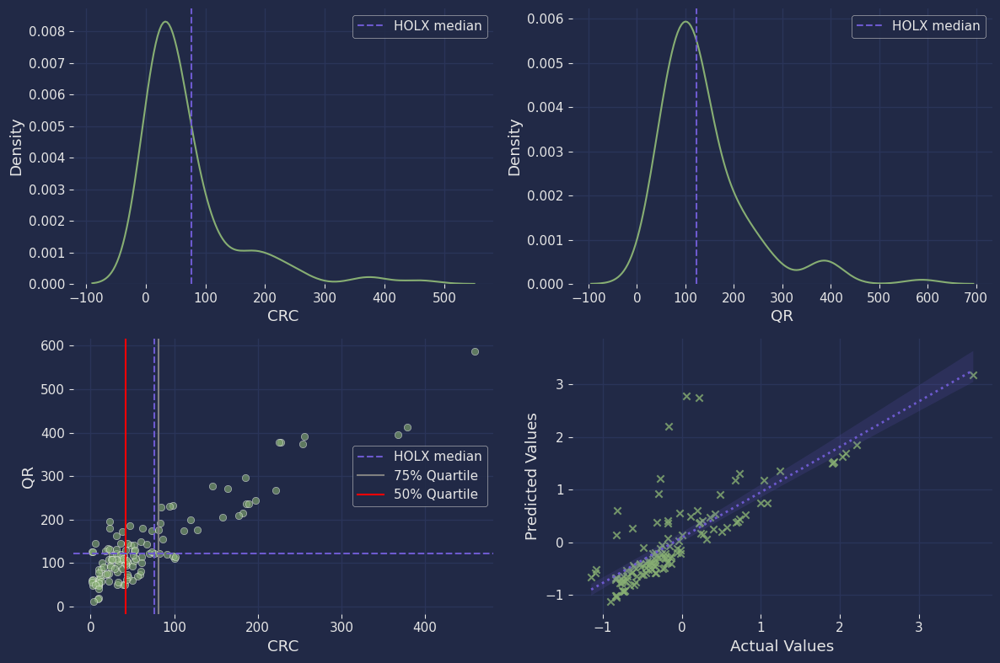

HOLX Median CRC: 76.0
HOLX Median QR: 123.0


In [156]:
HOLX_crc = hypno.iloc[53:56, 4].median()
HOLX_crc_avg = round(hypno.iloc[53:56, 4].median(), 2)

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
q3rt = np.quantile(hypno['CRC'], .75)
q2rt = np.quantile(hypno['CRC'], .5)

sns.kdeplot(hypno['CRC'], color='#87ae73', ax=axs[0, 0])
axs[0, 0].axvline(x=HOLX_crc, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 0].legend()
sns.kdeplot(hypno['QR'], color='#87ae73', ax=axs[0, 1])
axs[0, 1].axvline(x=HOLX_qr, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[0, 1].legend()
sns.scatterplot(data=hypno, x='CRC', y='QR', color='#87ae73', ax=axs[1, 0], alpha=0.6)
axs[1, 0].axvline(x=HOLX_crc, c='#6d5acf', label='HOLX median', linestyle='dashed')
axs[1, 0].axvline(x=q3rt, c='grey', label='75% Quartile')
axs[1, 0].axvline(x=q2rt, c='red', label='50% Quartile')
axs[1, 0].axhline(y=HOLX_qr, c='#6d5acf', linestyle='dashed')
axs[1, 0].legend()
sns.regplot(data=H5_compare, x='true', y='predicted', color='#87ae73', marker="x",
            line_kws={'color': '#6d5acf', 'lw': 2, 'ls': ':'}, ax=axs[1, 1])
axs[1, 1].set_xlabel('Actual Values')
axs[1, 1].set_ylabel('Predicted Values')

plt.tight_layout()
plt.show()
print(f'HOLX Median CRC: {HOLX_crc_avg}')
print(f'HOLX Median QR: {HOLX_qr_avg}')

* Quick Ratio, given HOLX's Cash Ratio, is off by as much as -1.57% (2014) with a median of 17.39% (2015). This does indicate effective CRC management in terms of surmassing QR.
* The KDE plots depct HOLX with a median for both variables in the top-half of the sample's distribution. Their potential exceeds other companies, identified with lower CRC in the scatter plot <50% quartile. The higher QR holding companies are positioned to do so from having a higher CRC figure or CRC:QR ratio. HOLX would require further expanding upon their CRC balances, aka cash and cash equivalent transactions, to advance the rankings. KDE plots are evidence of HOLX's cash and cash equivalent transactions as the main source benefitting HOLX's QR.
* Median CRC balance from 76 into 85<x<100 area would reign AVG QR balance of up to 175.

In [157]:
hypno.iloc[53:56]

,symbol,year,CR,QR,CRC,NCFI,NCFO,NI,TA,ESO,AVG volume (millions)
53,HOLX,2013,149.0,123.0,76.0,1.880e+07,4.938e+08,-1.173e+09,9.001e+09,2.690e+08,5.352e+06
54,HOLX,2014,253.0,199.0,120.0,-6.700e+07,5.084e+08,1.730e+07,8.415e+09,2.883e+08,1.380e+06
55,HOLX,2015,134.0,104.0,52.0,-8.610e+07,7.861e+08,1.316e+08,7.642e+09,2.800e+08,2.082e+06


In [158]:
hypno.CRC.median()

42.0

In [159]:
hypno.QR.median()

114.0

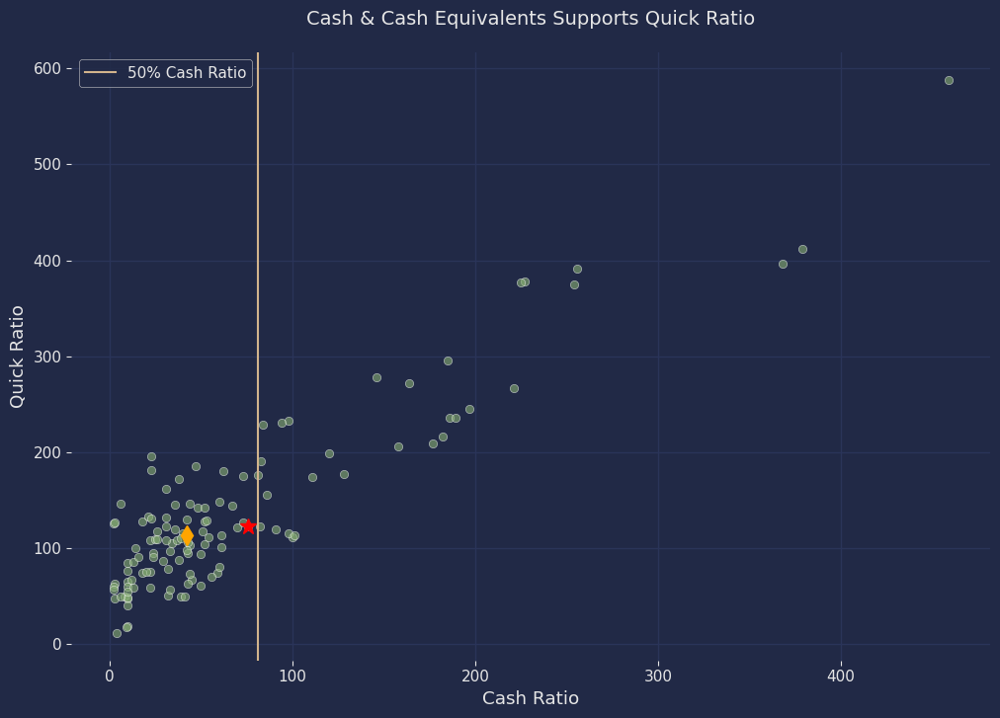

In [161]:
q4rt = np.quantile(hypno['QR'], .50)
fig, axs = plt.subplots(1,1,figsize=(12,8))
sns.scatterplot(data=hypno, x='CRC', y='QR', color='#87ae73', ax=axs, alpha=0.6)
axs.axvline(x=q3rt, c='tan', label='50% Cash Ratio')
axs.plot(76, 123, marker="*", color="red", markersize=12)
axs.plot(42, 114, marker="d", color="orange", markersize=10)
axs.set_title('Cash & Cash Equivalents Supports Quick Ratio')
axs.set_xlabel('Cash Ratio')
axs.set_ylabel('Quick Ratio')
axs.legend(loc='upper left')
plt.show()